<a href="https://colab.research.google.com/github/Elixirman/Blackbox/blob/main/Electricity_Access_Africa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dataset Information

## Artribute Information

# Dependencies

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from scipy.stats import chi2_contingency
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from sklearn.model_selection import train_test_split
import plotly.express as px
import plotly.graph_objects as go


# Data Importation

In [ ]:
data = pd.read_csv("/content/Meta_Electricity_Access_Africa.csv")


# Data Head

In [ ]:
data.head(3)

,Country Code,Country Name,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,AFW,Africa Western and Central,Africa Western and Central,Others,NaN,NaN,NaN,31.58,32.61,33.61,...,44.05,47.05,47.65,46.76,50.90,48.79,51.21,51.16,51.73,54.22
1,AGO,Angola,Sub-Saharan Africa,Lower middle income,NaN,NaN,NaN,NaN,NaN,NaN,...,37.26,38.40,32.00,42.00,41.79,42.91,45.29,45.63,46.96,48.22
2,BDI,Burundi,Sub-Saharan Africa,Low income,NaN,NaN,NaN,NaN,NaN,NaN,...,6.50,6.90,7.00,7.89,8.48,9.30,9.51,9.84,9.10,10.23


In [ ]:
# Setting Country Name As Index

datay = data.set_index('Country Name')
datay.head(3)

,Country Code,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Country Name,,,,,,,,,,,,,,,,,,,,,
Africa Western and Central,AFW,Africa Western and Central,Others,NaN,NaN,NaN,31.58,32.61,33.61,32.63,...,44.05,47.05,47.65,46.76,50.90,48.79,51.21,51.16,51.73,54.22
Angola,AGO,Sub-Saharan Africa,Lower middle income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,37.26,38.40,32.00,42.00,41.79,42.91,45.29,45.63,46.96,48.22
Burundi,BDI,Sub-Saharan Africa,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6.50,6.90,7.00,7.89,8.48,9.30,9.51,9.84,9.10,10.23


# Data Preprocessing

## (SID) Shape, Info & De-Stats

In [ ]:
# View Data Shape
datay.shape

(57, 35)

In [ ]:
# View Data info
datay.info()

<class 'pandas.core.frame.DataFrame'>
Index: 57 entries, Africa Western and Central to Zimbabwe
Data columns (total 35 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Country Code  57 non-null     object 
 1   Region        57 non-null     object 
 2   IncomeGroup   57 non-null     object 
 3   1990          4 non-null      float64
 4   1991          7 non-null      float64
 5   1992          15 non-null     float64
 6   1993          20 non-null     float64
 7   1994          23 non-null     float64
 8   1995          25 non-null     float64
 9   1996          32 non-null     float64
 10  1997          35 non-null     float64
 11  1998          37 non-null     float64
 12  1999          38 non-null     float64
 13  2000          52 non-null     float64
 14  2001          52 non-null     float64
 15  2002          53 non-null     float64
 16  2003          53 non-null     float64
 17  2004          53 non-null     float64
 18  2005  

In [ ]:
# Descritive Stats
datay.describe()

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
count,4.00000,7.000000,15.000000,20.000000,23.000000,25.000000,32.000000,35.000000,37.000000,38.000000,...,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000
mean,43.26000,31.238571,29.800667,28.744500,32.880870,32.520800,33.349063,31.557143,31.316757,31.926842,...,43.981091,44.870909,45.995636,46.894182,49.182545,50.113455,52.474000,53.234182,54.418727,55.893455
std,38.02434,31.850427,30.334554,27.296269,31.580929,30.538571,28.452305,28.816762,28.346356,28.357078,...,28.495383,28.650311,28.407144,27.882135,27.224585,26.941804,26.133301,26.697457,26.516136,26.350856
min,13.90000,5.600000,2.300000,1.550000,0.530000,2.470000,2.810000,1.030000,2.170000,2.070000,...,3.300000,3.810000,4.310000,4.810000,5.300000,4.200000,6.290000,6.770000,7.260000,7.750000
25%,23.95000,11.425000,8.000000,10.702500,8.345000,6.800000,10.952500,7.110000,7.160000,7.880000,...,19.585000,16.370000,23.240000,23.880000,28.035000,32.245000,37.230000,38.850000,40.445000,42.355000
50%,30.05000,26.920000,26.400000,26.500000,28.100000,28.860000,28.645000,28.260000,26.990000,27.335000,...,39.130000,40.640000,38.800000,42.000000,45.280000,46.210000,49.150000,48.050000,51.140000,52.510000
75%,49.36000,32.115000,34.400000,32.147500,36.415000,36.150000,37.855000,37.520000,40.700000,40.132500,...,56.235000,58.305000,63.000000,63.125000,64.350000,66.875000,66.730000,69.900000,70.430000,71.970000
max,99.04000,99.070000,99.100000,99.130000,99.150000,99.180000,99.200000,99.220000,99.240000,99.250000,...,99.700000,99.880000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


###De-Stats Visual

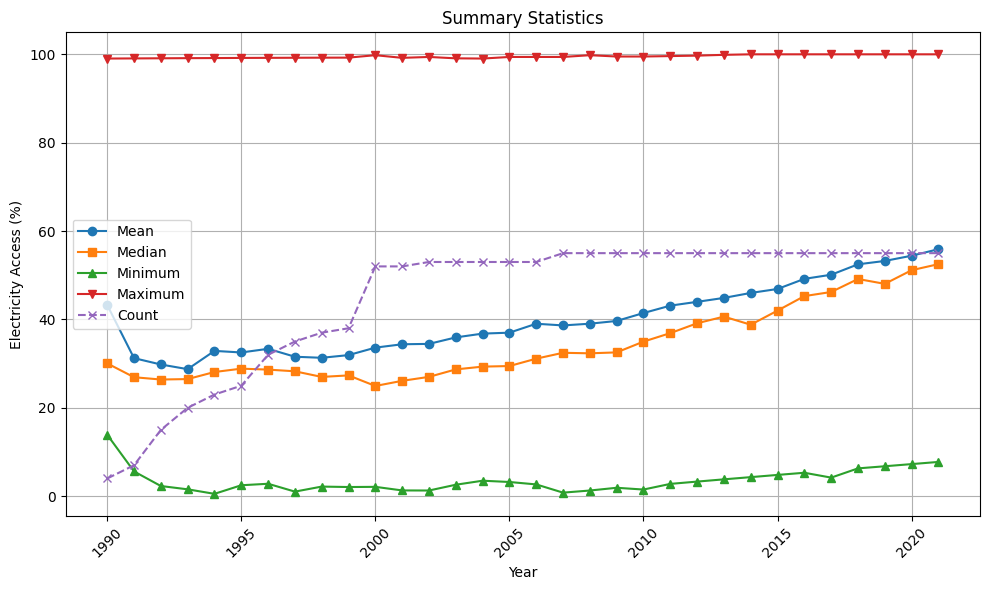

In [ ]:
# Data
summary_stats = datay.describe()

# Plot the data
plt.figure(figsize=(10, 6))
summary_stats.loc['mean'].plot(label='Mean', marker='o')
summary_stats.loc['50%'].plot(label='Median', marker='s')
summary_stats.loc['min'].plot(label='Minimum', marker='^')
summary_stats.loc['max'].plot(label='Maximum', marker='v')
summary_stats.loc['count'].plot(label='Count', marker='x', linestyle='--')
plt.title('Summary Statistics')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import plotly.graph_objs as go

# Data
summary_stats = datay.describe()

# Create traces for each statistic
traces = []
for stat in summary_stats.index:
    trace = go.Scatter(x=summary_stats.columns, y=summary_stats.loc[stat], mode='markers+lines', name=stat)
    traces.append(trace)

# Layout
layout = go.Layout(title='Summary Statistics',
                   xaxis=dict(title='Year', tickangle=45),
                   yaxis=dict(title='Electricity Access (%)'),
                   legend=dict(x=0, y=1, traceorder='normal', bgcolor='rgba(255, 255, 255, 0.5)'),
                   margin=dict(l=40, r=40, t=80, b=40),
                   hovermode='closest')

# Create figure
fig = go.Figure(data=traces, layout=layout)

# Show plot
fig.show()


## Numerical VS Categorical Column

In [ ]:
# Check data types of each column
print("Data Types:")
print(datay.dtypes)
print()

Data Types:
Country Code     object
Region           object
IncomeGroup      object
1990            float64
1991            float64
1992            float64
1993            float64
1994            float64
1995            float64
1996            float64
1997            float64
1998            float64
1999            float64
2000            float64
2001            float64
2002            float64
2003            float64
2004            float64
2005            float64
2006            float64
2007            float64
2008            float64
2009            float64
2010            float64
2011            float64
2012            float64
2013            float64
2014            float64
2015            float64
2016            float64
2017            float64
2018            float64
2019            float64
2020            float64
2021            float64
dtype: object



In [ ]:
# Separate numerical and categorical variables
numerical_vars = datay.select_dtypes(include=['int64', 'float64']).columns
categorical_vars = datay.select_dtypes(include=['object']).columns

# Display numerical and categorical variables
print("Numerical Variables:")
print(numerical_vars)
print()

print("Categorical Variables:")
print(categorical_vars)

Numerical Variables:
Index(['1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998',
       '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007',
       '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016',
       '2017', '2018', '2019', '2020', '2021'],
      dtype='object')

Categorical Variables:
Index(['Country Code', 'Region', 'IncomeGroup'], dtype='object')


## Missing Values

In [ ]:
datay.isnull().sum()

Country Code     0
Region           0
IncomeGroup      0
1990            53
1991            50
1992            42
1993            37
1994            34
1995            32
1996            25
1997            22
1998            20
1999            19
2000             5
2001             5
2002             4
2003             4
2004             4
2005             4
2006             4
2007             2
2008             2
2009             2
2010             2
2011             2
2012             2
2013             2
2014             2
2015             2
2016             2
2017             2
2018             2
2019             2
2020             2
2021             2
dtype: int64

In [ ]:
# Drop  and 'Country Code' columns
data_without_country_info = datay.drop(['Country Code'], axis=1)

# Calculate the percentage of missing values in each column
missing_percentage = (data_without_country_info.isnull().mean()) * 100

# Display the result
print("Percentage of missing values in each column (excluding 'Country Name' and 'Country Code'):")
for column, percentage in missing_percentage.items():
    print(f"{column}: {round(percentage, 2)}%")


Percentage of missing values in each column (excluding 'Country Name' and 'Country Code'):
Region: 0.0%
IncomeGroup: 0.0%
1990: 92.98%
1991: 87.72%
1992: 73.68%
1993: 64.91%
1994: 59.65%
1995: 56.14%
1996: 43.86%
1997: 38.6%
1998: 35.09%
1999: 33.33%
2000: 8.77%
2001: 8.77%
2002: 7.02%
2003: 7.02%
2004: 7.02%
2005: 7.02%
2006: 7.02%
2007: 3.51%
2008: 3.51%
2009: 3.51%
2010: 3.51%
2011: 3.51%
2012: 3.51%
2013: 3.51%
2014: 3.51%
2015: 3.51%
2016: 3.51%
2017: 3.51%
2018: 3.51%
2019: 3.51%
2020: 3.51%
2021: 3.51%


### Missing Rows Eliminaton

In [ ]:
datay.index

Index(['Africa Western and Central', 'Angola', 'Burundi', 'Benin',
       'Burkina Faso', 'Botswana', 'Central African Republic', 'Côte d'Ivoire',
       'Cameroon', 'Congo, Dem. Rep.', 'Congo, Rep.', 'Comoros', 'Cabo Verde',
       'Djibouti', 'Algeria', 'Egypt, Arab Rep.', 'Eritrea', 'Ethiopia',
       'Gabon', 'Ghana', 'Guinea', 'Gambia, The', 'Guinea-Bissau',
       'Equatorial Guinea', 'Kenya', 'Liberia', 'Libya', 'Lesotho', 'Morocco',
       'Madagascar', 'Mali', 'Mozambique', 'Mauritania', 'Mauritius', 'Malawi',
       'Namibia', 'Niger', 'Nigeria', 'Rwanda', 'Sudan', 'Senegal',
       'Sierra Leone', 'Somalia', 'Sub-Saharan Africa (excluding high income)',
       'South Sudan', 'Sub-Saharan Africa', 'São Tomé and Principe',
       'Eswatini', 'Seychelles', 'Chad', 'Togo', 'Tunisia', 'Tanzania',
       'Uganda', 'South Africa', 'Zambia', 'Zimbabwe'],
      dtype='object', name='Country Name')

In [ ]:
datay = datay.drop(["Côte d'Ivoire", "São Tomé and Principe"])

datay.index

Index(['Africa Western and Central', 'Angola', 'Burundi', 'Benin',
       'Burkina Faso', 'Botswana', 'Central African Republic', 'Cameroon',
       'Congo, Dem. Rep.', 'Congo, Rep.', 'Comoros', 'Cabo Verde', 'Djibouti',
       'Algeria', 'Egypt, Arab Rep.', 'Eritrea', 'Ethiopia', 'Gabon', 'Ghana',
       'Guinea', 'Gambia, The', 'Guinea-Bissau', 'Equatorial Guinea', 'Kenya',
       'Liberia', 'Libya', 'Lesotho', 'Morocco', 'Madagascar', 'Mali',
       'Mozambique', 'Mauritania', 'Mauritius', 'Malawi', 'Namibia', 'Niger',
       'Nigeria', 'Rwanda', 'Sudan', 'Senegal', 'Sierra Leone', 'Somalia',
       'Sub-Saharan Africa (excluding high income)', 'South Sudan',
       'Sub-Saharan Africa', 'Eswatini', 'Seychelles', 'Chad', 'Togo',
       'Tunisia', 'Tanzania', 'Uganda', 'South Africa', 'Zambia', 'Zimbabwe'],
      dtype='object', name='Country Name')

# Aggregation & VIsuals

In [ ]:
# Recall Descriptive
datay.describe()

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
count,4.00000,7.000000,15.000000,20.000000,23.000000,25.000000,32.000000,35.000000,37.000000,38.000000,...,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000
mean,43.26000,31.238571,29.800667,28.744500,32.880870,32.520800,33.349062,31.557143,31.316757,31.926842,...,43.981091,44.870909,45.995636,46.894182,49.182545,50.113455,52.474000,53.234182,54.418727,55.893455
std,38.02434,31.850427,30.334554,27.296269,31.580929,30.538571,28.452305,28.816762,28.346356,28.357078,...,28.495383,28.650311,28.407144,27.882135,27.224585,26.941804,26.133301,26.697457,26.516136,26.350856
min,13.90000,5.600000,2.300000,1.550000,0.530000,2.470000,2.810000,1.030000,2.170000,2.070000,...,3.300000,3.810000,4.310000,4.810000,5.300000,4.200000,6.290000,6.770000,7.260000,7.750000
25%,23.95000,11.425000,8.000000,10.702500,8.345000,6.800000,10.952500,7.110000,7.160000,7.880000,...,19.585000,16.370000,23.240000,23.880000,28.035000,32.245000,37.230000,38.850000,40.445000,42.355000
50%,30.05000,26.920000,26.400000,26.500000,28.100000,28.860000,28.645000,28.260000,26.990000,27.335000,...,39.130000,40.640000,38.800000,42.000000,45.280000,46.210000,49.150000,48.050000,51.140000,52.510000
75%,49.36000,32.115000,34.400000,32.147500,36.415000,36.150000,37.855000,37.520000,40.700000,40.132500,...,56.235000,58.305000,63.000000,63.125000,64.350000,66.875000,66.730000,69.900000,70.430000,71.970000
max,99.04000,99.070000,99.100000,99.130000,99.150000,99.180000,99.200000,99.220000,99.240000,99.250000,...,99.700000,99.880000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


### Minimum Electricity Access

In [ ]:
# Eletricity Access minimum values from 1990 to 2021

min_values = datay.loc[:, '1990':'2021'].min(axis=1)

print("Minimum Energy access values from 1990 to 2021:\n", min_values)


Minimum Energy access values from 1990 to 2021:
 Country Name
Africa Western and Central                    31.58
Angola                                        20.00
Burundi                                        2.07
Benin                                         14.50
Burkina Faso                                   6.10
Botswana                                       9.40
Central African Republic                       3.00
Cameroon                                      29.00
Congo, Dem. Rep.                               6.00
Congo, Rep.                                   29.42
Comoros                                       28.90
Cabo Verde                                    58.56
Djibouti                                      49.70
Algeria                                       98.61
Egypt, Arab Rep.                              93.40
Eritrea                                       22.90
Ethiopia                                      10.22
Gabon                                         73.60
Gh

#### Min Electricity Access VIsuals

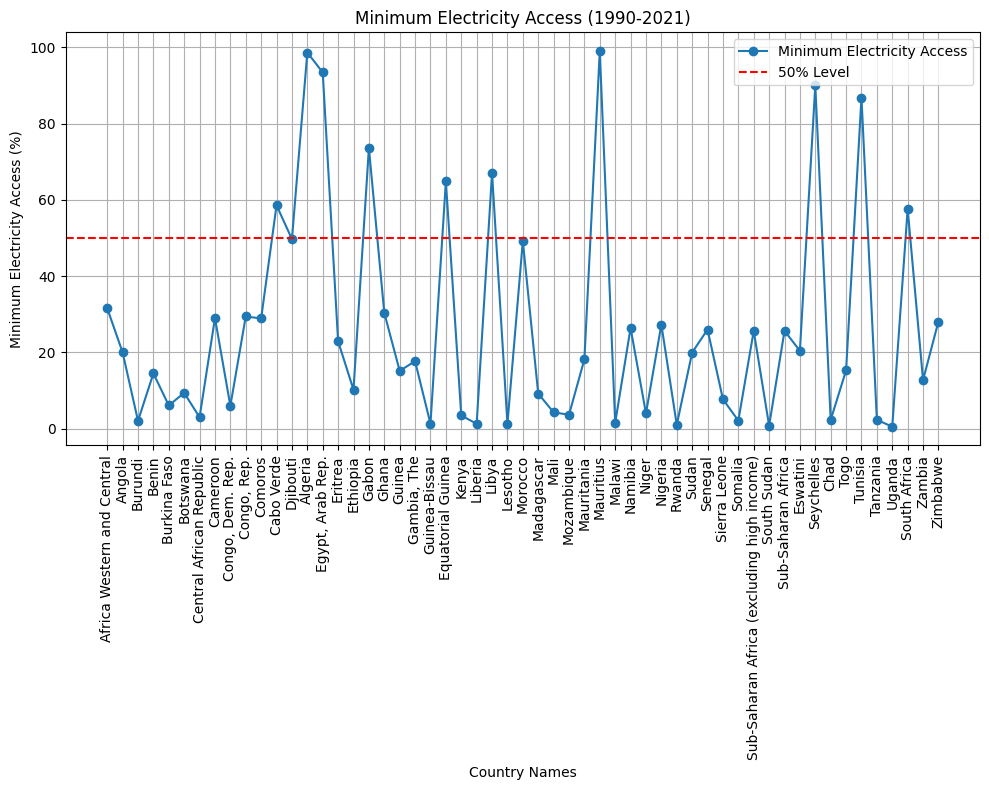

In [ ]:
# Plot the graph
plt.figure(figsize=(10, 8))
plt.plot(min_values.index, min_values.values, marker='o', linestyle='-', label='Minimum Electricity Access')
plt.title('Minimum Electricity Access (1990-2021)')
plt.xlabel('Country Names')
plt.ylabel('Minimum Electricity Access (%)')
plt.grid(True)
plt.xticks(rotation=90)

# Add a red horizontal line at the 50% level
plt.axhline(y=50, color='red', linestyle='--', label='50% Level')

# Add legend
plt.legend()

plt.tight_layout()
plt.show()


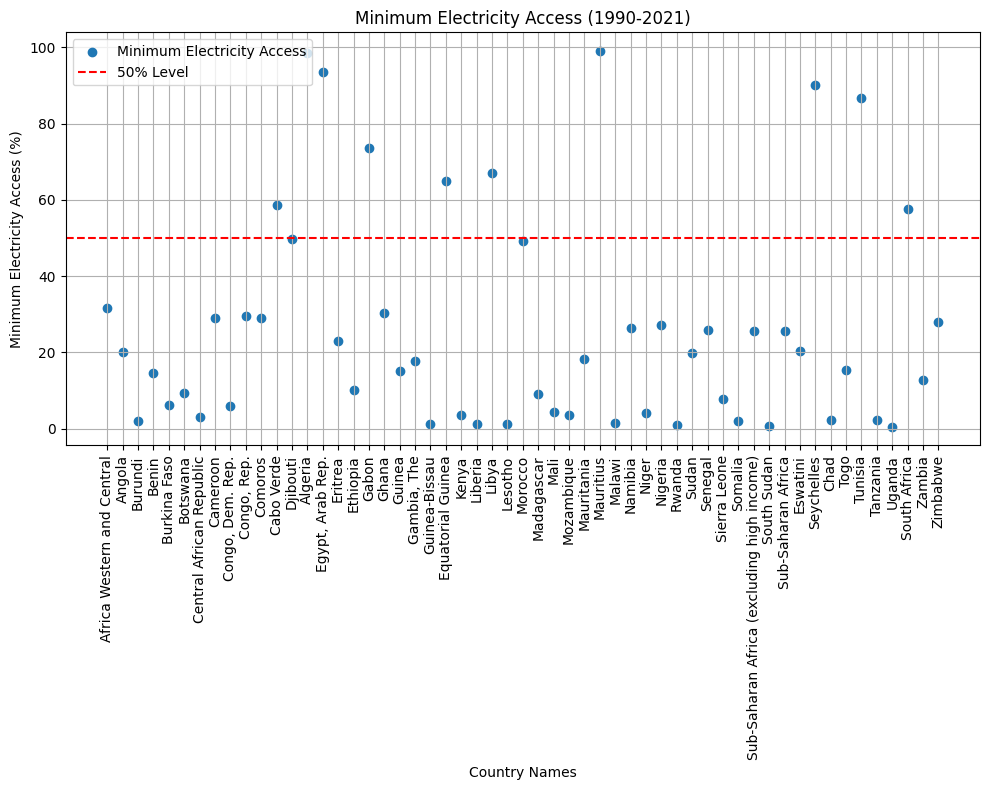

In [ ]:
# Plot the graph as a scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(min_values.index, min_values.values, marker='o', label='Minimum Electricity Access')

plt.title('Minimum Electricity Access (1990-2021)')
plt.xlabel('Country Names')
plt.ylabel('Minimum Electricity Access (%)')
plt.grid(True)
plt.xticks(rotation=90)

# Add a red horizontal line at the 50% level
plt.axhline(y=50, color='red', linestyle='--', label='50% Level')

# Add legend at upper left
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()


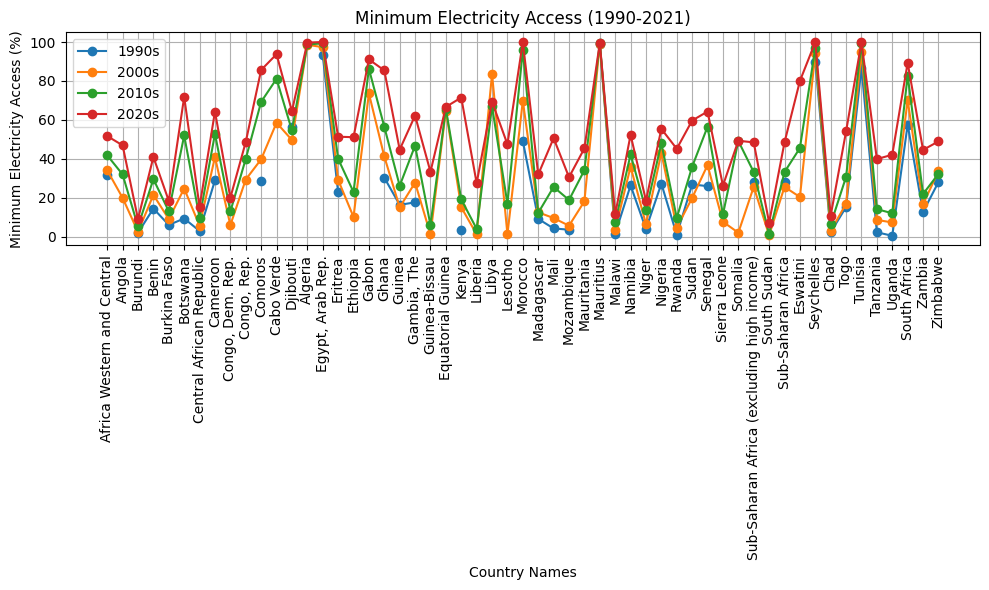

In [ ]:
# Define the years corresponding to each decade
decade_years = {'1990s': ['1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999'],
                '2000s': ['2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009'],
                '2010s': ['2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019'],
                '2020s': ['2020', '2021']}

# Calculate the maximum electricity access for each decade
decade_min_values = {}
for decade, years in decade_years.items():
    decade_data = datay.loc[:, years]  # Select columns corresponding to the years in the current decade
    decade_min_values[decade] = decade_data.min(axis=1)

# Plot the maximum electricity access for each decade
plt.figure(figsize=(10, 6))
for decade, values in decade_min_values.items():
    plt.plot(values.index, values.values, marker='o', linestyle='-', label=decade)

plt.title('Minimum Electricity Access (1990-2021)')
plt.xlabel('Country Names')
plt.ylabel('Minimum Electricity Access (%)')
plt.grid(True)
plt.xticks(rotation=90)  # Rotate x-axis labels by 90 degrees
plt.legend()
plt.tight_layout()
plt.show()


#### High & Low of Minimum Electricity Access

##### Highest Minimum Access

In [ ]:
# Electricity Access minimum values from 1990 to 2021 with (highest minimum)
min_values = datay.loc[:, '1990':'2021'].min(axis=1)
high_min_value = min_values.max()
country_with_highest_min = min_values.idxmax()

print("Highest of minimum Energy access values from 1990 to 2021:", high_min_value,"%")
print("Country with highest minimum access:", country_with_highest_min)


Highest of minimum Energy access values from 1990 to 2021: 98.98 %
Country with highest minimum access: Mauritius


##### Lowest Minimum Access

In [ ]:
# Electricity Access minimum values from 1990 to 2021 with (lowest minimum)
min_values = datay.loc[:, '1990':'2021'].min(axis=1)
low_min_value = min_values.min()
country_with_lowest_min = min_values.idxmin()

print("Lowest of minimum Energy access values from 1990 to 2021:", low_min_value,"%")
print("Country with lowest minimum access:", country_with_lowest_min)


Lowest of minimum Energy access values from 1990 to 2021: 0.53 %
Country with lowest minimum access: Uganda


##### Hi-Low Min Visual

In [ ]:
# Find the highest and lowest minimum values
high_min_value = min_values.max()
country_with_highest_min = min_values.idxmax()

low_min_value = min_values.min()
country_with_lowest_min = min_values.idxmin()

# Print the highest and lowest minimum values
print("Highest of minimum Energy access values from 1990 to 2021:", high_min_value, "%")
print("Country with highest minimum access:", country_with_highest_min)
print("Lowest of minimum Energy access values from 1990 to 2021:", low_min_value, "%")
print("Country with lowest minimum access:", country_with_lowest_min)

# Create a DataFrame with the minimum values for plotting
min_values_df = pd.DataFrame(min_values, columns=['Min Electricity Access'])
min_values_df['Country'] = min_values.index

# Create an interactive bar plot using Plotly
fig = px.bar(min_values_df, x='Country', y='Min Electricity Access',
             title='Minimum Electricity Access Values from 1990 to 2021',
             labels={'Min Electricity Access': 'Electricity Access (%)'},
             hover_name='Country')

# Highlight the highest and lowest minimum values
fig.add_scatter(x=[country_with_highest_min], y=[high_min_value],
                mode='markers+text', text=['Highest Minimum'],
                marker=dict(color='green', size=15), textposition='top center')

fig.add_scatter(x=[country_with_lowest_min], y=[low_min_value],
                mode='markers+text', text=['Lowest Minimum'],
                marker=dict(color='red', size=15), textposition='top center')

# Customize the layout
fig.update_layout(xaxis_title='Country', yaxis_title='Minimum Electricity Access (%)',
                  xaxis={'categoryorder':'total descending'},
                  yaxis=dict(showgrid=True, gridcolor='rgba(204, 204, 204, 0.5)'),
                  template='plotly_white')

# Show the interactive plot
fig.show()

Highest of minimum Energy access values from 1990 to 2021: 98.98 %
Country with highest minimum access: Mauritius
Lowest of minimum Energy access values from 1990 to 2021: 0.53 %
Country with lowest minimum access: Uganda


using Seaborn

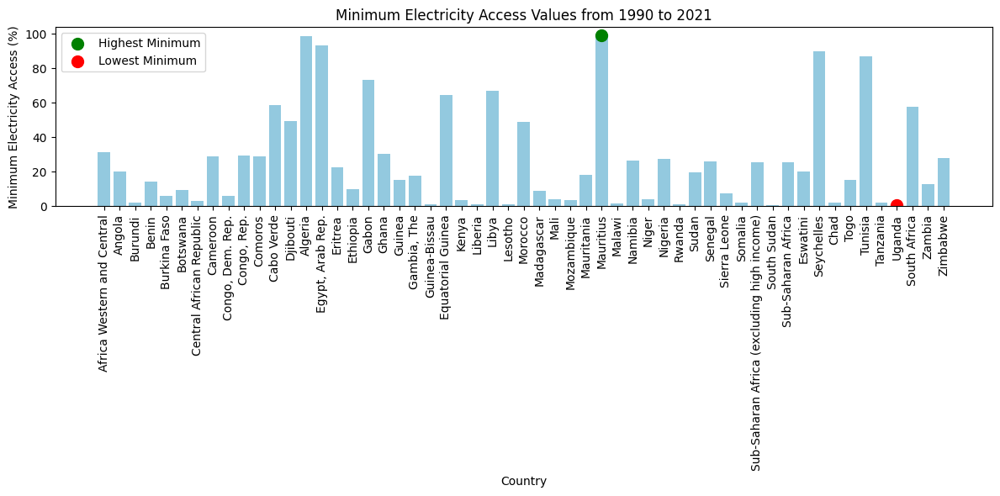

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the minimum values using Seaborn with custom color
plt.figure(figsize=(12, 6))
sns.barplot(x='Country', y='Min Electricity Access', data=min_values_df, color='skyblue')

# Highlight the highest and lowest minimum values
plt.scatter([country_with_highest_min], [high_min_value], color='green', s=100, label='Highest Minimum')
plt.scatter([country_with_lowest_min], [low_min_value], color='red', s=100, label='Lowest Minimum')

# Customize the plot
plt.title('Minimum Electricity Access Values from 1990 to 2021')
plt.xlabel('Country')
plt.ylabel('Minimum Electricity Access (%)')
plt.xticks(rotation=90)
plt.legend()

# Show plot
plt.tight_layout()
plt.show()


Using Matplot

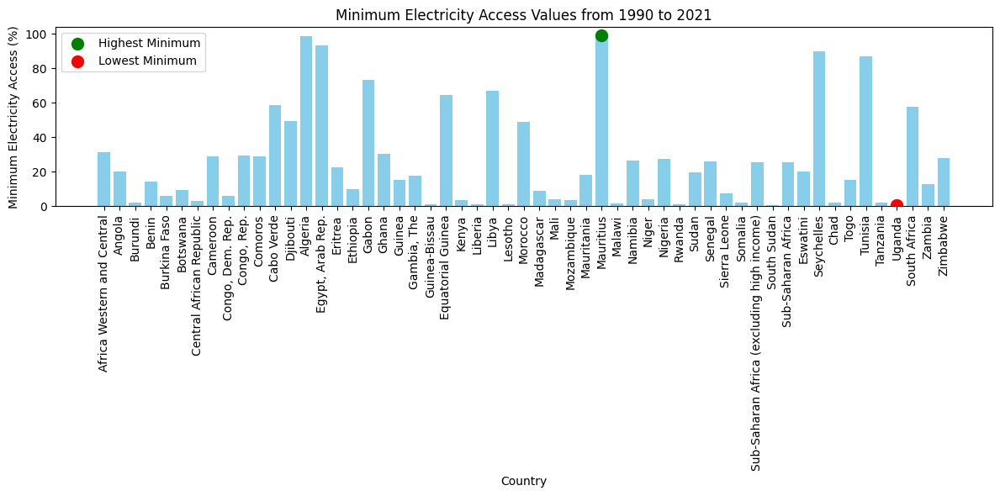

In [ ]:

# Plot the minimum values using Matplotlib
plt.figure(figsize=(12, 6))
plt.bar(min_values_df['Country'], min_values_df['Min Electricity Access'], color='skyblue')

# Highlight the highest and lowest minimum values
plt.scatter(country_with_highest_min, high_min_value, color='green', s=100, label='Highest Minimum')
plt.scatter(country_with_lowest_min, low_min_value, color='red', s=100, label='Lowest Minimum')

# Customize the plot
plt.title('Minimum Electricity Access Values from 1990 to 2021')
plt.xlabel('Country')
plt.ylabel('Minimum Electricity Access (%)')
plt.xticks(rotation=90)
plt.legend()

# Show plot
plt.tight_layout()
plt.show()


### Maximum Electricity Access

In [ ]:
# Eletricity Access maximum values from 1990 to 2021

max_values = datay.loc[:, '1990':'2021'].max(axis=1)

print("Maximum Energy access values from 1990 to 2021:\n", max_values)

Maximum Energy access values from 1990 to 2021:
 Country Name
Africa Western and Central                     54.22
Angola                                         48.22
Burundi                                        10.23
Benin                                          41.97
Burkina Faso                                   19.20
Botswana                                       73.73
Central African Republic                       15.68
Cameroon                                       65.45
Congo, Dem. Rep.                               20.77
Congo, Rep.                                    49.66
Comoros                                        87.94
Cabo Verde                                     95.52
Djibouti                                       65.44
Algeria                                        99.79
Egypt, Arab Rep.                              100.00
Eritrea                                        52.51
Ethiopia                                       54.19
Gabon                                

#### Max Electricity Access Visual

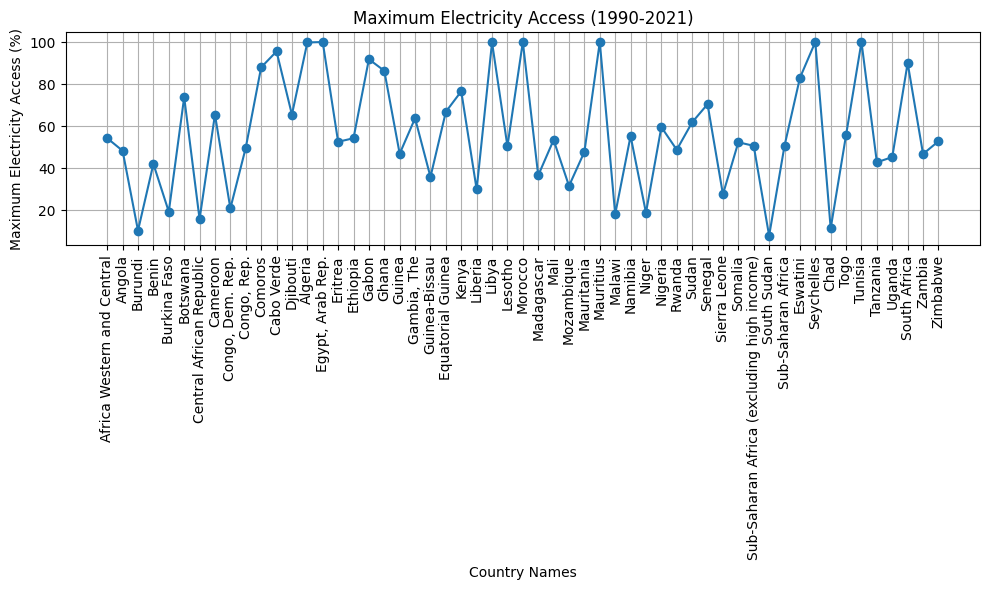

In [ ]:
# Plot the graph
plt.figure(figsize=(10, 6))
plt.plot(max_values.index, max_values.values, marker='o', linestyle='-')
plt.title('Maximum Electricity Access (1990-2021)')
plt.xlabel('Country Names')
plt.ylabel('Maximum Electricity Access (%)')
plt.grid(True)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


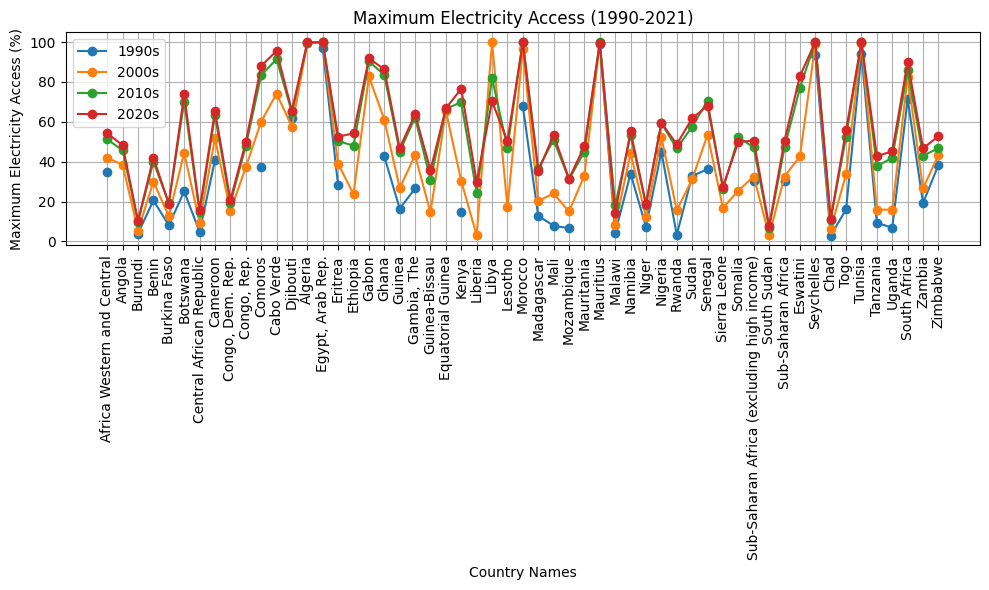

In [ ]:
# Assuming you have your dataset loaded as 'datay'

# Define the years corresponding to each decade
decade_years = {'1990s': ['1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999'],
                '2000s': ['2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009'],
                '2010s': ['2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019'],
                '2020s': ['2020', '2021']}

# Calculate the maximum electricity access for each decade
decade_max_values = {}
for decade, years in decade_years.items():
    decade_data = datay.loc[:, years]  # Select columns corresponding to the years in the current decade
    decade_max_values[decade] = decade_data.max(axis=1)

# Plot the maximum electricity access for each decade
plt.figure(figsize=(10, 6))
for decade, values in decade_max_values.items():
    plt.plot(values.index, values.values, marker='o', linestyle='-', label=decade)

plt.title('Maximum Electricity Access (1990-2021)')
plt.xlabel('Country Names')
plt.ylabel('Maximum Electricity Access (%)')
plt.grid(True)
plt.xticks(rotation=90)  # Rotate x-axis labels by 90 degrees
plt.legend()
plt.tight_layout()
plt.show()


#### High & Low of Maximum Electricity Access

##### Highest Maximum Access

In [ ]:
# Electricity Access maximum values from 1990 to 2021 with (highest maximum)
max_values = datay.loc[:, '1990':'2021'].max(axis=1)
high_max_value = max_values.max()
country_with_highest_max = max_values.idxmax()

print("Highest of maximum Energy access values from 1990 to 2021:", high_max_value,"%")
print("Countries with highest maximum access:", country_with_highest_max)


Highest of maximum Energy access values from 1990 to 2021: 100.0 %
Countries with highest maximum access: Egypt, Arab Rep.


##### Lowest Maximum Access

In [ ]:
# Electricity Access maximum values from 1990 to 2021 with (lowest maximum)
max_values = datay.loc[:, '1990':'2021'].max(axis=1)
low_max_value = max_values.min()
country_with_lowest_max = max_values.idxmin()

print("Lowest of maximum Energy access values from 1990 to 2021:", low_max_value,"%")
print("Country with lowest maximum access:", country_with_lowest_max)


Lowest of maximum Energy access values from 1990 to 2021: 7.75 %
Country with lowest maximum access: South Sudan


##### Hi-Low Max Visual

In [ ]:
# Find the highest and lowest maximum values
high_max_value = max_values.max()
country_with_highest_max = max_values.idxmax()

low_max_value = max_values.min()
country_with_lowest_max = max_values.idxmin()

# Print the highest and lowest maximum values
print("Highest of maximum Energy access values from 1990 to 2021:", high_max_value, "%")
print("Country with highest maximum access:", country_with_highest_max)
print("Lowest of maximum Energy access values from 1990 to 2021:", low_max_value, "%")
print("Country with lowest maximum access:", country_with_lowest_max)

# Create a DataFrame with the maximum values for plotting
max_values_df = pd.DataFrame(max_values, columns=['Max Electricity Access'])
max_values_df['Country'] = max_values.index

# Create an interactive bar plot using Plotly
fig = px.bar(max_values_df, x='Country', y='Max Electricity Access',
             title='Maximum Electricity Access Values from 1990 to 2021',
             labels={'Max Electricity Access': 'Electricity Access (%)'},
             hover_name='Country')

# Highlight the highest and lowest maximum values
fig.add_scatter(x=[country_with_highest_max], y=[high_max_value],
                mode='markers+text', text=['Highest Maximum'],
                marker=dict(color='green', size=15), textposition='top center')

fig.add_scatter(x=[country_with_lowest_max], y=[low_max_value],
                mode='markers+text', text=['Lowest Maximum'],
                marker=dict(color='red', size=15), textposition='top center')

# Customize the layout
fig.update_layout(xaxis_title='Country', yaxis_title='Maximum Electricity Access (%)',
                  xaxis={'categoryorder':'total descending'},
                  yaxis=dict(showgrid=True, gridcolor='rgba(204, 204, 204, 0.5)'),
                  template='plotly_white')

# Show the interactive plot
fig.show()

Highest of maximum Energy access values from 1990 to 2021: 100.0 %
Country with highest maximum access: Egypt, Arab Rep.
Lowest of maximum Energy access values from 1990 to 2021: 7.75 %
Country with lowest maximum access: South Sudan


Usning Matplot

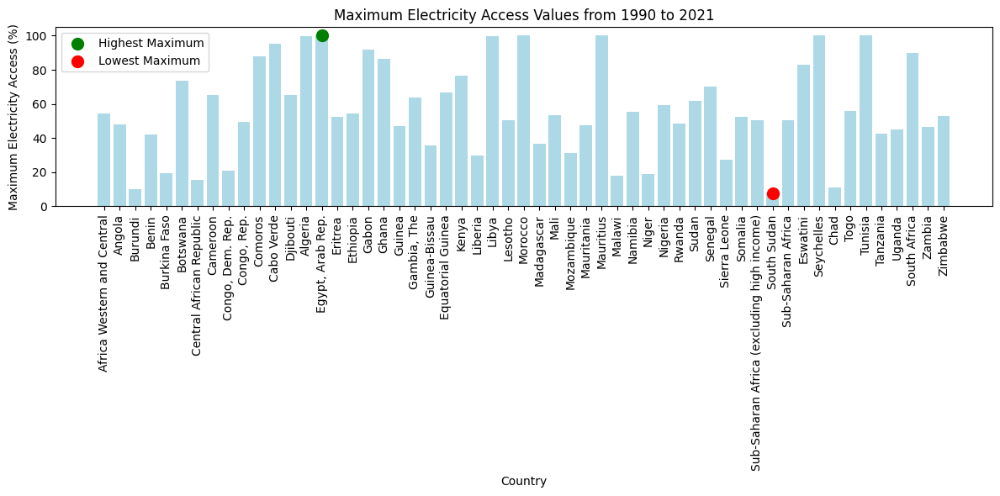

In [ ]:
import matplotlib.pyplot as plt

# Plot the maximum values using Matplotlib
plt.figure(figsize=(12, 6))
plt.bar(max_values_df['Country'], max_values_df['Max Electricity Access'], color='lightblue')

# Highlight the highest and lowest maximum values
plt.scatter(country_with_highest_max, high_max_value, color='green', s=100, label='Highest Maximum')
plt.scatter(country_with_lowest_max, low_max_value, color='red', s=100, label='Lowest Maximum')

# Customize the plot
plt.title('Maximum Electricity Access Values from 1990 to 2021')
plt.xlabel('Country')
plt.ylabel('Maximum Electricity Access (%)')
plt.xticks(rotation=90)
plt.legend()

# Show plot
plt.tight_layout()
plt.show()


### Mean/Average Electricity Access

In [ ]:
# Eletricity Access mean values from 1990 to 2021

mean_values = datay.loc[:, '1990':'2021'].mean(axis=1)

print("Mean Energy access values from 1990 to 2021:\n", mean_values)

Mean Energy access values from 1990 to 2021:
 Country Name
Africa Western and Central                    41.269310
Angola                                        35.735000
Burundi                                        5.769583
Benin                                         29.685769
Burkina Faso                                  12.272414
Botswana                                      40.594516
Central African Republic                       9.115926
Cameroon                                      48.489677
Congo, Dem. Rep.                              13.430455
Congo, Rep.                                   39.626364
Comoros                                       59.623462
Cabo Verde                                    77.672273
Djibouti                                      58.249231
Algeria                                       99.061818
Egypt, Arab Rep.                              98.277333
Eritrea                                       37.978519
Ethiopia                                     

#### Mean Electricity Access Visuals

Line Graph

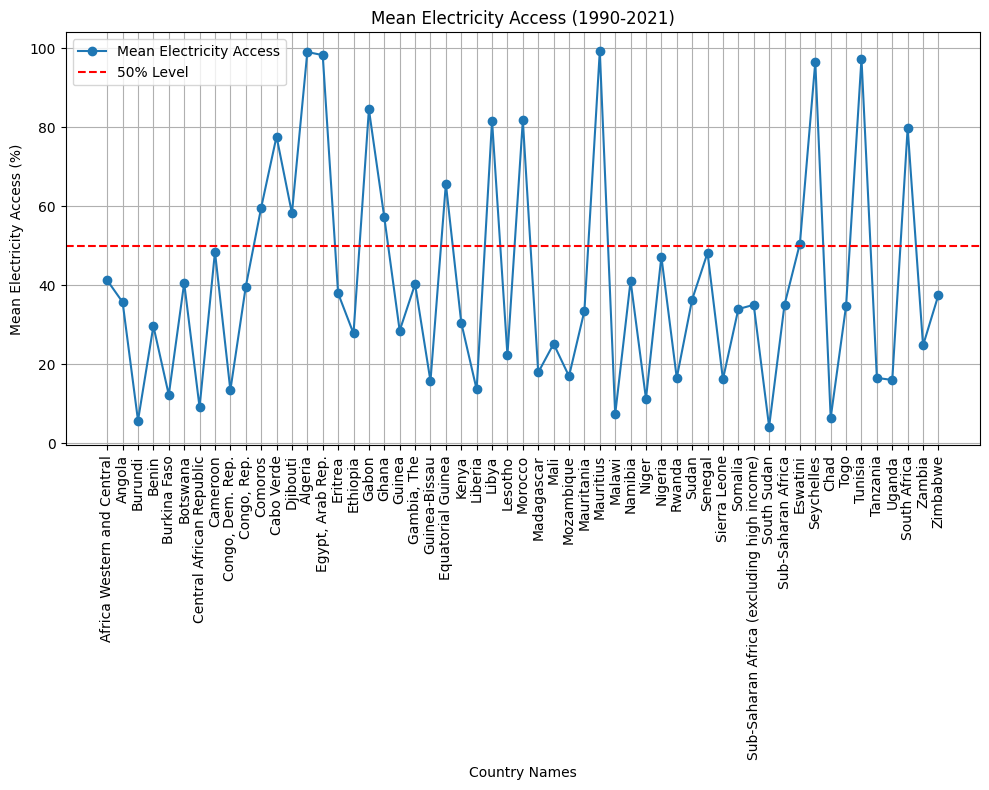

In [ ]:
# Plot the graph
plt.figure(figsize=(10, 8))
plt.plot(mean_values.index, mean_values.values, marker='o', linestyle='-', label='Mean Electricity Access')
plt.title('Mean Electricity Access (1990-2021)')
plt.xlabel('Country Names')
plt.ylabel('Mean Electricity Access (%)')
plt.grid(True)
plt.xticks(rotation=90)

# Add a red horizontal line at the 50% level
plt.axhline(y=50, color='red', linestyle='--', label='50% Level')

# Add legend
plt.legend()

plt.tight_layout()
plt.show()


Scatter Plot

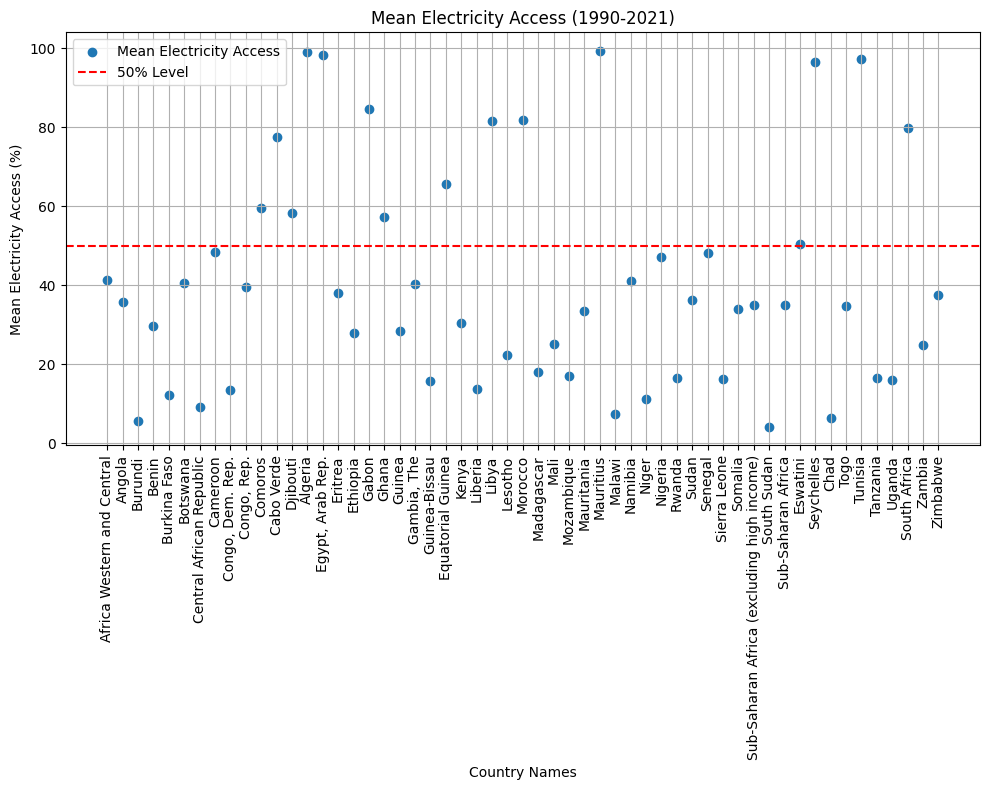

In [ ]:
# Plot the graph as a scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(mean_values.index, mean_values.values, marker='o', label='Mean Electricity Access')

plt.title('Mean Electricity Access (1990-2021)')
plt.xlabel('Country Names')
plt.ylabel('Mean Electricity Access (%)')
plt.grid(True)
plt.xticks(rotation=90)

# Add a red horizontal line at the 50% level
plt.axhline(y=50, color='red', linestyle='--', label='50% Level')

# Add legend at upper left
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()


In [ ]:
# Create a DataFrame with the mean values for plotting
mean_values_df = pd.DataFrame(mean_values, columns=['Mean Electricity Access'])
mean_values_df['Country'] = mean_values.index

# Create an interactive scatter plot using Plotly
fig = px.scatter(mean_values_df, x='Country', y='Mean Electricity Access',
                 title='Mean Electricity Access (1990-2021)',
                 labels={'Mean Electricity Access': 'Electricity Access (%)'},
                 hover_name='Country')

# Add a red horizontal line at the 50% level
fig.add_hline(y=50, line_color='red', line_dash='dash', annotation_text='50% Level', annotation_position='bottom right')

# Customize the layout
fig.update_layout(xaxis_title='Country', yaxis_title='Mean Electricity Access (%)',
                  xaxis={'categoryorder':'total descending'},
                  yaxis=dict(showgrid=True, gridcolor='rgba(204, 204, 204, 0.5)'),
                  template='plotly_white',
                  margin=dict(l=40, r=40, t=40, b=100))

# Rotate x-axis labels for better readability
fig.update_xaxes(tickangle=90)

# Show the interactive plot
fig.show()

Using Matplotlib

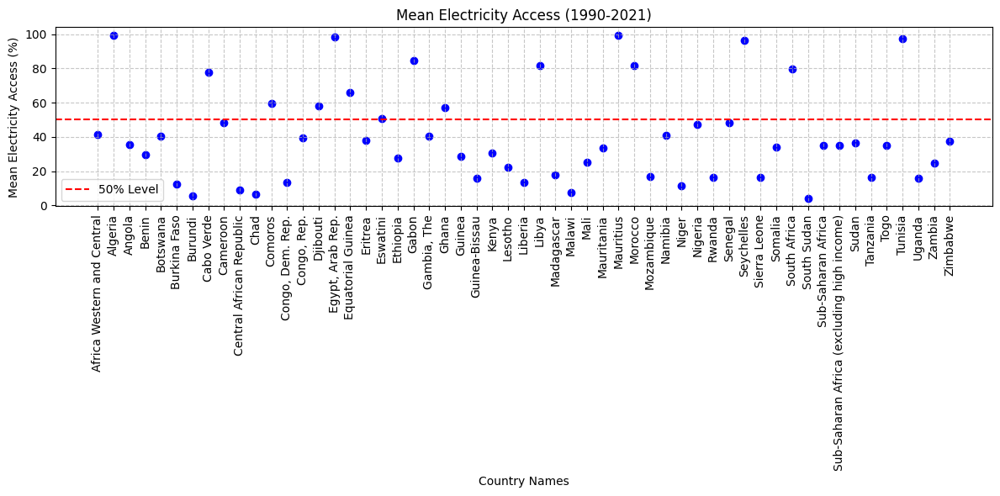

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Create a DataFrame with the mean values for plotting
mean_values_df = pd.DataFrame(mean_values, columns=['Mean Electricity Access'])
mean_values_df['Country'] = mean_values.index

# Sort the DataFrame by country names in ascending order
mean_values_df.sort_values(by='Country', inplace=True)

# Plot the mean values using Matplotlib
plt.figure(figsize=(12, 6))
plt.scatter(mean_values_df['Country'], mean_values_df['Mean Electricity Access'], color='blue')

# Add a red horizontal line at the 50% level
plt.axhline(y=50, color='red', linestyle='--', label='50% Level')

# Customize the plot
plt.title('Mean Electricity Access (1990-2021)')
plt.xlabel('Country Names')
plt.ylabel('Mean Electricity Access (%)')
plt.xticks(rotation=90)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

# Show plot
plt.tight_layout()
plt.show()


Decade Plot

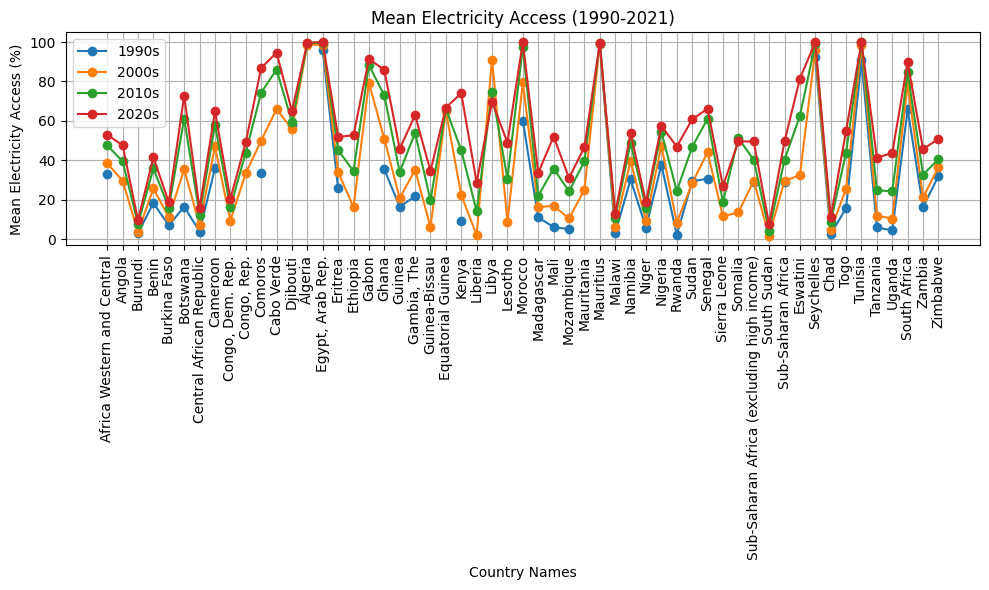

In [ ]:
# Assuming you have your dataset loaded as 'datay'

# Define the years corresponding to each decade
decade_years = {'1990s': ['1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999'],
                '2000s': ['2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009'],
                '2010s': ['2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019'],
                '2020s': ['2020', '2021']}

# Calculate the mean electricity access for each decade
decade_mean_values = {}
for decade, years in decade_years.items():
    decade_data = datay.loc[:, years]  # Select columns corresponding to the years in the current decade
    decade_mean_values[decade] = decade_data.mean(axis=1)

# Plot the maximum electricity access for each decade
plt.figure(figsize=(10, 6))
for decade, values in decade_mean_values.items():
    plt.plot(values.index, values.values, marker='o', linestyle='-', label=decade)

plt.title('Mean Electricity Access (1990-2021)')
plt.xlabel('Country Names')
plt.ylabel('Mean Electricity Access (%)')
plt.grid(True)
plt.xticks(rotation=90)  # Rotate x-axis labels by 90 degrees
plt.legend()
plt.tight_layout()
plt.show()


### TOP 5 Countries with EA Growth

In [ ]:
datay.head(2)

,Country Code,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Country Name,,,,,,,,,,,,,,,,,,,,,
Africa Western and Central,AFW,Africa Western and Central,Others,NaN,NaN,NaN,31.58,32.61,33.61,32.63,...,44.05,47.05,47.65,46.76,50.90,48.79,51.21,51.16,51.73,54.22
Angola,AGO,Sub-Saharan Africa,Lower middle income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,37.26,38.40,32.00,42.00,41.79,42.91,45.29,45.63,46.96,48.22


In [ ]:


# Calculate the percentage increase in electricity access from 1990 to 2021
datay['Percentage Increase'] = (datay['2021'] - datay['1990']) / datay['1990'] * 100

# Sort the data based on the percentage increase in electricity access from 1990 to 2021
sorted_data = datay.sort_values(by='Percentage Increase', ascending=False)

# Select the top 5 countries with the highest percentage increase
top_5_countries = sorted_data.head(5)

# Print the top 5 countries with their percentage increase in electricity access
print(top_5_countries[['Percentage Increase']])

                            Percentage Increase
Country Name                                   
Zambia                               235.899281
Nigeria                              117.948718
Sudan                                 88.323171
Mauritius                              0.565428
Africa Western and Central                  NaN


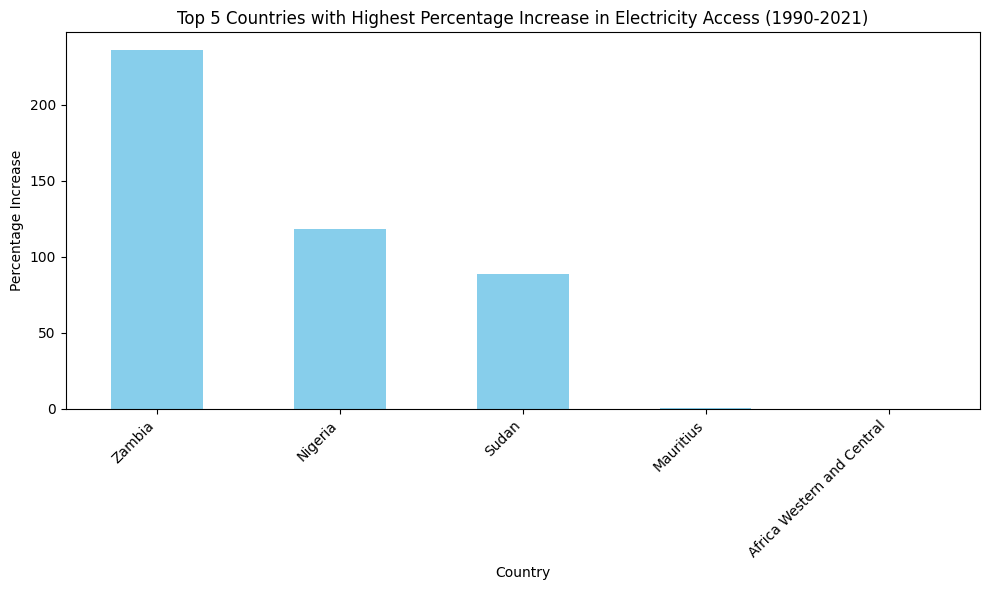

In [ ]:
# Plot the graph
plt.figure(figsize=(10, 6))
top_5_countries['Percentage Increase'].plot(kind='bar', color='skyblue')
plt.title('Top 5 Countries with Highest Percentage Increase in Electricity Access (1990-2021)')
plt.xlabel('Country')
plt.ylabel('Percentage Increase')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

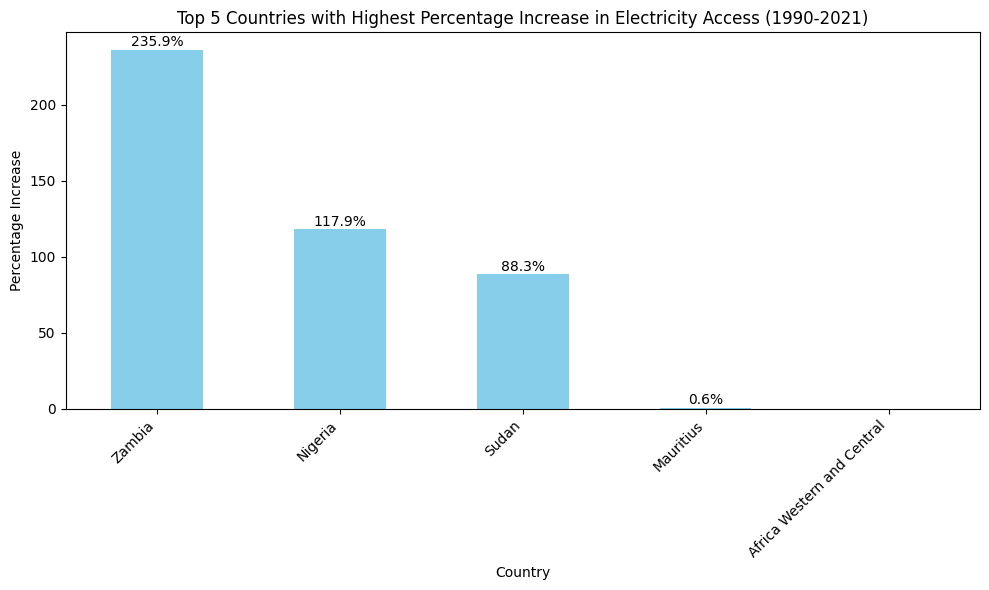

In [ ]:
# Plot the graph
plt.figure(figsize=(10, 6))
top_5_countries['Percentage Increase'].plot(kind='bar', color='skyblue')
plt.title('Top 5 Countries with Highest Percentage Increase in Electricity Access (1990-2021)')
plt.xlabel('Country')
plt.ylabel('Percentage Increase')
plt.xticks(rotation=45, ha='right')

# Annotate each bar with its percentage value
for i, v in enumerate(top_5_countries['Percentage Increase']):
    plt.text(i, v + 0.5, f'{v:.1f}%', ha='center', va='bottom')

plt.tight_layout()
plt.show()


In [ ]:
# Calculate the percentage increase in electricity access from 1990 to 2021 for each country
datay['Percentage Increase'] = ((datay['2021'] - datay['1990']) / datay['1990']) * 100

# Filter out countries with no data for 1990 or 2021
datay = datay.dropna(subset=['1990', '2021'])

# Sort the countries by percentage increase and get the top 5
top_5_countries = datay.nlargest(5, 'Percentage Increase')

# Create an interactive bar chart using Plotly
fig = px.bar(top_5_countries, x=top_5_countries.index, y='Percentage Increase',
             title='Top 5 Countries with Highest Percentage Increase in Electricity Access (1990-2021)',
             labels={'Percentage Increase': 'Percentage Increase (%)', 'index': 'Country'},
             text='Percentage Increase')

# Customize the layout
fig.update_traces(marker_color='skyblue', texttemplate='%{text:.1f}%', textposition='outside')
fig.update_layout(xaxis_tickangle=-45, xaxis_title='Country', yaxis_title='Percentage Increase',
                  template='plotly_white', margin=dict(l=40, r=40, t=40, b=100))

# Show the interactive plot
fig.show()

Pie Chart

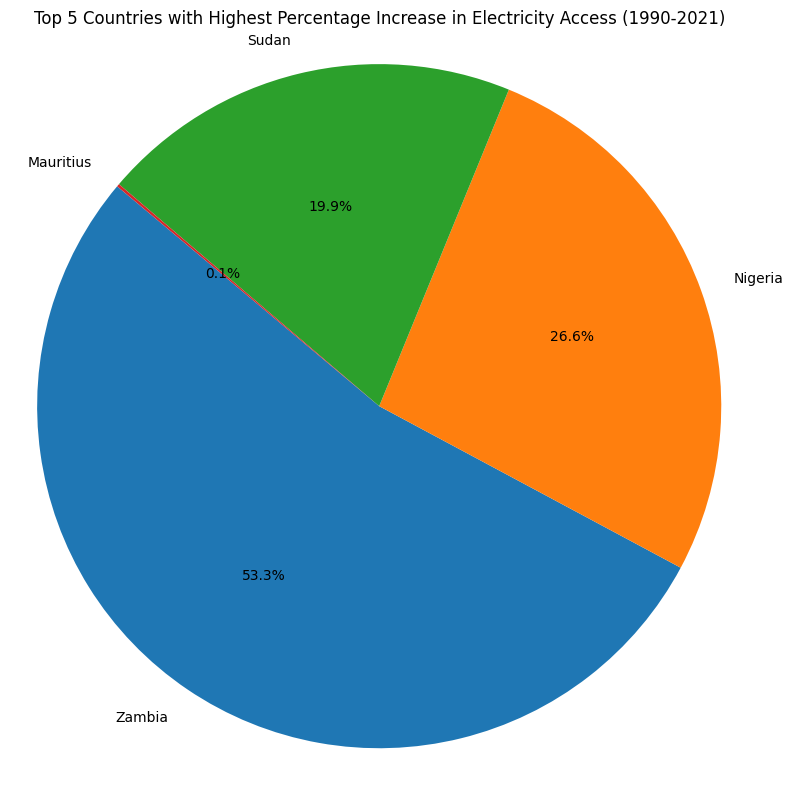

In [ ]:
# Plot the pie chart
plt.figure(figsize=(8, 8))
plt.pie(top_5_countries['Percentage Increase'], labels=top_5_countries.index, autopct='%1.1f%%', startangle=140)
plt.title('Top 5 Countries with Highest Percentage Increase in Electricity Access (1990-2021)')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()
plt.show()

### AFRICA

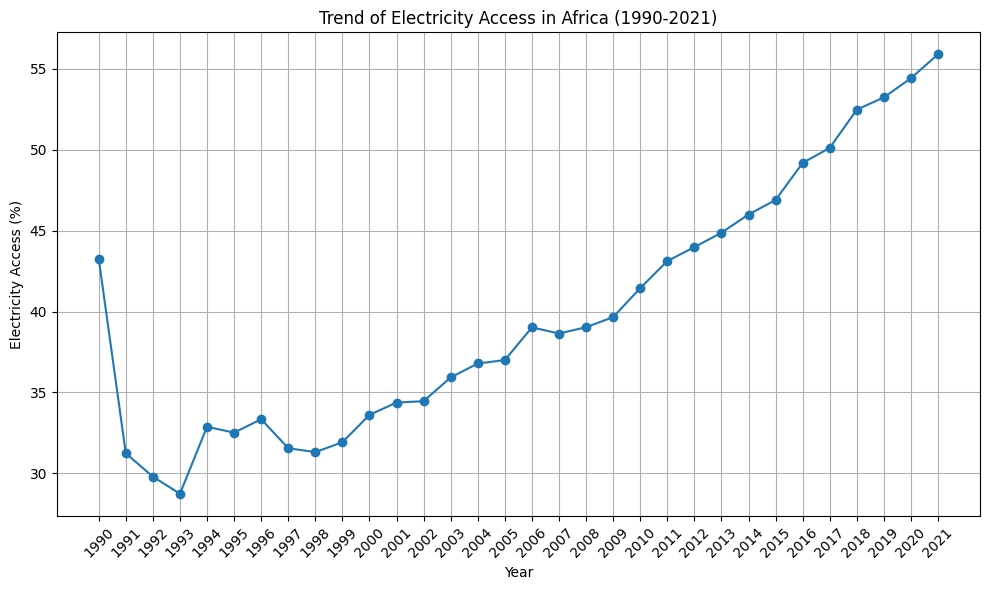

In [ ]:
# Calculate the mean column-wise for electricity access data (excluding non-numeric columns)
mean_electricity_access = datay.iloc[:, 3:].mean(axis=0)

# Create a new DataFrame with the mean values
africa_electricity_access = pd.DataFrame(mean_electricity_access, columns=['Electricity Access'])

# Filter out non-numeric index values
numeric_index = africa_electricity_access.index[africa_electricity_access.index.str.isnumeric()]

# Add a column for years by extracting the year from the index (column names)
africa_electricity_access = africa_electricity_access.loc[numeric_index]
africa_electricity_access['Year'] = africa_electricity_access.index.astype(int)

# Set the 'Year' column as the index
africa_electricity_access.set_index('Year', inplace=True)

# Plot the trend of electricity access in Africa from 1990 to 2021
plt.figure(figsize=(10, 6))
plt.plot(africa_electricity_access.index, africa_electricity_access['Electricity Access'], marker='o', linestyle='-')
plt.title('Trend of Electricity Access in Africa (1990-2021)')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')
plt.grid(True)
plt.xticks(africa_electricity_access.index, rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
# Calculate the mean column-wise for electricity access data (excluding non-numeric columns)
mean_electricity_access = datay.iloc[:, 3:].mean(axis=0)

# Create a new DataFrame with the mean values
africa_electricity_access = pd.DataFrame(mean_electricity_access, columns=['Electricity Access'])

# Filter out non-numeric index values
numeric_index = africa_electricity_access.index[africa_electricity_access.index.str.isnumeric()]

# Add a column for years by extracting the year from the index (column names)
africa_electricity_access = africa_electricity_access.loc[numeric_index]
africa_electricity_access['Year'] = africa_electricity_access.index.astype(int)

# Set the 'Year' column as the index
africa_electricity_access.set_index('Year', inplace=True)

# Plot the trend of electricity access in Africa from 1990 to 2021 using Plotly
fig = px.line(
    africa_electricity_access,
    x=africa_electricity_access.index,
    y='Electricity Access',
    title='Trend of Electricity Access in Africa (1990-2021)',
    labels={'Year': 'Year', 'Electricity Access': 'Electricity Access (%)'}
)

# Customize the layout
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Electricity Access (%)',
    template='plotly_white',
    margin=dict(l=40, r=40, t=40, b=100)
)

# Add markers
fig.update_traces(mode='lines+markers')

# Show the interactive plot
fig.show()


In [ ]:

# Assuming you have loaded your dataset into a DataFrame named 'datay'
# datay = pd.read_csv('your_dataset.csv')

# Calculate the mean column-wise for electricity access data (excluding non-numeric columns)
mean_electricity_access = datay.iloc[:, 3:].mean(axis=0)

# Create a new DataFrame with the mean values
africa_electricity_access = pd.DataFrame(mean_electricity_access, columns=['Electricity Access'])

# Ensure the index contains only numeric values (years)
numeric_index = africa_electricity_access.index[africa_electricity_access.index.to_series().apply(lambda x: x.isdigit())]

# Filter the DataFrame to include only these numeric index values
africa_electricity_access = africa_electricity_access.loc[numeric_index]

# Add a column for years by extracting the year from the index (column names)
africa_electricity_access['Year'] = africa_electricity_access.index.astype(int)

# Set the 'Year' column as the index
africa_electricity_access.set_index('Year', inplace=True)

# Calculate descriptive statistics
summary_stats = africa_electricity_access.describe()

# Extract relevant statistics for plotting
stats_to_plot = summary_stats.drop(index=['count'])

# Prepare data for Plotly
stats_to_plot_t = stats_to_plot.transpose().reset_index().melt(id_vars=['index'], value_vars=['mean', 'std', 'min', '25%', '50%', '75%', 'max'])
stats_to_plot_t.columns = ['Year', 'Statistic', 'Value']

# Create an interactive bar plot using Plotly
fig = px.bar(stats_to_plot_t, x='Statistic', y='Value', color='Year', barmode='group',
             title='Descriptive Statistics of Electricity Access in Africa',
             labels={'Statistic': 'Statistic', 'Value': 'Electricity Access %'})

# Customize the layout
fig.update_layout(xaxis_title='Statistic', yaxis_title='Electricity Access %', legend_title='Year',
                  xaxis_tickangle=45, yaxis=dict(showgrid=True, gridcolor='rgba(204, 204, 204, 0.5)'))

# Show the plot
fig.show()


In [ ]:
africa_electricity_access.head()

,Electricity Access
Year,
1990,43.260000
1991,31.238571
1992,29.800667
1993,28.744500
1994,32.880870


In [ ]:
# Preview Column
africa_electricity_access.columns

Index(['Electricity Access'], dtype='object')

#### Summary Stats

In [ ]:
# Calculate descriptive statistics
summary_stats = africa_electricity_access.describe()
print(summary_stats)


       Electricity Access
count           32.000000
mean            51.934219
std              6.909267
min             43.260000
25%             46.567500
50%             49.787500
75%             56.713125
max             66.890000


In [ ]:
# Assuming you have loaded your dataset into a DataFrame named 'datay'
# datay = pd.read_csv('your_dataset.csv')

# Calculate the mean column-wise for electricity access data (excluding non-numeric columns)
mean_electricity_access = datay.iloc[:, 3:].mean(axis=0)

# Create a new DataFrame with the mean values
africa_electricity_access = pd.DataFrame(mean_electricity_access, columns=['Electricity Access'])

# Ensure the index contains only numeric values (years)
numeric_index = africa_electricity_access.index[africa_electricity_access.index.to_series().apply(lambda x: x.isdigit())]

# Filter the DataFrame to include only these numeric index values
africa_electricity_access = africa_electricity_access.loc[numeric_index]

# Add a column for years by extracting the year from the index (column names)
africa_electricity_access['Year'] = africa_electricity_access.index.astype(int)

# Set the 'Year' column as the index
africa_electricity_access.set_index('Year', inplace=True)

# Calculate descriptive statistics
summary_stats = africa_electricity_access.describe()

# Extract relevant statistics for plotting
stats_to_plot = summary_stats.drop(index=['count'])

# Prepare data for Plotly
stats_to_plot = stats_to_plot.reset_index().melt(id_vars='index')
stats_to_plot.columns = ['Statistic', 'Year', 'Value']

# Create interactive plot
fig = px.bar(stats_to_plot, x='Statistic', y='Value', color='Year', barmode='group',
             title='Descriptive Statistics of Electricity Access in Africa',
             labels={'Value': 'Electricity Access %'},
             height=600)

# Customize layout
fig.update_layout(
    xaxis_title='Statistic',
    yaxis_title='Electricity Access %',
    legend_title='Year',
    xaxis_tickangle=-45,
    yaxis=dict(showgrid=True, gridcolor='rgba(204, 204, 204, 0.5)')
)

fig.show()


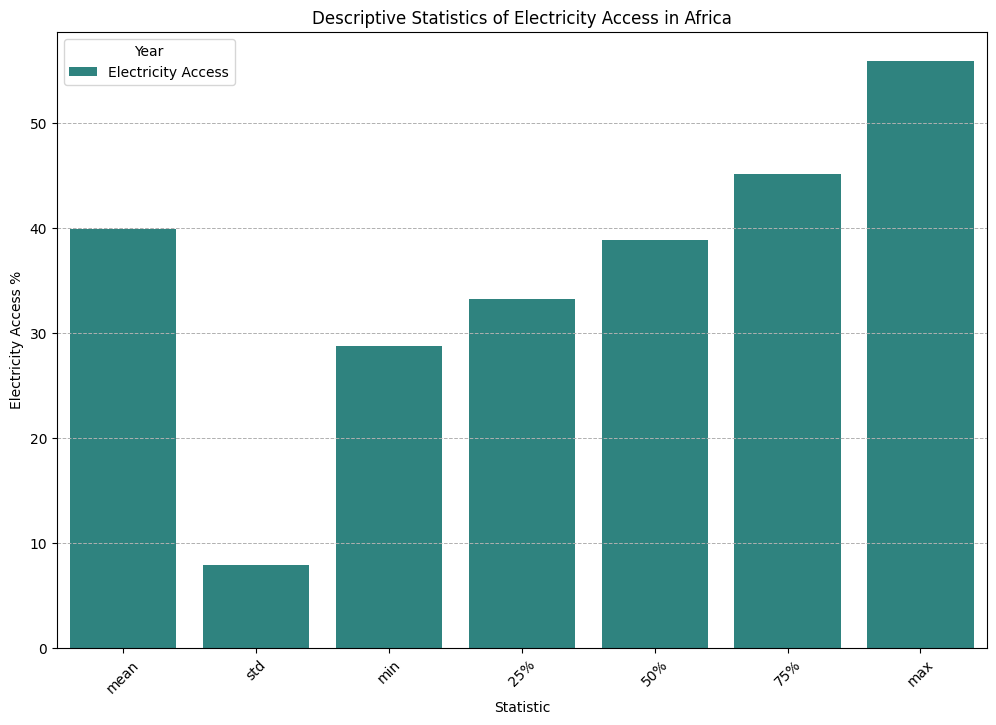

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have loaded your dataset into a DataFrame named 'datay'
# datay = pd.read_csv('your_dataset.csv')

# Calculate the mean column-wise for electricity access data (excluding non-numeric columns)
mean_electricity_access = datay.iloc[:, 3:].mean(axis=0)

# Create a new DataFrame with the mean values
africa_electricity_access = pd.DataFrame(mean_electricity_access, columns=['Electricity Access'])

# Ensure the index contains only numeric values (years)
numeric_index = africa_electricity_access.index[africa_electricity_access.index.to_series().apply(lambda x: x.isdigit())]

# Filter the DataFrame to include only these numeric index values
africa_electricity_access = africa_electricity_access.loc[numeric_index]

# Add a column for years by extracting the year from the index (column names)
africa_electricity_access['Year'] = africa_electricity_access.index.astype(int)

# Set the 'Year' column as the index
africa_electricity_access.set_index('Year', inplace=True)

# Calculate descriptive statistics
summary_stats = africa_electricity_access.describe()

# Extract relevant statistics for plotting
stats_to_plot = summary_stats.drop(index=['count'])

# Prepare data for plotting with Seaborn
stats_to_plot = stats_to_plot.reset_index().melt(id_vars='index')
stats_to_plot.columns = ['Statistic', 'Year', 'Value']

# Plot using Seaborn
plt.figure(figsize=(12, 8))
sns.barplot(data=stats_to_plot, x='Statistic', y='Value', hue='Year', palette='viridis')

# Customize the plot
plt.title('Descriptive Statistics of Electricity Access in Africa')
plt.xlabel('Statistical Measure')
plt.ylabel('Electricity Access %')
plt.xticks(rotation=45)
plt.legend(title='Year')
plt.grid(axis='y', linestyle='--', linewidth=0.7)
plt.show()


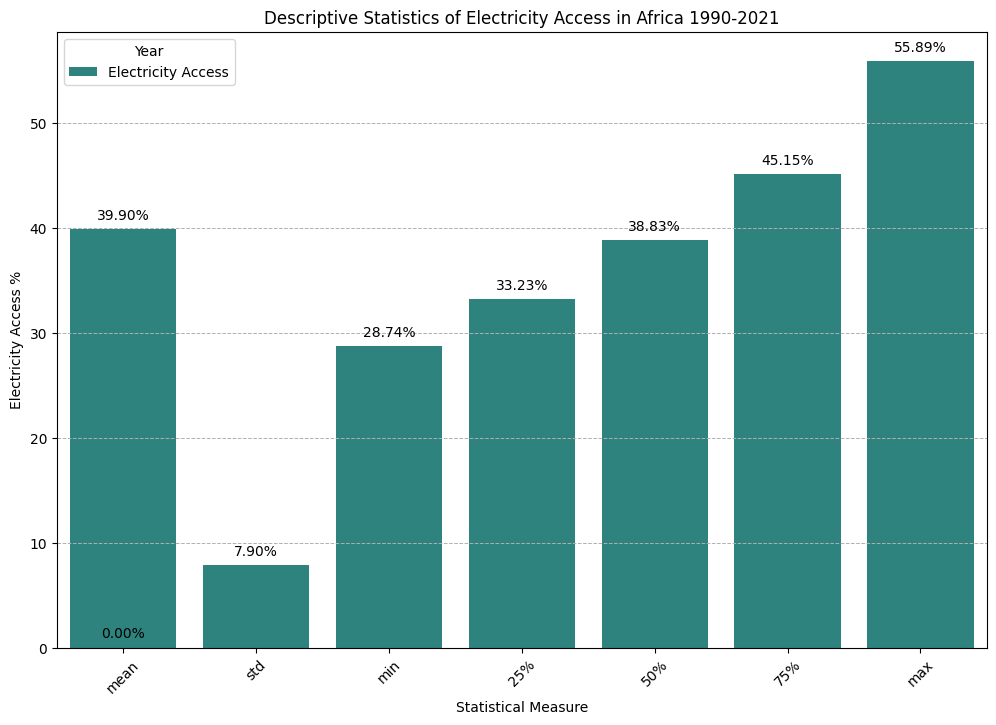

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have loaded your dataset into a DataFrame named 'datay'
# datay = pd.read_csv('your_dataset.csv')

# Calculate the mean column-wise for electricity access data (excluding non-numeric columns)
mean_electricity_access = datay.iloc[:, 3:].mean(axis=0)

# Create a new DataFrame with the mean values
africa_electricity_access = pd.DataFrame(mean_electricity_access, columns=['Electricity Access'])

# Ensure the index contains only numeric values (years)
numeric_index = africa_electricity_access.index[africa_electricity_access.index.to_series().apply(lambda x: x.isdigit())]

# Filter the DataFrame to include only these numeric index values
africa_electricity_access = africa_electricity_access.loc[numeric_index]

# Add a column for years by extracting the year from the index (column names)
africa_electricity_access['Year'] = africa_electricity_access.index.astype(int)

# Set the 'Year' column as the index
africa_electricity_access.set_index('Year', inplace=True)

# Calculate descriptive statistics
summary_stats = africa_electricity_access.describe()

# Extract relevant statistics for plotting
stats_to_plot = summary_stats.drop(index=['count'])

# Prepare data for plotting with Seaborn
stats_to_plot = stats_to_plot.reset_index().melt(id_vars='index')
stats_to_plot.columns = ['Statistic', 'Year', 'Value']

# Plot using Seaborn
plt.figure(figsize=(12, 8))
bar_plot = sns.barplot(data=stats_to_plot, x='Statistic', y='Value', hue='Year', palette='viridis')

# Annotate the bars with values
for p in bar_plot.patches:
    height = p.get_height()
    bar_plot.annotate(f'{height:.2f}%',
                      (p.get_x() + p.get_width() / 2., height),
                      ha = 'center', va = 'center',
                      xytext = (0, 10),
                      textcoords = 'offset points')

# Customize the plot
plt.title('Descriptive Statistics of Electricity Access in Africa 1990-2021')
plt.xlabel('Statistical Measure')
plt.ylabel('Electricity Access %')
plt.xticks(rotation=45)
plt.legend(title='Year')
plt.grid(axis='y', linestyle='--', linewidth=0.7)
plt.show()


#### Trend Analysis

In [ ]:
import pandas as pd
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from statsmodels.tsa.seasonal import seasonal_decompose

# Calculate the mean column-wise for electricity access data (excluding non-numeric columns)
mean_electricity_access = datay.iloc[:, 3:].mean(axis=0)

# Create a new DataFrame with the mean values
africa_electricity_access = pd.DataFrame(mean_electricity_access, columns=['Electricity Access'])

# Filter out non-numeric index values
numeric_index = africa_electricity_access.index[africa_electricity_access.index.str.isnumeric()]

# Add a column for years by extracting the year from the index (column names)
africa_electricity_access = africa_electricity_access.loc[numeric_index]
africa_electricity_access['Year'] = africa_electricity_access.index.astype(int)

# Set the 'Year' column as the index
africa_electricity_access.set_index('Year', inplace=True)

# Convert index to DatetimeIndex
africa_electricity_access.index = pd.to_datetime(africa_electricity_access.index, format='%Y')

# Use time series decomposition to analyze trend, seasonality, and noise
decomposition = seasonal_decompose(africa_electricity_access['Electricity Access'], model='additive', period=1)
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Create subplots
fig = make_subplots(rows=4, cols=1, shared_xaxes=True,
                    subplot_titles=['Observed', 'Trend', 'Seasonality', 'Residuals'],
                    vertical_spacing=0.1)

# Observed
fig.add_trace(go.Scatter(x=africa_electricity_access.index, y=africa_electricity_access['Electricity Access'],
                         mode='lines', name='Observed'), row=1, col=1)

# Trend
fig.add_trace(go.Scatter(x=trend.index, y=trend, mode='lines', name='Trend'), row=2, col=1)

# Seasonal
fig.add_trace(go.Scatter(x=seasonal.index, y=seasonal, mode='lines', name='Seasonality'), row=3, col=1)

# Residuals
fig.add_trace(go.Scatter(x=residual.index, y=residual, mode='lines', name='Residuals'), row=4, col=1)

# Update layout
fig.update_layout(height=800, title_text='Time Series Decomposition of Electricity Access in Africa (1990-2021)',
                  showlegend=False, template='plotly_white')

# Show the plot
fig.show()


Using Seaborn

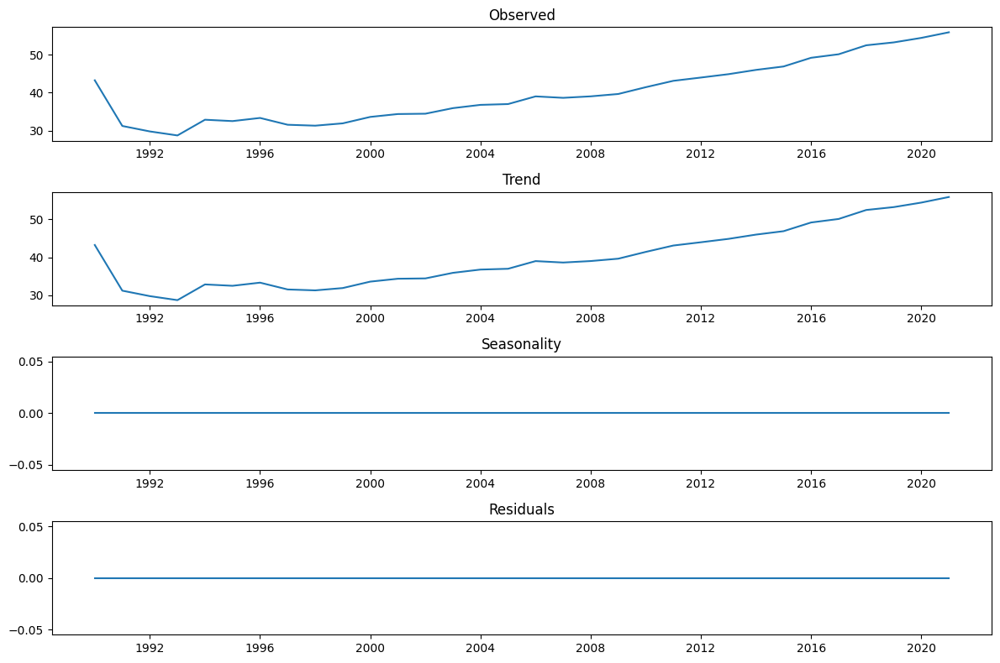

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Ensure the data contains only numeric values
data_numeric = data.select_dtypes(include=['float', 'int'])

# Calculate the mean column-wise for electricity access data
mean_electricity_access = data_numeric.mean(axis=0)

# Create a new DataFrame with the mean values
africa_electricity_access = pd.DataFrame(mean_electricity_access, columns=['Electricity Access'])

# Filter out non-numeric index values
numeric_index = africa_electricity_access.index[africa_electricity_access.index.str.isnumeric()]

# Add a column for years by extracting the year from the index (column names)
africa_electricity_access = africa_electricity_access.loc[numeric_index]
africa_electricity_access['Year'] = africa_electricity_access.index.astype(int)

# Set the 'Year' column as the index
africa_electricity_access.set_index('Year', inplace=True)

# Convert index to DatetimeIndex
africa_electricity_access.index = pd.to_datetime(africa_electricity_access.index, format='%Y')

# Use time series decomposition to analyze trend, seasonality, and noise
decomposition = seasonal_decompose(africa_electricity_access['Electricity Access'], model='additive', period=1)
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Plot each component using Matplotlib
plt.figure(figsize=(12, 8))

# Observed
plt.subplot(4, 1, 1)
plt.plot(africa_electricity_access.index, africa_electricity_access['Electricity Access'])
plt.title('Observed')

# Trend
plt.subplot(4, 1, 2)
plt.plot(trend.index, trend.values)
plt.title('Trend')

# Seasonal
plt.subplot(4, 1, 3)
plt.plot(seasonal.index, seasonal.values)
plt.title('Seasonality')

# Residuals
plt.subplot(4, 1, 4)
plt.plot(residual.index, residual.values)
plt.title('Residuals')

plt.tight_layout()
plt.show()


Explanation:
Dataset Preparation:

Calculated the mean electricity access for each year.
Created a DataFrame with the mean values.
Filtered out non-numeric index values.
Extracted the year from the index and added it as a column.
Set the 'Year' column as the index.
Converted the index to DatetimeIndex.
Time Series Decomposition:

Used the seasonal_decompose function from statsmodels to decompose the time series into observed, trend, seasonal, and residual components.
Create Interactive Subplots with Plotly:

Created subplots for the observed data, trend, seasonality, and residuals.
Used Plotly's make_subplots function to create a 4-row subplot.
Added each component of the decomposition to the respective subplot.
Enhancements:

Updated the layout to include titles and appropriate formatting.
Used the Plotly theme 'plotly_white' for better visual aesthetics.

#### Forecasting

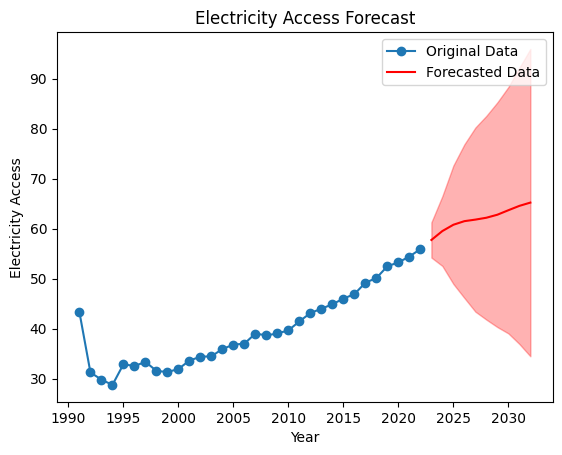

In [ ]:
# Assuming 'Year' is the index column
africa_electricity_access.index = pd.date_range(start='1990', periods=len(africa_electricity_access), freq='A')

# Fit ARIMA model
model = ARIMA(africa_electricity_access['Electricity Access'], order=(5,1,0))
model_fit = model.fit()

# Forecast future values
forecast_values = model_fit.forecast(steps=10)  # Adjust steps as needed

# Confidence interval
conf_int = model_fit.get_forecast(steps=10).conf_int()

# Plot original data
plt.plot(africa_electricity_access.index, africa_electricity_access['Electricity Access'], label='Original Data', marker='o')

# Plot forecasted values with confidence intervals
forecast_dates = pd.date_range(start=africa_electricity_access.index[-1], periods=11, freq='A')[1:]
plt.plot(forecast_dates, forecast_values, label='Forecasted Data', color='red')
plt.fill_between(forecast_dates, conf_int.iloc[:, 0], conf_int.iloc[:, 1], color='red', alpha=0.3)

plt.xlabel('Year')
plt.ylabel('Electricity Access')
plt.title('Electricity Access Forecast')
plt.legend()
plt.show()


In [ ]:


# Assuming 'Year' is the index column
africa_electricity_access.index = pd.date_range(start='1990', periods=len(africa_electricity_access), freq='A')

# Fit ARIMA model
model = ARIMA(africa_electricity_access['Electricity Access'], order=(5,1,0))
model_fit = model.fit()

# Forecast future values
forecast_values = model_fit.forecast(steps=10)  # Adjust steps as needed

# Confidence interval
conf_int = model_fit.get_forecast(steps=10).conf_int()

# Create traces for original data, forecasted data, and confidence interval
trace_original = go.Scatter(x=africa_electricity_access.index, y=africa_electricity_access['Electricity Access'],
                            mode='lines+markers', name='Original Data', marker=dict(color='blue'))
trace_forecast = go.Scatter(x=forecast_dates, y=forecast_values, mode='lines', name='Forecasted Data', line=dict(color='red'))
trace_conf_upper = go.Scatter(x=forecast_dates, y=conf_int.iloc[:, 1], mode='lines', name='Upper Confidence Interval', line=dict(color='red', dash='dash'))
trace_conf_lower = go.Scatter(x=forecast_dates, y=conf_int.iloc[:, 0], mode='lines', name='Lower Confidence Interval', line=dict(color='red', dash='dash'))

# Combine traces
data = [trace_original, trace_forecast, trace_conf_upper, trace_conf_lower]

# Layout
layout = go.Layout(title='Electricity Access Forecast',
                   xaxis=dict(title='Year'),
                   yaxis=dict(title='Electricity Access'))

# Create figure
fig = go.Figure(data=data, layout=layout)

# Show plot
fig.show()


In [ ]:
africa_electricity_access.head()

,Electricity Access
1990-12-31,43.260000
1991-12-31,31.238571
1992-12-31,29.800667
1993-12-31,28.744500
1994-12-31,32.880870


In [ ]:
africa_electricity_access.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 32 entries, 1990-12-31 to 2021-12-31
Freq: A-DEC
Data columns (total 1 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Electricity Access  32 non-null     float64
dtypes: float64(1)
memory usage: 512.0 bytes


### % Growth of Electricity Access in Africa 1990-2021

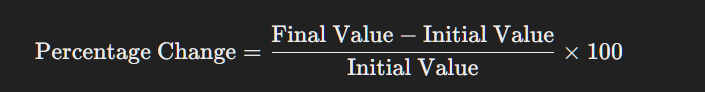

In [ ]:
# Get the initial and final values for electricity access in Africa
initial_value = africa_electricity_access.iloc[0, 0]
final_value = africa_electricity_access.iloc[-1, 0]

# Calculate the percentage change
percentage_growth = ((final_value - initial_value) / initial_value) * 100

print("Percentage growth of electricity access in Africa from 1990 to 2021:", round(percentage_growth, 2), "%")


Percentage growth of electricity access in Africa from 1990 to 2021: 29.2 %


In [ ]:
# Find the nearest available dates for the initial and final values
initial_date = africa_electricity_access.index[0]
final_date = africa_electricity_access.index[-1]

# Get the initial and final values for electricity access in Africa
initial_value = africa_electricity_access.loc[initial_date, 'Electricity Access']
final_value = africa_electricity_access.loc[final_date, 'Electricity Access']

# Calculate the percentage change
percentage_growth = ((final_value - initial_value) / initial_value) * 100

print("Percentage growth of electricity access in Africa from", initial_date.date(), "to", final_date.date(), ":", round(percentage_growth, 2), "%")


AttributeError: 'numpy.int64' object has no attribute 'date'

### MetaData Visuals

In [ ]:
datay.head(2)

,Country Code,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,Percentage Increase
Country Name,,,,,,,,,,,,,,,,,,,,,
Africa Western and Central,AFW,Africa Western and Central,Others,NaN,NaN,NaN,31.58,32.61,33.61,32.63,...,47.05,47.65,46.76,50.90,48.79,51.21,51.16,51.73,54.22,NaN
Angola,AGO,Sub-Saharan Africa,Lower middle income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,38.40,32.00,42.00,41.79,42.91,45.29,45.63,46.96,48.22,NaN


#### IncomeGroup Analysis

In [ ]:
datay["IncomeGroup"].unique()

array(['Others', 'Lower middle income', 'Low income',
       'Upper middle income', 'High income'], dtype=object)

In [ ]:
incomegroup = datay.drop(columns= ["Country Code", "Region"])


In [ ]:
incomegroup.head(2)

,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,Percentage Increase
Country Name,,,,,,,,,,,,,,,,,,,,,
Africa Western and Central,Others,NaN,NaN,NaN,31.58,32.61,33.61,32.63,32.46,33.46,...,47.05,47.65,46.76,50.90,48.79,51.21,51.16,51.73,54.22,NaN
Angola,Lower middle income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,38.40,32.00,42.00,41.79,42.91,45.29,45.63,46.96,48.22,NaN


In [ ]:
incomegroup = datay.drop(columns= ["Percentage Increase"])


IncomeGroup Plot

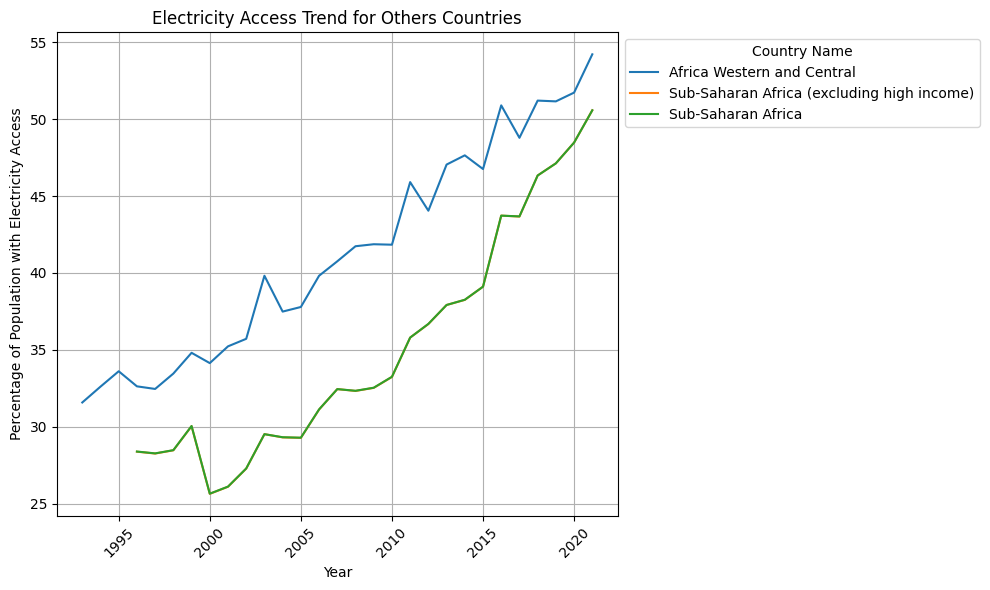

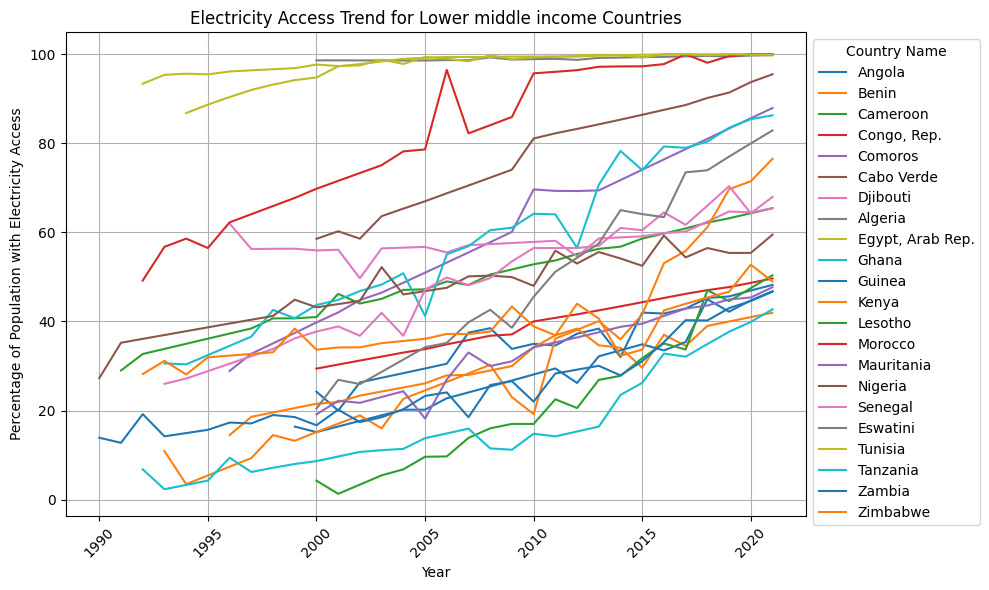

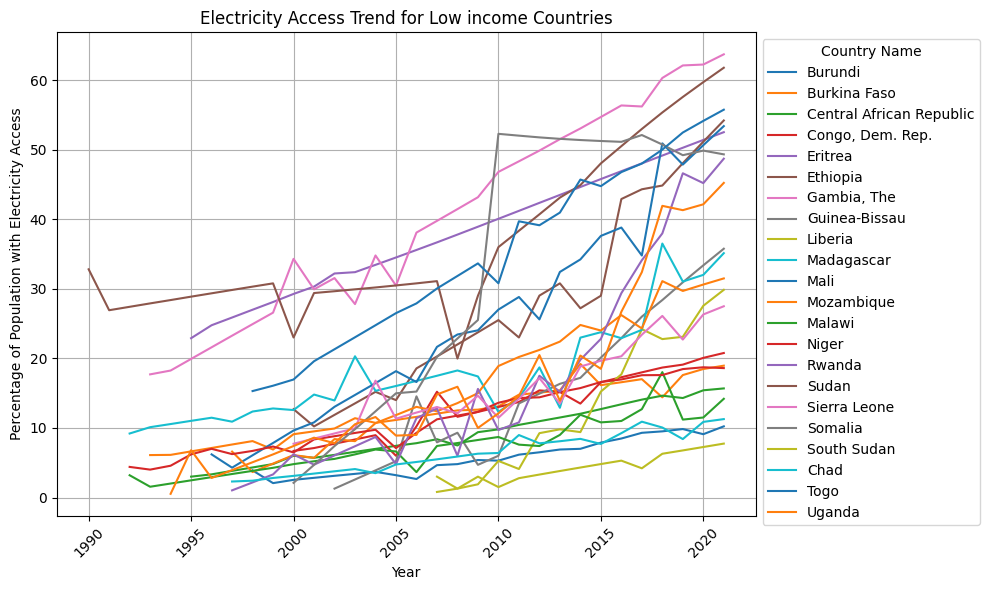

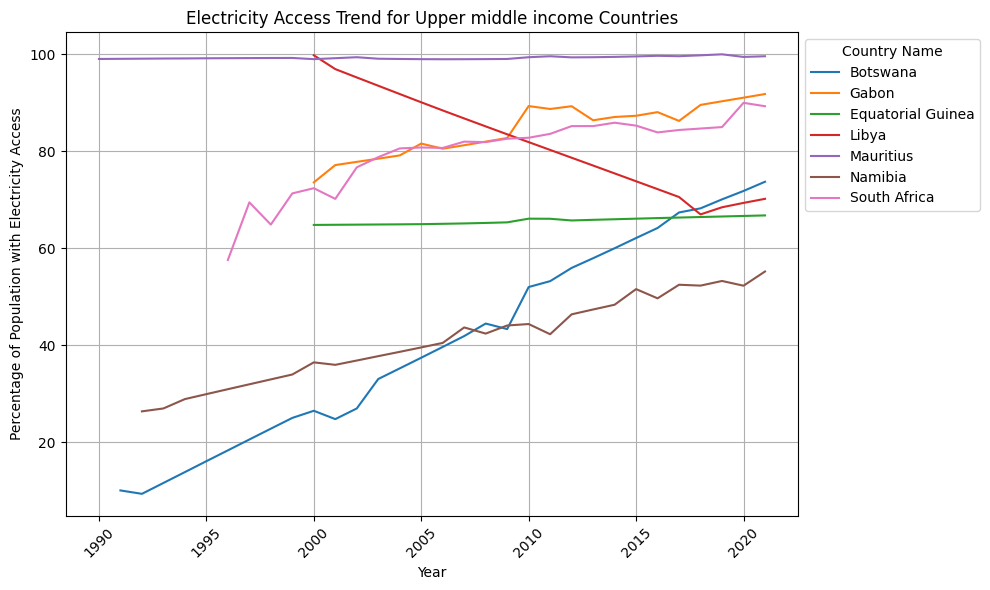

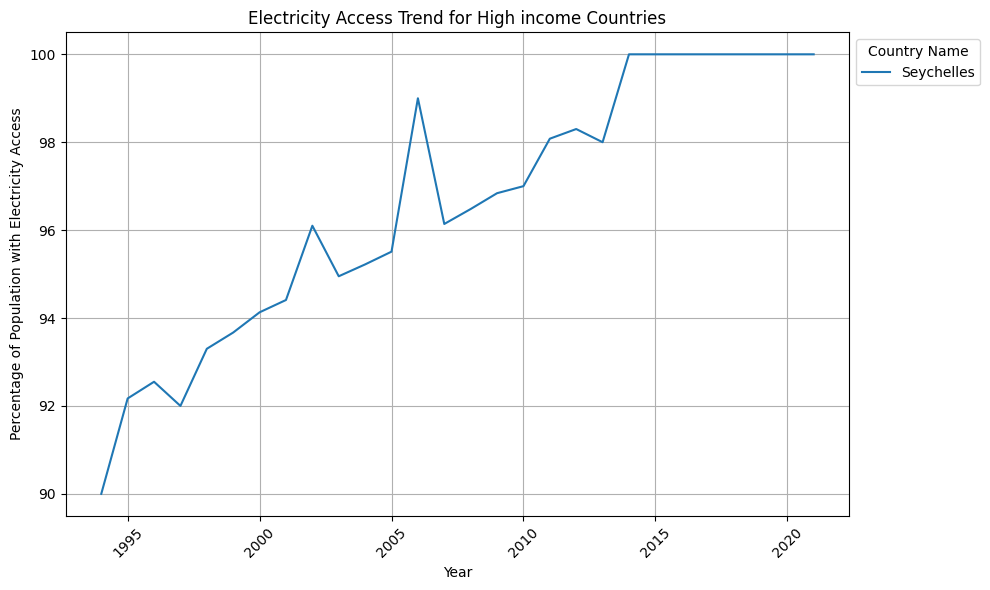

In [ ]:
#Assume Dataset is "incomegroup"

# Filter the data by income group
income_groups = incomegroup['IncomeGroup'].unique()

# Visualize each income group separately
for group in income_groups:
    group_data = incomegroup[incomegroup['IncomeGroup'] == group]

    # Check if there are numeric columns to plot
    numeric_columns = group_data.select_dtypes(include=['float64', 'int64']).columns
    if not numeric_columns.empty:
        group_data[numeric_columns].T.plot(kind='line', figsize=(10, 6))
        plt.title(f'Electricity Access Trend for {group} Countries')
        plt.xlabel('Year')
        plt.ylabel('Percentage of Population with Electricity Access')
        plt.legend(title='Country Name', bbox_to_anchor=(1, 1))
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    else:
        print(f"No numeric data to plot for {group} countries.")


IncomeGroup Mean Plot 4 Year [".."]

In [ ]:

# Calculate the average electricity access percentage for each income group
avg_access_percentage = incomegroup.groupby('IncomeGroup').mean()

# Calculate the max electricity access percentage for each income group
max_access_percentage = incomegroup.groupby('IncomeGroup').max()

# Calculate the min electricity access percentage for each income group
min_access_percentage = incomegroup.groupby('IncomeGroup').min()

# Calculate the count of countries in each income group
income_group_counts = incomegroup['IncomeGroup'].value_counts()

# Define the width of each bar
bar_width = 0.3

# Define the x-axis locations for the bars
x = np.arange(len(avg_access_percentage.index))

# Plot the bar chart
plt.figure(figsize=(12, 8))


# Plotting max
bars_max = plt.bar(x, max_access_percentage['2021'], width=bar_width, color='lightgreen', label='Max')

# Plotting mean
bars_mean = plt.bar(x - bar_width, avg_access_percentage['2021'], width=bar_width, color='skyblue', label='Mean')

# Plotting min
bars_min = plt.bar(x + bar_width, min_access_percentage['2021'], width=bar_width, color='lightcoral', label='Min')

# Add percentage labels to the bars
for bars in [bars_mean, bars_max, bars_min]:
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.1f}%', ha='center', va='bottom')

# Set the x-axis ticks and labels
plt.xticks(x, avg_access_percentage.index, rotation=45, ha='right')

plt.title('Electricity Access Percentage by Income Group (2021)')
plt.xlabel('Income Group')
plt.ylabel('Electricity Access Percentage')
plt.grid(axis='y')
plt.legend()
plt.tight_layout()
plt.show()


TypeError: Could not convert AngolaEswatiniZimbabwe to numeric

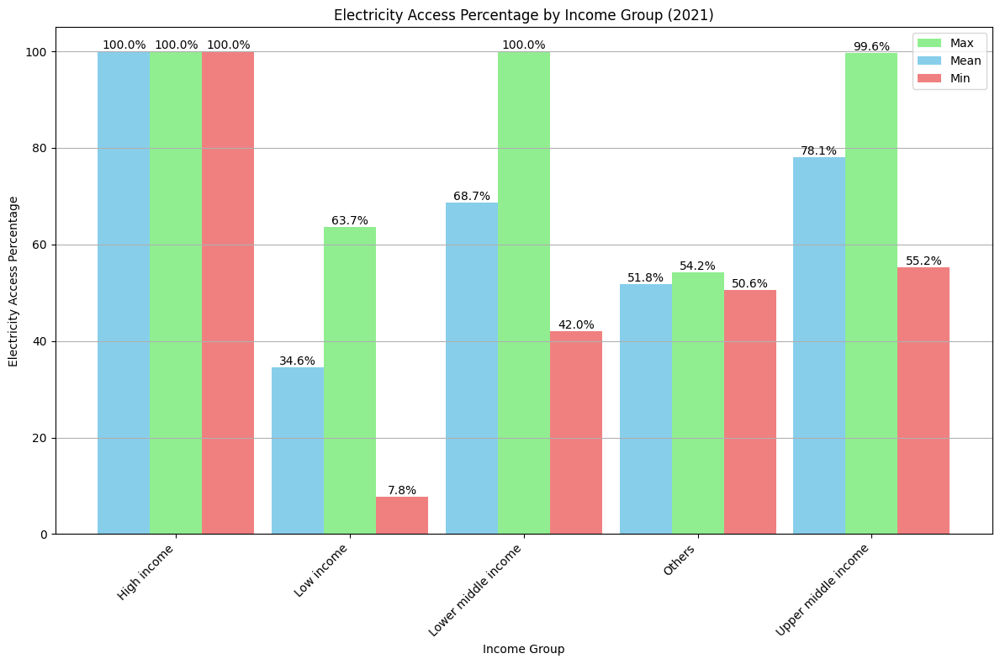

In [ ]:

incomegroup = pd.DataFrame(datay)

# Ensure that only numeric columns are selected for aggregation
numeric_cols = incomegroup.select_dtypes(include=np.number).columns

# Calculate the average electricity access percentage for each income group
avg_access_percentage = incomegroup.groupby('IncomeGroup')[numeric_cols].mean()

# Calculate the max electricity access percentage for each income group
max_access_percentage = incomegroup.groupby('IncomeGroup')[numeric_cols].max()

# Calculate the min electricity access percentage for each income group
min_access_percentage = incomegroup.groupby('IncomeGroup')[numeric_cols].min()

# Define the width of each bar
bar_width = 0.3

# Define the x-axis locations for the bars
x = np.arange(len(avg_access_percentage.index))

# Plot the bar chart
plt.figure(figsize=(12, 8))

# Plotting max
bars_max = plt.bar(x, max_access_percentage['2021'], width=bar_width, color='lightgreen', label='Max')

# Plotting mean
bars_mean = plt.bar(x - bar_width, avg_access_percentage['2021'], width=bar_width, color='skyblue', label='Mean')

# Plotting min
bars_min = plt.bar(x + bar_width, min_access_percentage['2021'], width=bar_width, color='lightcoral', label='Min')

# Add percentage labels to the bars
for bars in [bars_mean, bars_max, bars_min]:
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.1f}%', ha='center', va='bottom')

# Set the x-axis ticks and labels
plt.xticks(x, avg_access_percentage.index, rotation=45, ha='right')

plt.title('Electricity Access Percentage by Income Group (2021)')
plt.xlabel('Income Group')
plt.ylabel('Electricity Access Percentage')
plt.grid(axis='y')
plt.legend()
plt.tight_layout()
plt.show()


IncomeGroup Count

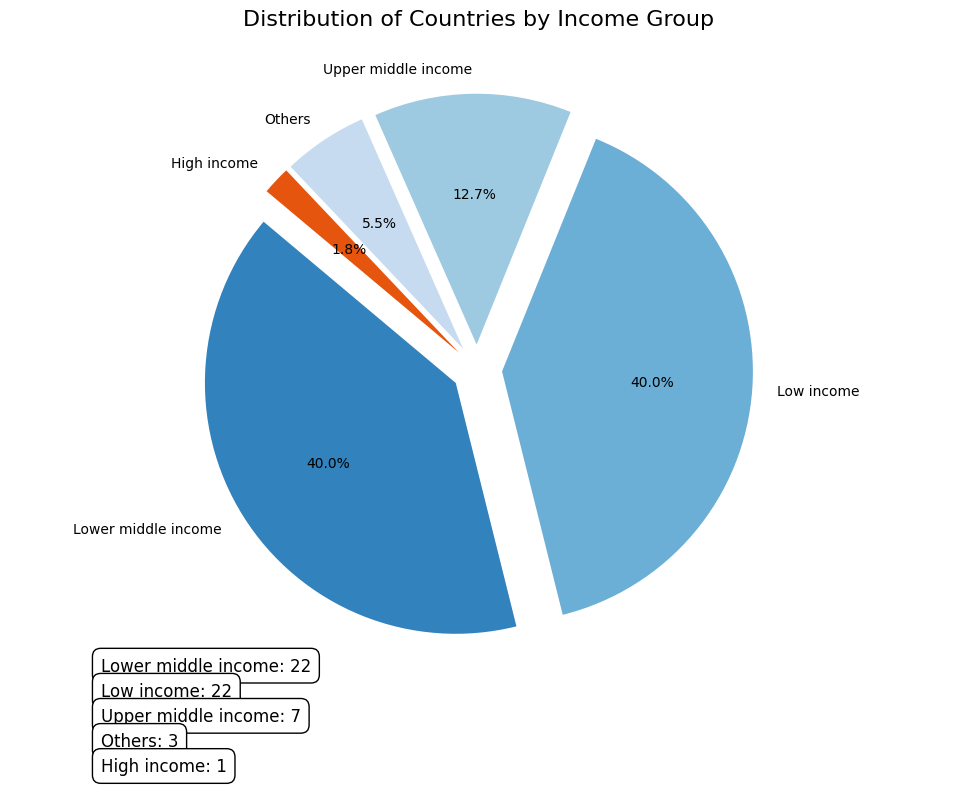

In [ ]:

incomegroup = pd.DataFrame(datay)

# Calculate the count of countries in each income group
income_group_counts = incomegroup['IncomeGroup'].value_counts()

# Plot the pie chart
plt.figure(figsize=(10, 8))  # Adjusted the figure size for better visualization
colors = plt.cm.tab20c.colors  # Using a predefined color palette for better readability
explode = [0.1] * len(income_group_counts)  # Explode all sectors slightly for emphasis

plt.pie(income_group_counts, labels=income_group_counts.index, autopct='%1.1f%%', startangle=140, colors=colors, explode=explode)
plt.title('Distribution of Countries by Income Group', pad=30, fontsize=16)  # Adjusted title size for clarity

# Add a legend using annotations
for i, (income_group, count) in enumerate(zip(income_group_counts.index, income_group_counts)):
    plt.annotate(f'{income_group}: {count}',
                 xy=(0, 0),
                 xytext=(-1.5, -1.2 - 0.1 * i),  # Adjusted position of annotation for better spacing
                 fontsize=12,
                 bbox=dict(boxstyle='round,pad=0.5', fc='white', ec='black'))  # Improved box style and added edge color

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()  # Improved layout for better spacing
plt.show()


BY REGION

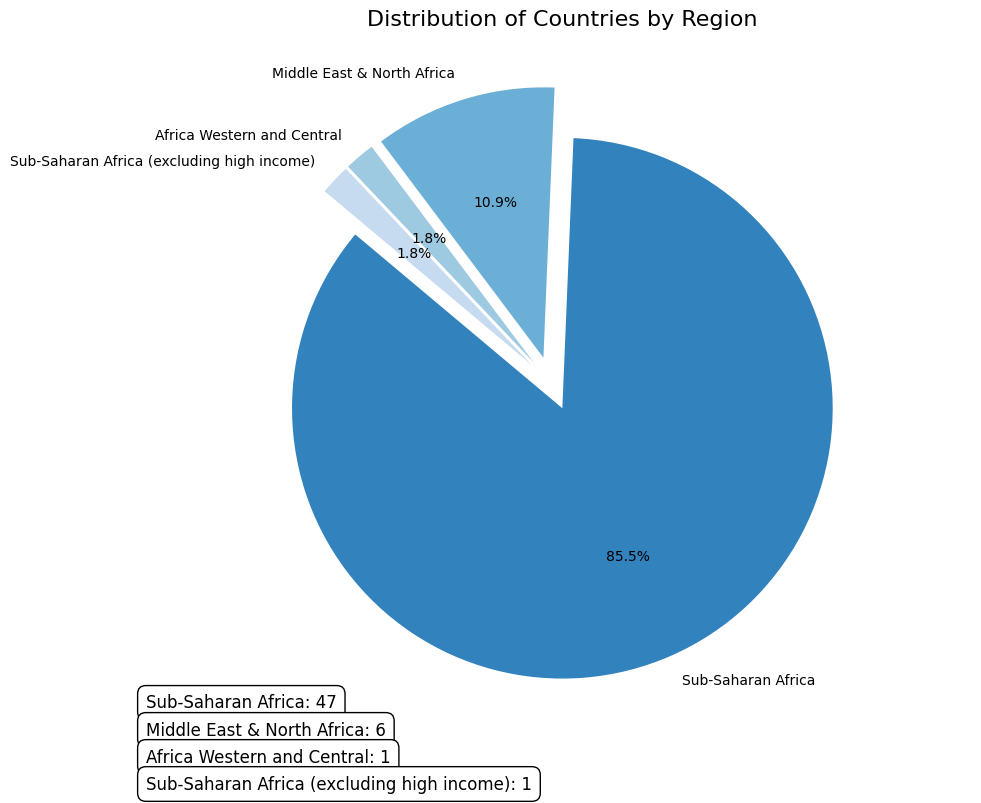

In [ ]:

region = pd.DataFrame(datay)

# Calculate the count of countries in each region
region_counts = region['Region'].value_counts()

# Plot the pie chart
plt.figure(figsize=(10, 8))  # Adjusted the figure size for better visualization
colors = plt.cm.tab20c.colors  # Using a predefined color palette for better readability
explode = [0.1] * len(region_counts)  # Explode all sectors slightly for emphasis

plt.pie(region_counts, labels=region_counts.index, autopct='%1.1f%%', startangle=140, colors=colors, explode=explode)
plt.title('Distribution of Countries by Region', pad=30, fontsize=16)  # Adjusted title size for clarity

# Add a legend using annotations
for i, (region, count) in enumerate(zip(region_counts.index, region_counts)):
    plt.annotate(f'{region}: {count}',
                 xy=(0, 0),
                 xytext=(-1.5, -1.2 - 0.1 * i),  # Adjusted position of annotation for better spacing
                 fontsize=12,
                 bbox=dict(boxstyle='round,pad=0.5', fc='white', ec='black'))  # Improved box style and added edge color

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()  # Improved layout for better spacing
plt.show()


Using Plotly

In [ ]:

# Create a DataFrame for the income group counts
income_group_counts_df = pd.DataFrame({'Income Group': income_group_counts.index, 'Count': income_group_counts.values})

# Plot the pie chart
fig = px.pie(income_group_counts_df, values='Count', names='Income Group',
             title='Distribution of Countries by Income Group',
             hole=0.3,  # Size of the center hole
             color_discrete_sequence=px.colors.qualitative.Set3)  # Color palette

# Customize layout
fig.update_traces(textposition='inside', textinfo='percent+label')  # Show percentage and labels inside the pie slices
fig.update_layout(title_x=0.5, title_font_size=24, title_pad_t=30)  # Center and adjust title position and size
fig.show()


#### Trend Analysis

<Figure size 1000x600 with 0 Axes>

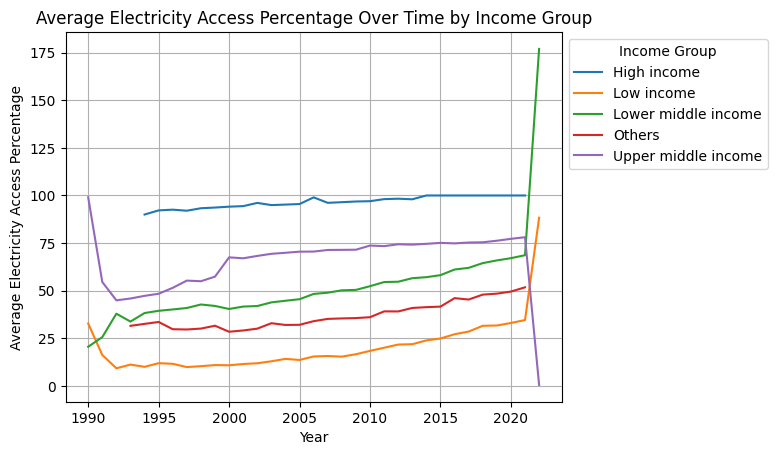

In [ ]:
# Plot the trends
plt.figure(figsize=(10, 6))
avg_access_percentage.T.plot(kind='line')
plt.title('Average Electricity Access Percentage Over Time by Income Group')
plt.xlabel('Year')
plt.ylabel('Average Electricity Access Percentage')
plt.legend(title='Income Group', loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()


In [ ]:
import plotly.graph_objects as go

# Create a figure
fig = go.Figure()

# Add lines for each income group
for income_group in avg_access_percentage.index:
    fig.add_trace(go.Scatter(x=avg_access_percentage.columns, y=avg_access_percentage.loc[income_group], mode='lines', name=income_group))

# Customize layout
fig.update_layout(title='Average Electricity Access Percentage Over Time by Income Group',
                  xaxis_title='Year',
                  yaxis_title='Average Electricity Access Percentage',
                  legend_title='Income Group',
                  legend=dict(x=1, y=1, traceorder='normal'),  # Adjust legend position
                  height=600,  # Set plot height
                  width=800,  # Set plot width
                  margin=dict(l=50, r=50, t=80, b=50),  # Adjust margins
                  template='plotly_white')  # Use white template for better readability

# Show plot
fig.show()


In [ ]:
import plotly.graph_objects as go

# Create traces for each income group
traces = []
for income_group in avg_access_percentage.index:
    trace = go.Scatter(
        x=avg_access_percentage.columns,
        y=avg_access_percentage.loc[income_group],
        mode='lines',
        fill='tozeroy',  # Fill area below the line
        name=income_group
    )
    traces.append(trace)

# Create layout
layout = go.Layout(
    title='Average Electricity Access Percentage Over Time by Income Group',
    xaxis=dict(title='Year'),
    yaxis=dict(title='Average Electricity Access Percentage'),
    legend=dict(title='Income Group'),
    width=800,
    height=600
)

# Create figure
fig = go.Figure(data=traces, layout=layout)

# Show plot
fig.show()


### Income Group Distribution by Region

<Axes: xlabel='Region'>

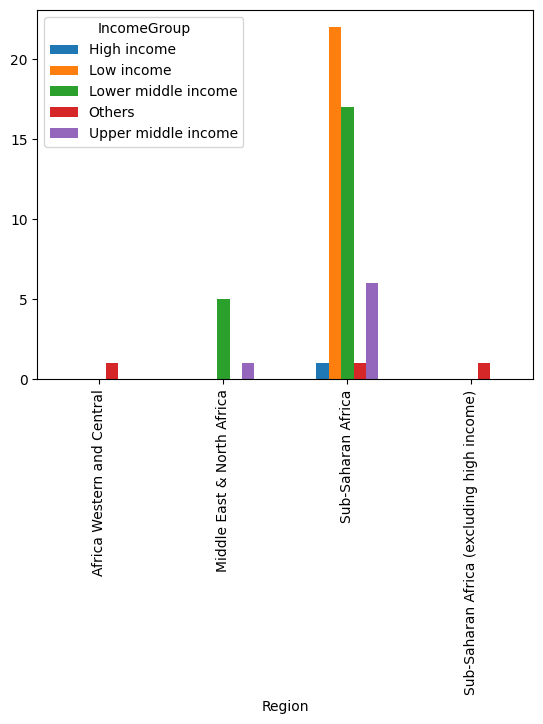

In [ ]:
#title Income Group Distribution by Region

datay.groupby(['Region', 'IncomeGroup']).size().unstack().plot(kind='bar')

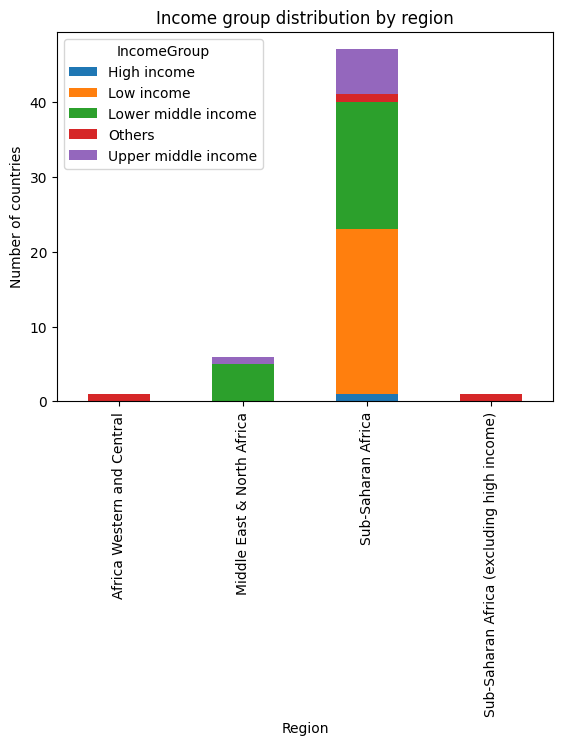

In [ ]:
# Get the income group distribution in each region
income_group_distribution = datay.groupby('Region')['IncomeGroup'].value_counts().unstack()

# Create a stacked bar chart of the income group distribution in each region
income_group_distribution.plot(kind='bar', stacked=True)
plt.xlabel('Region')
plt.ylabel('Number of countries')
_ = plt.title('Income group distribution by region')


### Nigeria

In [ ]:
# Assuming your Dataset is "datay"
# prompt: Filter out the data where index == Nigeria

nigeria = datay[datay.index == 'Nigeria']
nigeria


,Country Code,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,Percentage Increase
Country Name,,,,,,,,,,,,,,,,,,,,,
Nigeria,NGA,Sub-Saharan Africa,Lower middle income,27.3,35.23,36.1,36.96,37.83,38.69,39.55,...,55.6,54.15,52.5,59.3,54.4,56.5,55.4,55.4,59.5,117.948718


In [ ]:
# Drop percentage Increase
nigeria = nigeria.drop(columns= ["Percentage Increase"])
nigeria

,Country Code,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Country Name,,,,,,,,,,,,,,,,,,,,,
Nigeria,NGA,Sub-Saharan Africa,Lower middle income,27.3,35.23,36.1,36.96,37.83,38.69,39.55,...,53.02,55.6,54.15,52.5,59.3,54.4,56.5,55.4,55.4,59.5


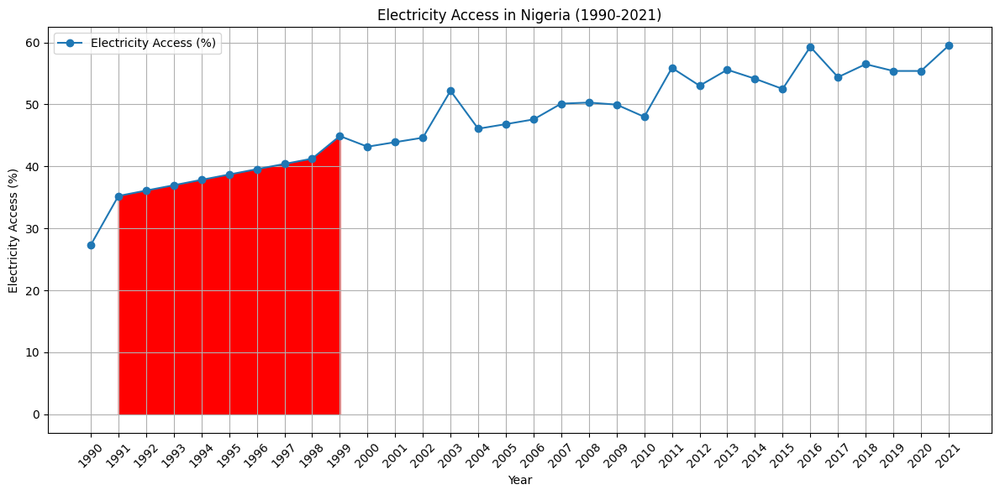

In [ ]:
# Data
years = list(range(1990, 2022))
nigeria = [27.30, 35.23, 36.10, 36.96, 37.83, 38.69, 39.55, 40.40, 41.25,
                44.90, 43.18, 43.91, 44.63, 52.20, 46.08, 46.82, 47.58, 50.13,
                50.30, 49.97, 48.00, 55.90, 53.02, 55.60, 54.15, 52.50, 59.30,
                54.40, 56.50, 55.40, 55.40, 59.50]

# Shade the area between 1991 and 1999
shade_start = years.index(1991)
shade_end = years.index(1999)

# Plot the data
plt.figure(figsize=(12, 6))
plt.plot(years, nigeria, marker='o', linestyle='-', label='Electricity Access (%)')
plt.fill_between(years[shade_start:shade_end+1], nigeria[shade_start:shade_end+1], color='r')
plt.title('Electricity Access in Nigeria (1990-2021)')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')
plt.grid(True)
plt.xticks(years, rotation=45)
plt.tight_layout()
plt.legend()
plt.show()


### % Growth Electricity Access in Nigeria

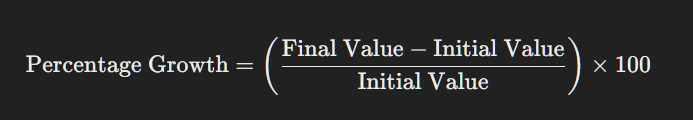

In [ ]:
# Data
nigeria = [27.30, 35.23, 36.10, 36.96, 37.83, 38.69, 39.55, 40.40, 41.25,
           44.90, 43.18, 43.91, 44.63, 52.20, 46.08, 46.82, 47.58, 50.13,
           50.30, 49.97, 48.00, 55.90, 53.02, 55.60, 54.15, 52.50, 59.30,
           54.40, 56.50, 55.40, 55.40, 59.50]

# Initial and final values
initial_value = nigeria[0]  # Value in 1990
final_value = nigeria[-1]   # Value in 2021

# Calculate percentage growth
percentage_growth = ((final_value - initial_value) / initial_value) * 100

print("Percentage Growth from 1990 to 2021:", round(percentage_growth,2),"%")


Percentage Growth from 1990 to 2021: 117.95 %


### Statistical Measure

In [ ]:
nigerian = pd.DataFrame(nigeria, columns=['Electricity Access'])

In [ ]:
# Create DataFrame from the 'nigeria' list
nigerian = pd.DataFrame(nigeria, columns=['Electricity Access'])

# Create a bar plot with Plotly
fig = px.bar(nigerian.describe().reset_index(), x='index', y='Electricity Access',
             labels={'index': 'Statistical Measure', 'Electricity Access': 'Value'},
             title='Descriptive Statistics of Electricity Access in Nigeria')
fig.update_layout(xaxis={'categoryorder':'total ascending'})
fig.show()


<Figure size 1000x600 with 0 Axes>

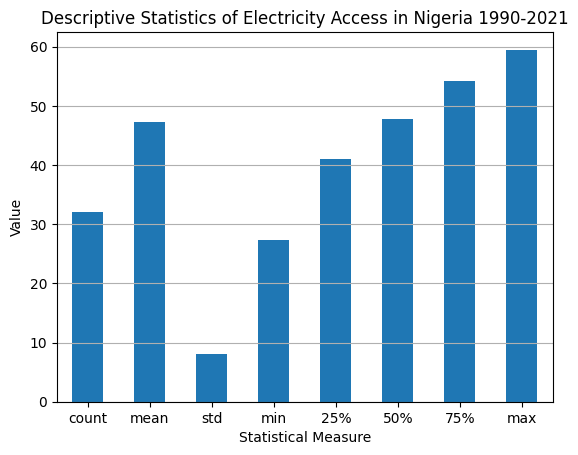

In [ ]:

# Create DataFrame from the 'nigeria' list
nigerian = pd.DataFrame(nigeria, columns=['Electricity Access'])

# Plot the descriptive statistics
plt.figure(figsize=(10, 6))
nigerian.describe().plot(kind='bar', legend=False)
plt.title('Descriptive Statistics of Electricity Access in Nigeria 1990-2021')
plt.xlabel('Statistical Measure')
plt.ylabel('Value')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.show()


###Libya

In [ ]:
# Assuming your Dataset is "datay"
# prompt: Filter out the data where index == Nigeria

libya = datay[datay.index == 'Libya']
libya


,Country Code,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,Percentage Increase
Country Name,,,,,,,,,,,,,,,,,,,,,
Libya,LBY,Middle East & North Africa,Upper middle income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,77.07,75.45,73.83,72.21,70.58,67.0,68.47,69.37,70.21,NaN


In [ ]:
# Drop Columns
libya = libya.drop(columns=["Country Code", "Region", "IncomeGroup", "Percentage Increase"])

In [ ]:
libya.head(2)

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Country Name,,,,,,,,,,,,,,,,,,,,,
Libya,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,78.68,77.07,75.45,73.83,72.21,70.58,67.0,68.47,69.37,70.21


In [ ]:
# Plint values in each Column
for col in libya.columns:
    print(f"{col}: {libya[col].unique()}")

1990: [nan]
1991: [nan]
1992: [nan]
1993: [nan]
1994: [nan]
1995: [nan]
1996: [nan]
1997: [nan]
1998: [nan]
1999: [nan]
2000: [99.8]
2001: [96.95]
2002: [95.23]
2003: [93.52]
2004: [91.81]
2005: [90.11]
2006: [88.43]
2007: [86.78]
2008: [85.14]
2009: [83.51]
2010: [81.9]
2011: [80.29]
2012: [78.68]
2013: [77.07]
2014: [75.45]
2015: [73.83]
2016: [72.21]
2017: [70.58]
2018: [67.]
2019: [68.47]
2020: [69.37]
2021: [70.21]


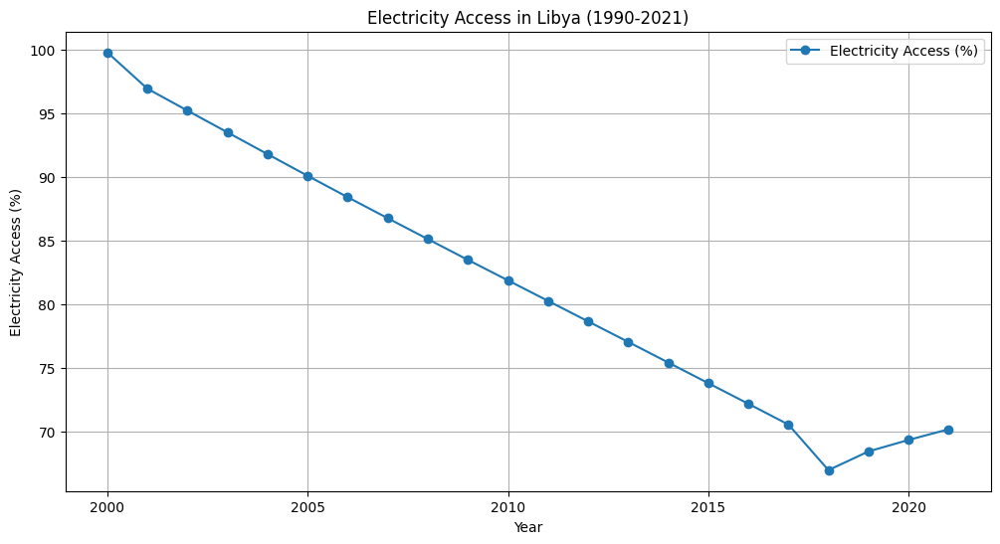

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt

# Define the dataset
libyan_data = {
    1990: [None],
    1991: [None],
    1992: [None],
    1993: [None],
    1994: [None],
    1995: [None],
    1996: [None],
    1997: [None],
    1998: [None],
    1999: [None],
    2000: [99.8],
    2001: [96.95],
    2002: [95.23],
    2003: [93.52],
    2004: [91.81],
    2005: [90.11],
    2006: [88.43],
    2007: [86.78],
    2008: [85.14],
    2009: [83.51],
    2010: [81.9],
    2011: [80.29],
    2012: [78.68],
    2013: [77.07],
    2014: [75.45],
    2015: [73.83],
    2016: [72.21],
    2017: [70.58],
    2018: [67.],
    2019: [68.47],
    2020: [69.37],
    2021: [70.21]
}

# Extract years and corresponding values
years = list(libyan_data.keys())
libya_values = [value[0] for value in libyan_data.values()]

# Plot the data
plt.figure(figsize=(12, 6))
plt.plot(years, libya_values, marker='o', linestyle='-', label='Electricity Access (%)')
plt.title('Electricity Access in Libya (1990-2021)')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')
plt.grid(True)
plt.legend()
plt.show()


<Figure size 1000x600 with 0 Axes>

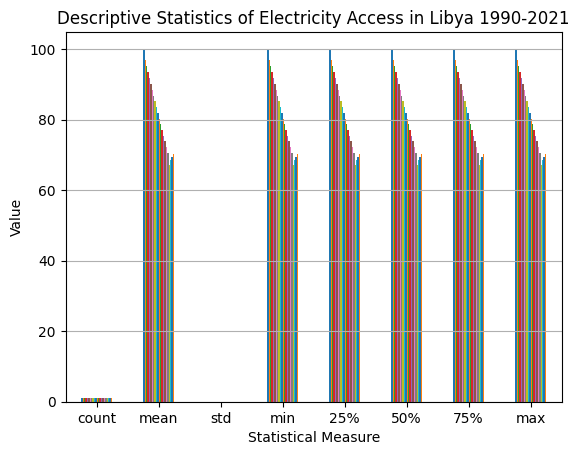

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the Libya dataset
libya_data = {
    1990: [None],
    1991: [None],
    1992: [None],
    1993: [None],
    1994: [None],
    1995: [None],
    1996: [None],
    1997: [None],
    1998: [None],
    1999: [None],
    2000: [99.8],
    2001: [96.95],
    2002: [95.23],
    2003: [93.52],
    2004: [91.81],
    2005: [90.11],
    2006: [88.43],
    2007: [86.78],
    2008: [85.14],
    2009: [83.51],
    2010: [81.9],
    2011: [80.29],
    2012: [78.68],
    2013: [77.07],
    2014: [75.45],
    2015: [73.83],
    2016: [72.21],
    2017: [70.58],
    2018: [67.],
    2019: [68.47],
    2020: [69.37],
    2021: [70.21]
}

# Convert the data to a DataFrame
libya = pd.DataFrame(libya_data)

# Plot the descriptive statistics
plt.figure(figsize=(10, 6))
libya.describe().plot(kind='bar', legend=False)
plt.title('Descriptive Statistics of Electricity Access in Libya 1990-2021')
plt.xlabel('Statistical Measure')
plt.ylabel('Value')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.show()


Nigeria & Libya

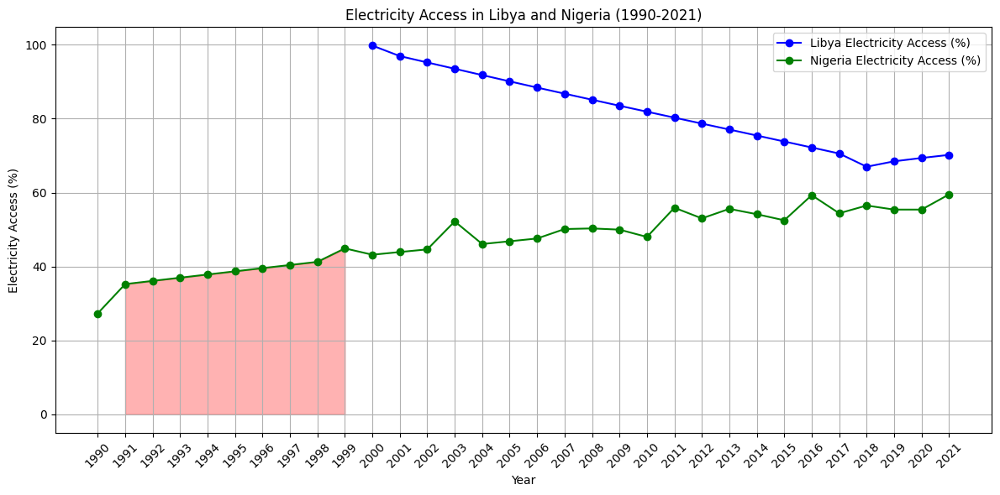

In [ ]:
import matplotlib.pyplot as plt

# Define the Libyan dataset
libyan_data = {
    1990: [None],
    1991: [None],
    1992: [None],
    1993: [None],
    1994: [None],
    1995: [None],
    1996: [None],
    1997: [None],
    1998: [None],
    1999: [None],
    2000: [99.8],
    2001: [96.95],
    2002: [95.23],
    2003: [93.52],
    2004: [91.81],
    2005: [90.11],
    2006: [88.43],
    2007: [86.78],
    2008: [85.14],
    2009: [83.51],
    2010: [81.9],
    2011: [80.29],
    2012: [78.68],
    2013: [77.07],
    2014: [75.45],
    2015: [73.83],
    2016: [72.21],
    2017: [70.58],
    2018: [67.],
    2019: [68.47],
    2020: [69.37],
    2021: [70.21]
}

# Extract years and corresponding values for Libya
years = list(libyan_data.keys())
libya_values = [value[0] for value in libyan_data.values()]

# Define the Nigerian dataset
nigeria = [27.30, 35.23, 36.10, 36.96, 37.83, 38.69, 39.55, 40.40, 41.25,
           44.90, 43.18, 43.91, 44.63, 52.20, 46.08, 46.82, 47.58, 50.13,
           50.30, 49.97, 48.00, 55.90, 53.02, 55.60, 54.15, 52.50, 59.30,
           54.40, 56.50, 55.40, 55.40, 59.50]

# Shade the area between 1991 and 1999 for Nigeria
shade_start = years.index(1991)
shade_end = years.index(1999)

# Plot the data
plt.figure(figsize=(12, 6))

# Plot Libya data
plt.plot(years, libya_values, marker='o', linestyle='-', color='blue', label='Libya Electricity Access (%)')

# Plot Nigeria data
plt.plot(years, nigeria, marker='o', linestyle='-', color='green', label='Nigeria Electricity Access (%)')

# Shade the specified area for Nigeria
plt.fill_between(years[shade_start:shade_end+1], nigeria[shade_start:shade_end+1], color='red', alpha=0.3)

# Titles and labels
plt.title('Electricity Access in Libya and Nigeria (1990-2021)')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')

# Grid and legend
plt.grid(True)
plt.xticks(years, rotation=45)
plt.tight_layout()
plt.legend()

# Show the plot
plt.show()


# Handling Missing Data

In [ ]:
# Preview Data Head
datay.head(2)

,Country Code,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,Percentage Increase
Country Name,,,,,,,,,,,,,,,,,,,,,
Africa Western and Central,AFW,Africa Western and Central,Others,NaN,NaN,NaN,31.58,32.61,33.61,32.63,...,47.05,47.65,46.76,50.90,48.79,51.21,51.16,51.73,54.22,NaN
Angola,AGO,Sub-Saharan Africa,Lower middle income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,38.40,32.00,42.00,41.79,42.91,45.29,45.63,46.96,48.22,NaN


In [ ]:
# Dropping the Categorical Columns, "Country Code", "Region", "IncomeGroup"

el_access = datay.drop(columns=["Country Code", "Region", "IncomeGroup", "Percentage Increase"])


In [ ]:
# Create a dataframe for the metadata
metadata = datay[["Country Code", "Region", "IncomeGroup"]]

In [ ]:
#preview metadata head
metadata.head(2)

,Country Code,Region,IncomeGroup
Country Name,,,
Africa Western and Central,AFW,Africa Western and Central,Others
Angola,AGO,Sub-Saharan Africa,Lower middle income


In [ ]:
# Preveiwe datahead
el_access.head(2)

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Country Name,,,,,,,,,,,,,,,,,,,,,
Africa Western and Central,NaN,NaN,NaN,31.58,32.61,33.61,32.63,32.46,33.46,34.81,...,44.05,47.05,47.65,46.76,50.90,48.79,51.21,51.16,51.73,54.22
Angola,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,37.26,38.40,32.00,42.00,41.79,42.91,45.29,45.63,46.96,48.22


In [ ]:
el_access.columns

Index(['1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998',
       '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007',
       '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016',
       '2017', '2018', '2019', '2020', '2021'],
      dtype='object')

## SID

In [ ]:
#Preview Shape
el_access.shape

(4, 32)

In [ ]:
# Preview Info
el_access.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4 entries, Mauritius to Zambia
Data columns (total 32 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   1990    4 non-null      float64
 1   1991    4 non-null      float64
 2   1992    4 non-null      float64
 3   1993    4 non-null      float64
 4   1994    4 non-null      float64
 5   1995    4 non-null      float64
 6   1996    4 non-null      float64
 7   1997    4 non-null      float64
 8   1998    4 non-null      float64
 9   1999    4 non-null      float64
 10  2000    4 non-null      float64
 11  2001    4 non-null      float64
 12  2002    4 non-null      float64
 13  2003    4 non-null      float64
 14  2004    4 non-null      float64
 15  2005    4 non-null      float64
 16  2006    4 non-null      float64
 17  2007    4 non-null      float64
 18  2008    4 non-null      float64
 19  2009    4 non-null      float64
 20  2010    4 non-null      float64
 21  2011    4 non-null      float64
 22

In [ ]:
# Descriptive Stats
el_access.describe()

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
count,4.00000,4.00000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,...,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,43.26000,43.49250,45.452500,44.550000,45.075000,45.602500,46.350000,46.640000,47.450000,48.367500,...,55.570000,57.037500,56.605000,57.797500,61.217500,61.820000,62.965000,63.992500,64.790000,66.890000
std,38.02434,38.19632,36.424575,37.569148,37.253353,36.942578,36.388025,36.323505,35.701663,35.590506,...,30.778585,30.106626,30.574604,29.333492,27.484852,25.978025,25.644348,24.848237,23.970296,22.794814
min,13.90000,12.75000,19.200000,14.210000,14.940000,15.670000,17.300000,17.110000,19.000000,18.540000,...,29.190000,30.050000,27.900000,31.100000,35.380000,40.300000,40.230000,43.000000,44.600000,46.690000
25%,23.95000,23.37750,25.357500,24.477500,25.020000,25.570000,26.337500,26.650000,27.482500,27.720000,...,37.822500,39.837500,40.650000,43.790000,46.720000,49.802500,51.562500,52.300000,52.700000,56.297500
50%,30.05000,31.07500,31.755000,32.430000,33.105000,33.780000,34.450000,35.115000,35.780000,37.840000,...,46.860000,49.350000,49.525000,50.260000,54.900000,53.685000,55.920000,56.485000,57.550000,60.635000
75%,49.36000,51.19000,51.850000,52.502500,53.160000,53.812500,54.462500,55.105000,55.747500,58.487500,...,64.607500,66.550000,65.480000,64.267500,69.397500,65.702500,67.322500,68.177500,69.640000,71.227500
max,99.04000,99.07000,99.100000,99.130000,99.150000,99.180000,99.200000,99.220000,99.240000,99.250000,...,99.370000,99.400000,99.470000,99.570000,99.690000,99.610000,99.790000,100.000000,99.460000,99.600000


# Missing Data Classification [MCAR,MNAR & MAR]

## Domain Knowledge

Based on the provided information, it seems like the missing data may be Missing Not At Random (MNAR) or Missing At Random (MAR). Let's break down the reasons and determine the appropriate classification:

1. *Sporadic Surveys*: If data availability depends on sporadic surveys, it's likely that the missingness is MNAR, as it's related to unobserved factors specific to certain time periods or countries.

2. *Initiation Year of Programs*: For indicators that start from the year a program was launched (e.g., Doing Business indicators starting from 2003), missingness might be MNAR. This is because data is only available after the program initiation, and earlier years are missing due to program non-existence.

3. *Consistent Time Series*: If data availability is limited due to updated indicator definitions and methodology (e.g., Government finance statistics from 1990, balance of payments statistics from 2005), it might be MAR. The missingness is related to observable factors (e.g., methodological changes) rather than unobserved characteristics.

4. *Non-Reporting Countries*: Countries that do not regularly report data due to conflict, lack of statistical capacity, or other reasons (e.g., Somalia, North Korea) may lead to MNAR missingness. The absence of data is related to unobservable factors like political instability or lack of resources.

5. *Non-Existent Countries*: Countries that did not exist in earlier years (e.g., former Soviet Union countries, South Sudan, Eritrea, Timor-Leste) have missing data for those years, which is MAR. The missingness is based on observable characteristics related to country formation or dissolution.

Based on this analysis, the missing data is likely a combination of MNAR and MAR mechanisms, with some indicators leaning towards one or the other. It's essential to consider these reasons when analyzing and interpreting the dataset to avoid biased conclusions.

Sporadic Surveys -MNAR

Initiation Year of Programs -MNAR

Consistent Time Series - MAR

Non-Reporting Countries - MNAR

Non-Existent Countries - MAR

MNAR - 3

MAR - 2

In [ ]:
# Calculate the percentage of missing values in each column
missing_percentage = (el_access.isnull().mean()) * 100

# Display the result
print("Percentage of missing values in each column :")
for column, percentage in missing_percentage.items():
    print(f"{column}: {round(percentage, 2)}%")


Percentage of missing values in each column :
1990: 92.73%
1991: 87.27%
1992: 72.73%
1993: 63.64%
1994: 58.18%
1995: 54.55%
1996: 41.82%
1997: 36.36%
1998: 32.73%
1999: 30.91%
2000: 5.45%
2001: 5.45%
2002: 3.64%
2003: 3.64%
2004: 3.64%
2005: 3.64%
2006: 3.64%
2007: 0.0%
2008: 0.0%
2009: 0.0%
2010: 0.0%
2011: 0.0%
2012: 0.0%
2013: 0.0%
2014: 0.0%
2015: 0.0%
2016: 0.0%
2017: 0.0%
2018: 0.0%
2019: 0.0%
2020: 0.0%
2021: 0.0%


Based on the provided information on the percentage of missing values in each column:

1. **Region** and **IncomeGroup**: These columns have no missing values (0.0%), indicating that data is available for all countries.

2. **1990 to 1999**: These columns have high percentages of missing values, ranging from 92.98% to 33.33%. The high percentage of missing values in earlier years (1990 to 1996) suggests that data might be Missing Not At Random (MNAR) or Missing At Random (MAR). Possible reasons include sporadic surveys, non-reporting countries, or data unavailability due to conflict or lack of statistical capacity.

3. **2000 to 2021**: These columns have lower percentages of missing values, ranging from 8.77% to 3.51%. The decrease in missingness from 1999 onwards might indicate a change in data collection practices, such as improved reporting mechanisms or changes in methodology. This decrease suggests that missingness might be Missing At Random (MAR) or even Missing Completely At Random (MCAR), where missingness is unrelated to the unobserved values.

Overall, the pattern of missingness suggests a combination of MNAR and MAR mechanisms. Understanding the reasons behind missingness and considering the implications of different missing data mechanisms is crucial for appropriate data analysis and interpretation.

## Visual Analysis

### Missingness Heatmap

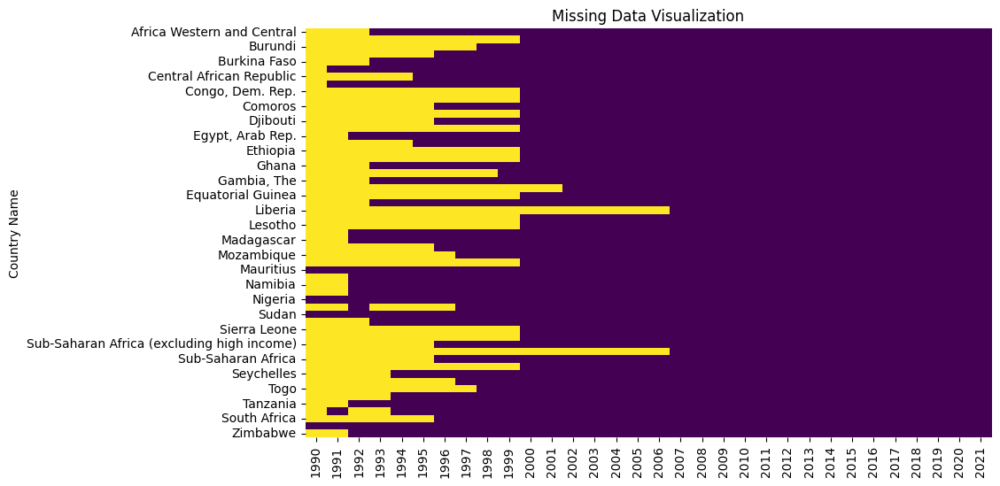

In [ ]:

# Plotting a heatmap to visualize missing values
plt.figure(figsize=(10, 6))
sns.heatmap(el_access.isnull(), cmap='viridis', cbar=False)
plt.title('Missing Data Visualization')
plt.show()


### % Of Missing Data

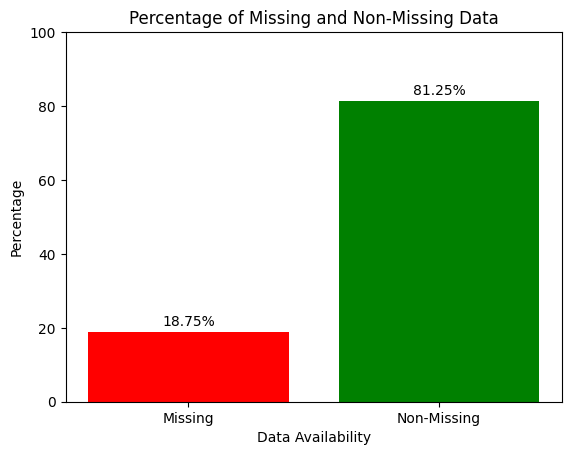

In [ ]:
# Calculate the total number of missing values
total_missing = el_access.isnull().sum().sum()

# Calculate the total number of values in the dataset
total_values = el_access.size

# Calculate the total number of non-missing values
total_non_missing = total_values - total_missing

# Calculate the percentage of missing and non-missing data
percentage_missing = (total_missing / total_values) * 100
percentage_non_missing = 100 - percentage_missing

# Plot the bar graph
categories = ['Missing', 'Non-Missing']
percentages = [percentage_missing, percentage_non_missing]

plt.bar(categories, percentages, color=['red', 'green'])
plt.xlabel('Data Availability')
plt.ylabel('Percentage')
plt.title('Percentage of Missing and Non-Missing Data')

# Annotate the percentage values on the bars
for i, percentage in enumerate(percentages):
    plt.text(i, percentage + 1, f'{percentage:.2f}%', ha='center', va='bottom')

plt.ylim(0, 100)  # Set y-axis limit to 0-100%
plt.show()


### Correlation Plot

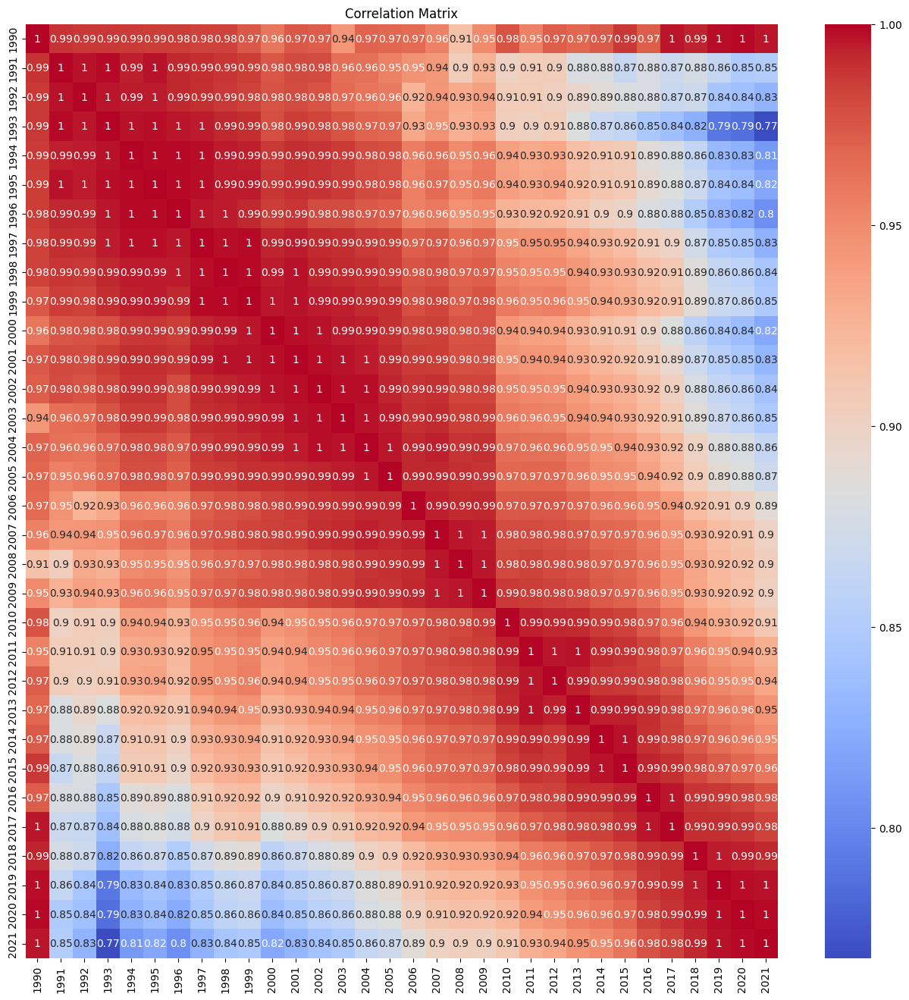

In [ ]:
# Calculating correlation matrix
corr_matrix = el_access.corr()

# Plotting a heatmap of correlations
plt.figure(figsize=(16, 16))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


### Imputation Comparison

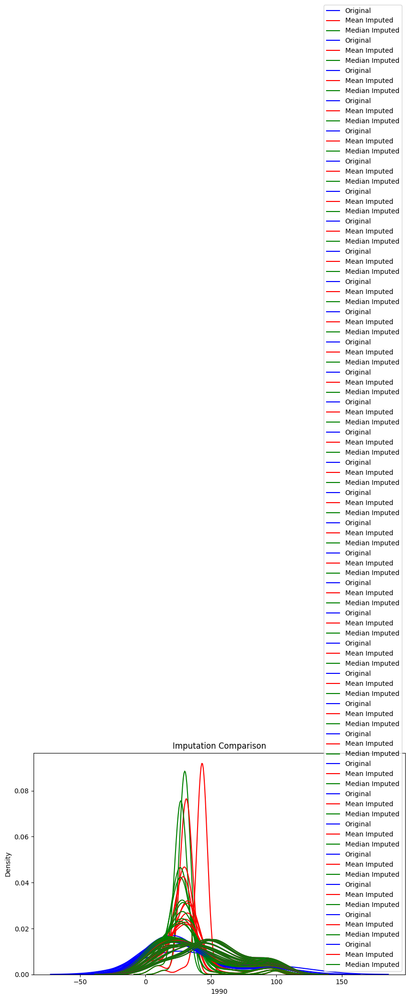

In [ ]:
# Perform imputation using different techniques
imputed_mean = el_access.fillna(el_access.mean())
imputed_median = el_access.fillna(el_access.median())

# Specify the columns with missing variables
columns_with_missing = ['1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998',
                        '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007',
                        '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016',
                        '2017', '2018', '2019', '2020', '2021']

# Compare distributions of imputed values
plt.figure(figsize=(10, 6))
for column in columns_with_missing:
    sns.kdeplot(data=el_access[column], color='blue', label='Original')
    sns.kdeplot(data=imputed_mean[column], color='red', label='Mean Imputed')
    sns.kdeplot(data=imputed_median[column], color='green', label='Median Imputed')
plt.title('Imputation Comparison')
plt.legend()
plt.show()



By analyzing these visualizations, you can gain insights into the missing data mechanism and determine whether it's MCAR, MAR, or MNAR. Remember that these techniques provide clues rather than definitive answers, so it's essential to interpret the results cautiously and consider domain knowledge.

### Histograms & Boxplot

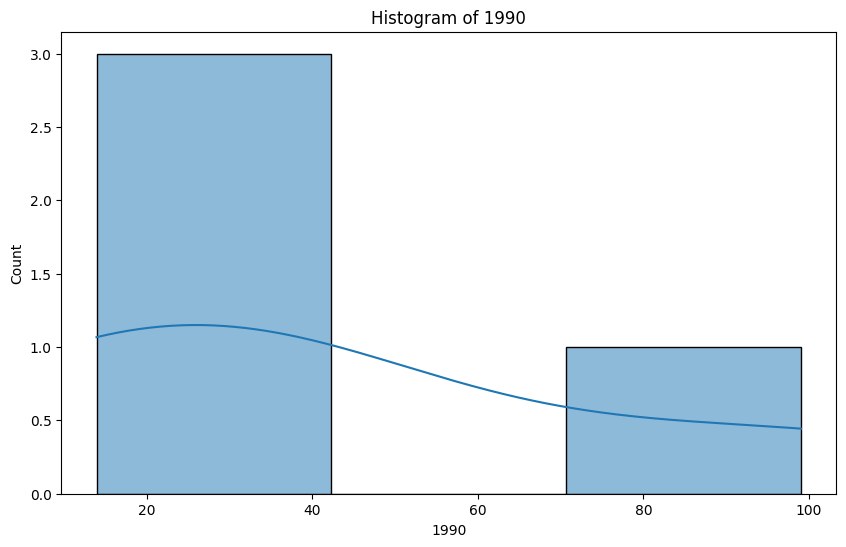

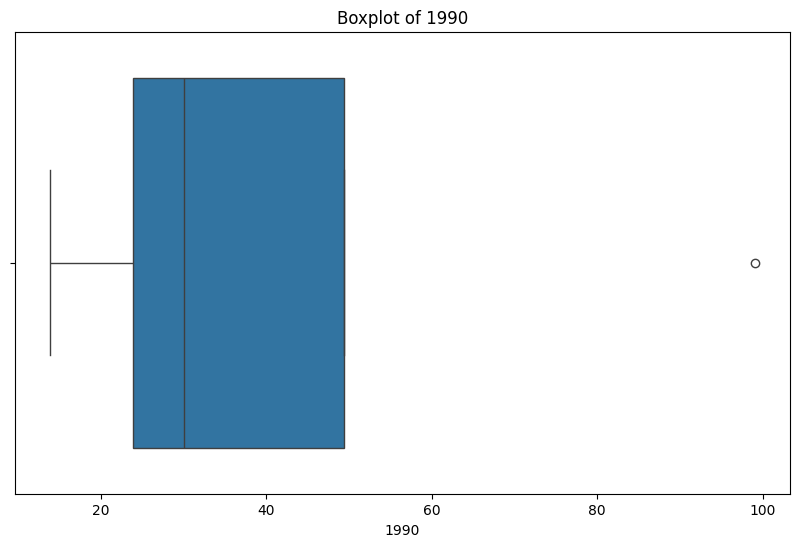

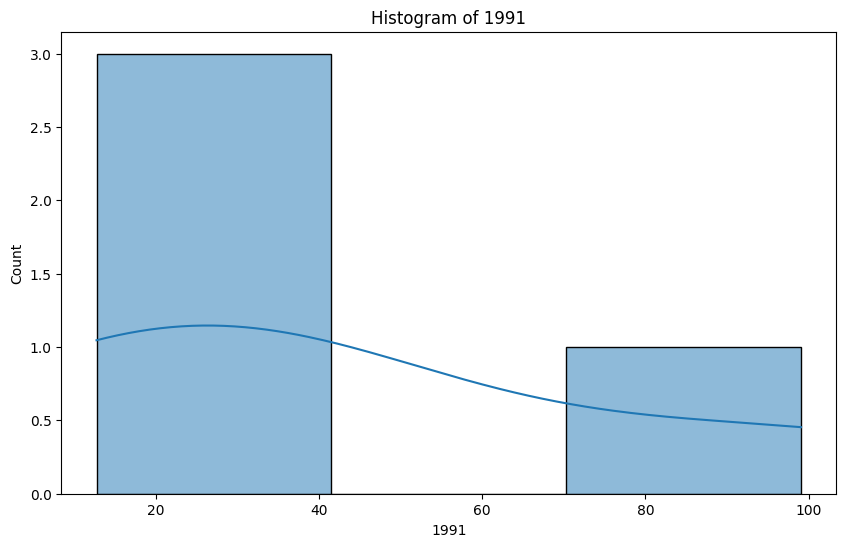

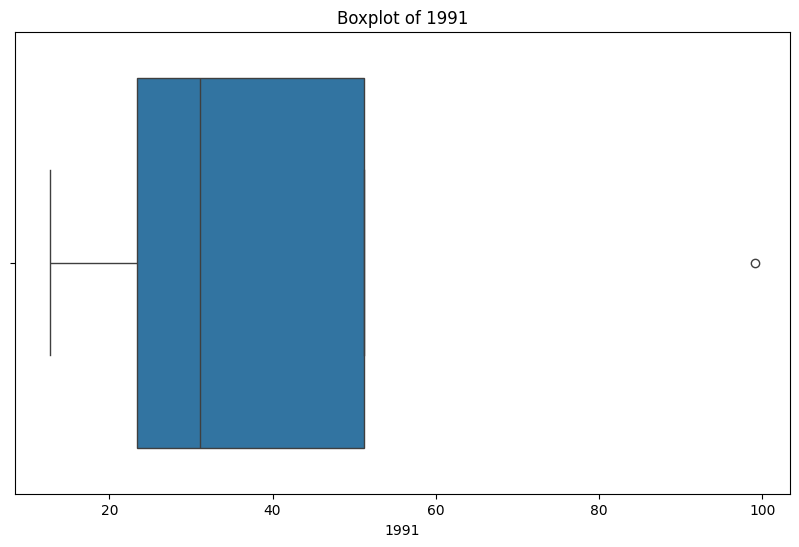

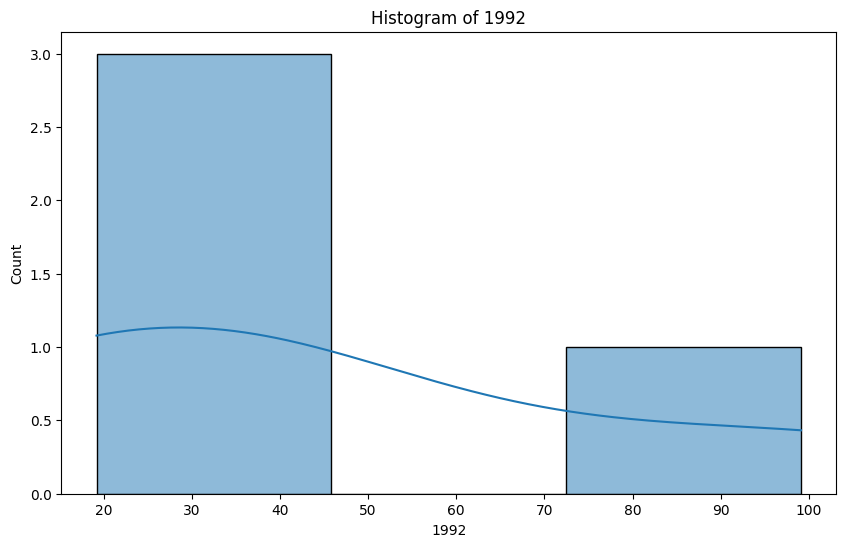

...

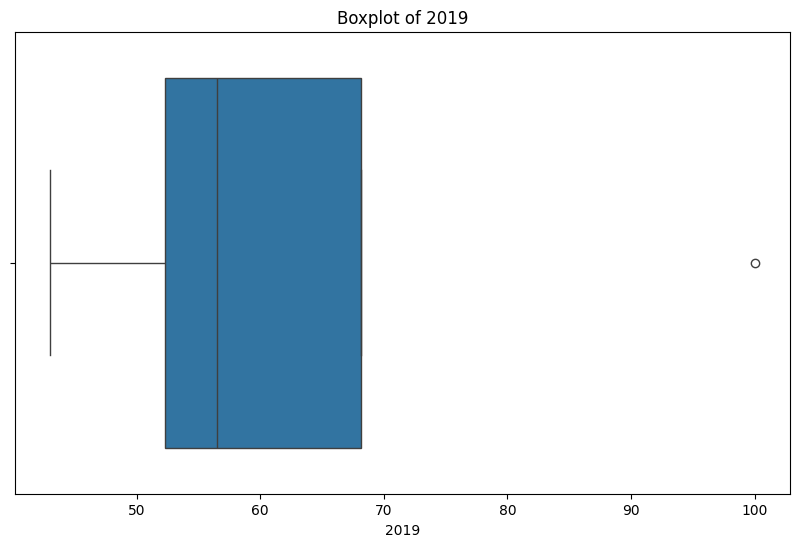

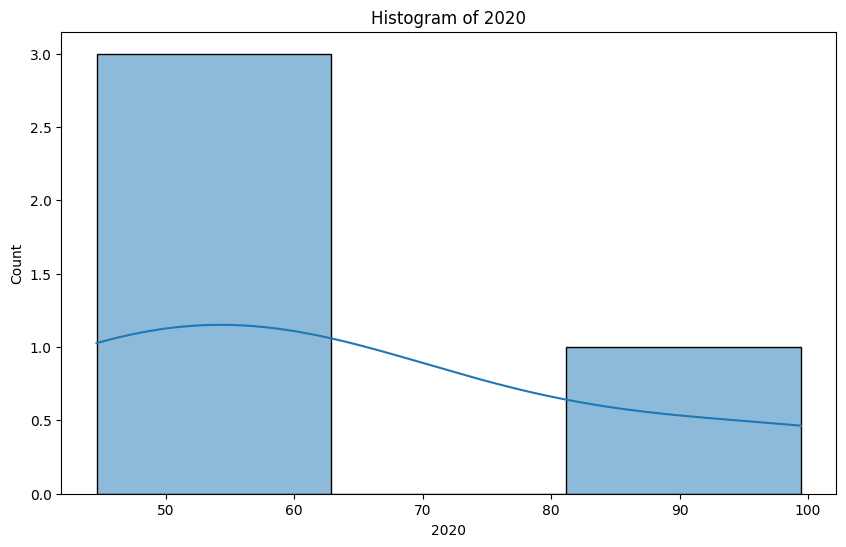

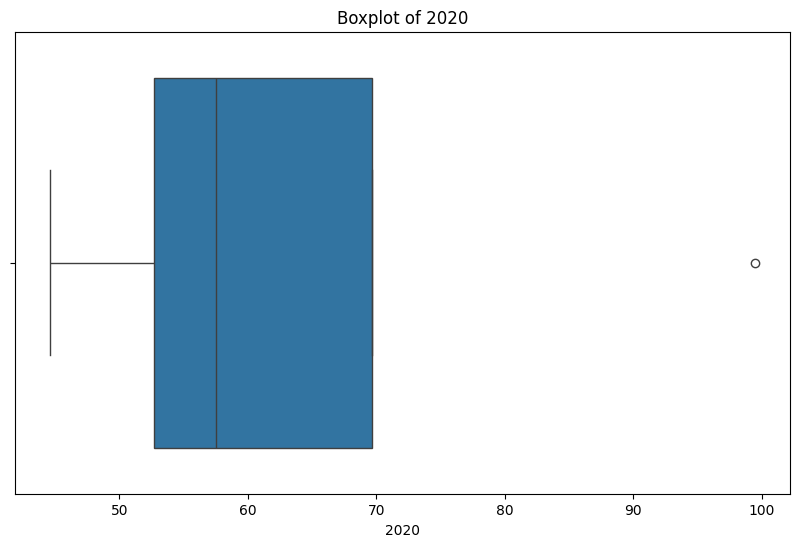

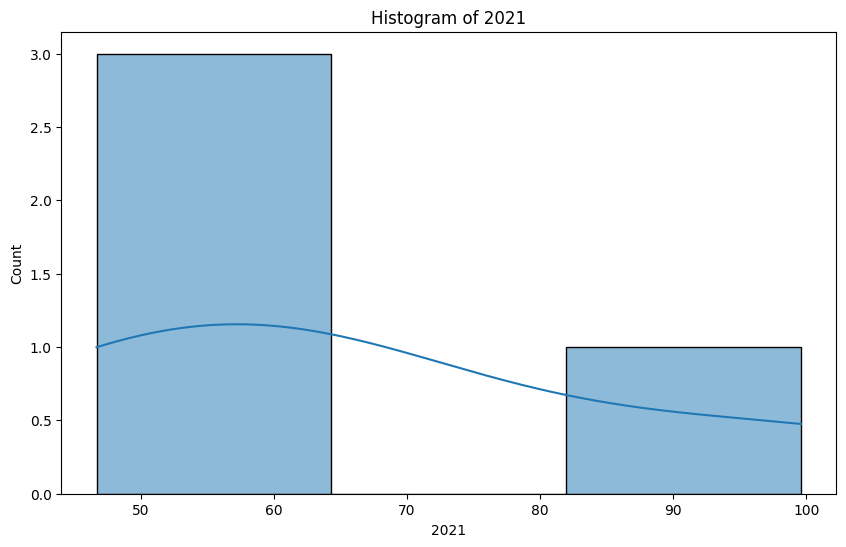

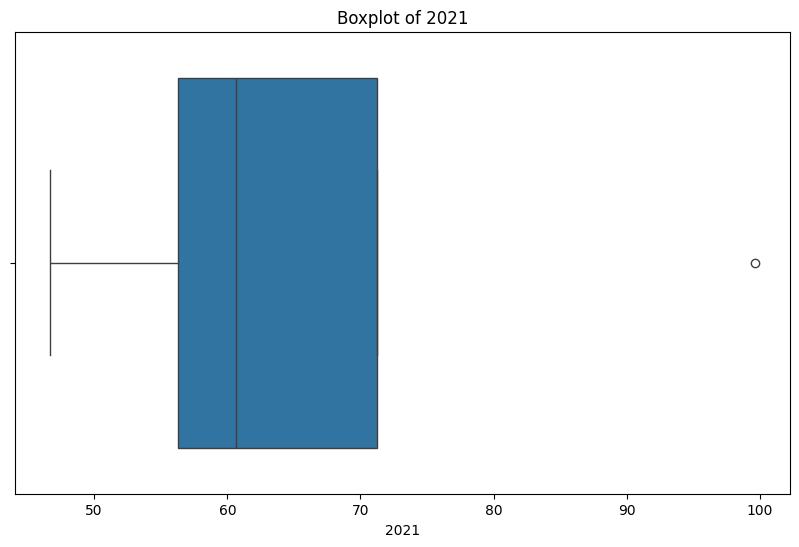

In [ ]:
# Plot histograms and boxplots for variables with missing values
for column in columns_with_missing:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=el_access, x=column, kde=True)
    plt.title(f'Histogram of {column}')
    plt.show()

    plt.figure(figsize=(10, 6))
    sns.boxplot(data=el_access, x=column)
    plt.title(f'Boxplot of {column}')
    plt.show()


## Domain Knowledge - MNAR Conclusion

We will disregard "Non-Existent Countries" from our analysis, as our focus commences from 1990, a period when I presume all referenced African nations were established. Consequently, the remaining statistics are as follows:

MNAR-3

MAR-1

## Missing Data Modelling

# Model Development

In [ ]:
"""
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from fbprophet import Prophet
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Load the dataset
# Replace 'your_dataset.csv' with the path to your dataset
# df = pd.read_csv('your_dataset.csv')

# Convert 'Year' column to datetime
df['Year'] = pd.to_datetime(df['Year'], format='%Y')
# Set 'Year' column as index
df.set_index('Year', inplace=True)

# Split the dataset into train and test sets
train_size = int(len(df) * 0.8)
train, test = df[:train_size], df[train_size:]

# ARIMA Model
model_arima = ARIMA(train, order=(5,1,0))  # ARIMA(p,d,q) where p=5, d=1, q=0
arima_result = model_arima.fit()
arima_forecast = arima_result.forecast(steps=len(test))

# SARIMA Model
model_sarima = SARIMAX(train, order=(5, 1, 0), seasonal_order=(1, 1, 1, 12))  # SARIMA(p,d,q)(P,D,Q,s) where p=5, d=1, q=0, P=1, D=1, Q=1, s=12
sarima_result = model_sarima.fit()
sarima_forecast = sarima_result.forecast(steps=len(test))

# Prophet Model
prophet_df = train.reset_index().rename(columns={'Year': 'ds', 'Electricity Access': 'y'})
model_prophet = Prophet()
model_prophet.fit(prophet_df)
future = model_prophet.make_future_dataframe(periods=len(test), freq='Y')
prophet_forecast = model_prophet.predict(future)

# Evaluation Metrics
# Mean Absolute Error (MAE)
mae_arima = mean_absolute_error(test.values, arima_forecast)
mae_sarima = mean_absolute_error(test.values, sarima_forecast)
mae_prophet = mean_absolute_error(test.values, prophet_forecast['yhat'][train_size:])

# Mean Squared Error (MSE)
mse_arima = mean_squared_error(test.values, arima_forecast)
mse_sarima = mean_squared_error(test.values, sarima_forecast)
mse_prophet = mean_squared_error(test.values, prophet_forecast['yhat'][train_size:])

# Root Mean Squared Error (RMSE)
rmse_arima = np.sqrt(mse_arima)
rmse_sarima = np.sqrt(mse_sarima)
rmse_prophet = np.sqrt(mse_prophet)

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(train.index, train.values, label='Train')
plt.plot(test.index, test.values, label='Test', color='red')

# Plot ARIMA forecast
plt.plot(test.index, arima_forecast, label=f'ARIMA Forecast (MAE={mae_arima:.2f}, RMSE={rmse_arima:.2f})', linestyle='--')

# Plot SARIMA forecast
plt.plot(test.index, sarima_forecast, label=f'SARIMA Forecast (MAE={mae_sarima:.2f}, RMSE={rmse_sarima:.2f})', linestyle='--')

# Plot Prophet forecast
plt.plot(test.index, prophet_forecast['yhat'][train_size:], label=f'Prophet Forecast (MAE={mae_prophet:.2f}, RMSE={rmse_prophet:.2f})', linestyle='--')

plt.title('Electricity Access Forecast')
plt.xlabel('Year')
plt.ylabel('Electricity Access Percentage')
plt.legend()
plt.show()




Time Series Forecasting Models:
ARIMA (AutoRegressive Integrated Moving Average): Suitable for capturing linear
relationships and autocorrelation in time series data. It can handle seasonality
  and trend components.

SARIMA (Seasonal ARIMA): Extends ARIMA to account for seasonal patterns in the
data, which might be present in electricity access rates.

Prophet: Developed by Facebook, Prophet is a forecasting tool designed for time
 series data with daily observations that display patterns on different time
 scales. It's flexible and handles missing data well.

In [ ]:
def fill_missing_values(model, country, el_access):
    specific_row = el_access.loc[country]
    missing_years = specific_row.index[specific_row.isnull()].tolist()

    for year in missing_years:
        year_int = int(year)
        X_predict = [[year_int]]
        predicted_value = np.clip(model.predict(X_predict), 0, 100)[0]
        el_access.at[country, year] = predicted_value

def train_regression_model(type, X_train, y_train):
    if type == 1:
        model = LinearRegression()
        print("Linear Regression Model is being used")
    elif type == 2:
        model = Ridge()
        print("Ridge Model is being used")
    elif type == 3:
        model = Lasso()
        print("Lasso Model is being used")
    else:
        raise ValueError("Invalid model type")

    model.fit(np.array(X_train).reshape(-1, 1), y_train)
    return model


# Iterate over rows to train models and fill missing values
for country, data in el_access.iterrows():
    # Filter out missing values and convert indices to integers
    valid_data = data.dropna()
    X_train = [int(year) for year in valid_data.index]
    y_train = valid_data.values

    # Check if there are enough data points for training
    if len(X_train) <= 1:
        print(f"Not enough data points for {country}, skipping")
        continue

    # Train regression model
    model = train_regression_model(1, X_train, y_train)

    # Fill missing values
    if model is not None:
        fill_missing_values(model, country, el_access)

# Predict the values for the missing years (2022-2030)
for country in el_access.index:
    years_2022_to_2030 = [str(year) for year in range(2022, 2031)]
    valid_years = [year for year in years_2022_to_2030 if year not in el_access.columns]

    for year in valid_years:
        specific_row = el_access.loc[country]
        X_predict = [[int(year)]]
        predicted_value = np.clip(model.predict(X_predict), 0, 100)[0]
        el_access.at[country, year] = predicted_value

el_access = el_access.round(2)


Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regression Model is being used
Linear Regre

In [ ]:
electricity_access_linear = el_access

In [ ]:
electricity_access_linear.head()

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
Country Name,,,,,,,,,,,,,,,,,,,,,
Africa Western and Central,27.44,28.26,29.07,31.58,32.61,33.61,32.63,32.46,33.46,34.81,...,54.22,46.54,47.12,47.69,48.27,48.85,49.43,50.01,50.59,51.17
Angola,12.45,13.59,14.72,15.86,16.99,18.13,19.26,20.40,21.54,22.67,...,48.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Burundi,0.00,0.00,0.00,0.00,0.19,0.55,0.91,1.27,3.90,2.07,...,10.23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Benin,11.63,12.61,13.59,14.56,15.54,16.51,14.50,18.59,19.58,20.56,...,41.97,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Burkina Faso,4.30,4.77,5.24,6.10,6.13,6.63,7.12,7.62,8.11,6.90,...,18.95,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Save to CSV
electricity_access_linear.to_csv('electricity_access_linear.csv')

## Ridge Modelling

In [ ]:
for country, data in el_access.iterrows():
    # Filter out missing values and convert indices to integers
    valid_data = data.dropna()
    X_train = [[int(year)] for year in valid_data.index]
    y_train = valid_data.values

    # Check if there are enough data points for training
    if len(X_train) <= 1:
        print(f"Not enough data points for {country}, skipping")
        continue

    # Training Ridge Linear Regression
    model = train_regression_model(2, X_train, y_train)

    if model is not None:
        fill_missing_values(model, country, el_access)

# Predict the values for the missing years (2022-2030)
for country in el_access.index:
    years_2022_to_2030 = [str(year) for year in range(2022, 2031)]
    valid_years = [year for year in years_2022_to_2030 if year not in el_access.columns]

    for year in valid_years:
        X_predict = [[int(year)]]
        predicted_value = np.clip(model.predict(X_predict), 0, 100)[0]
        el_access.at[country, year] = predicted_value

el_access = el_access.round(2)


In [ ]:
electricity_access_ridge = el_access

In [ ]:
electricity_access_ridge.head()

In [ ]:
# Save ridge dataset
electricity_access_ridge.to_csv('electricity_access_ridge.csv')

##Lasso Modelling

In [ ]:
for country, data in el_access.iterrows():
    # Filter out missing values and convert indices to integers
    valid_data = data.dropna()
    X_train = [[int(year)] for year in valid_data.index]
    y_train = valid_data.values

    # Check if there are enough data points for training
    if len(X_train) <= 1:
        print(f"Not enough data points for {country}, skipping")
        continue

    # Training Lasso Linear Regression
    model = train_regression_model(3, X_train, y_train)

    if model is not None:
        fill_missing_values(model, country, el_access)

# Predict the values for the missing years (2022-2030)
for country in el_access.index:
    years_2022_to_2030 = [str(year) for year in range(2022, 2031)]
    valid_years = [year for year in years_2022_to_2030 if year not in el_access.columns]

    for year in valid_years:
        X_predict = [[int(year)]]
        predicted_value = np.clip(model.predict(X_predict), 0, 100)[0]
        el_access.at[country, year] = predicted_value

el_access = el_access.round(2)


In [ ]:
electricity_access_lasso = el_access

In [ ]:
electricity_access_lasso.head()

In [ ]:
# Save Lasso Dataset
electricity_access_lasso.to_csv('electricity_access_lasso.csv')

# Prediction VS Default Dataset


In [ ]:
lass = pd.read_csv("/content/Lasso_BackFill & Predictions.csv")

In [ ]:
#Preview head
lass.head(2)

,Country Name,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Africa Western and Central,27.44,28.26,29.07,31.58,32.61,33.61,32.63,32.46,33.46,...,54.22,53.38,54.19,54.99,55.8,56.61,57.41,58.22,59.02,59.83
1,Angola,12.45,13.59,14.72,15.86,16.99,18.13,19.26,20.40,21.54,...,48.22,48.71,49.84,50.97,52.1,53.22,54.35,55.48,56.61,57.74


In [ ]:
lass.columns

Index(['Country Name', '1990', '1991', '1992', '1993', '1994', '1995', '1996',
       '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014',
       '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023',
       '2024', '2025', '2026', '2027', '2028', '2029', '2030'],
      dtype='object')

### Lass Dataset 4 Africa projection

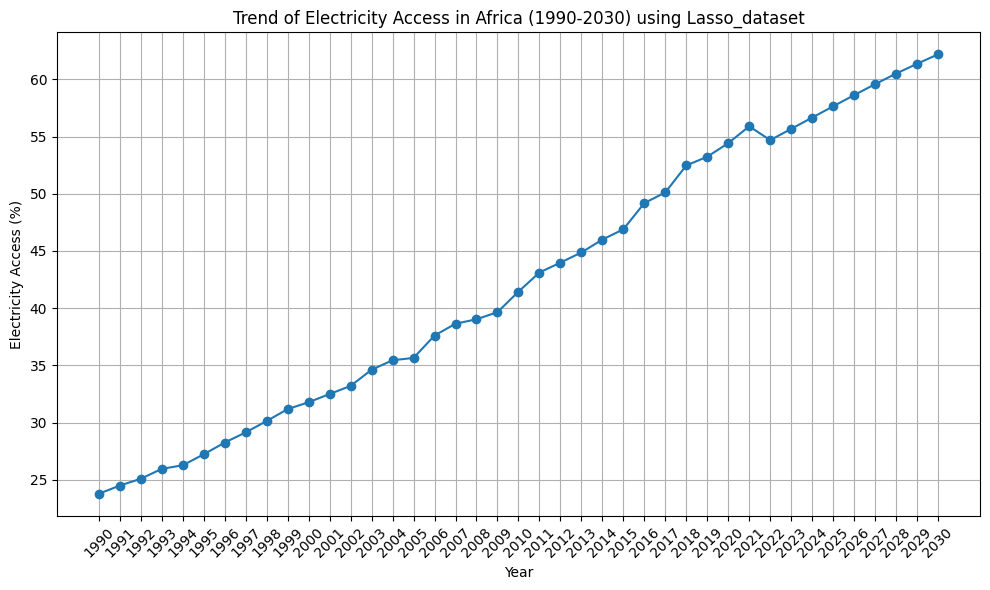

In [ ]:
# Calculate the mean column-wise
mean_electricity_access_lass = lass.iloc[:, 1:].mean(axis=0)

# Create a new DataFrame with the mean values
africa_electricity_access_lass = pd.DataFrame(mean_electricity_access_lass, columns=['Electricity Access'])

# Add a column for years
africa_electricity_access_lass['Year'] = africa_electricity_access_lass.index.astype(int)

# Set the 'Year' column as the index
africa_electricity_access_lass.set_index('Year', inplace=True)

# Plot the trend
plt.figure(figsize=(10, 6))
plt.plot(africa_electricity_access_lass.index, africa_electricity_access_lass['Electricity Access'], marker='o', linestyle='-')

plt.title('Trend of Electricity Access in Africa (1990-2030) using Lasso_dataset')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')
plt.grid(True)
plt.xticks(africa_electricity_access_lass.index, rotation=45)
plt.tight_layout()
plt.show()




In [ ]:
datay = datay.drop('Percentage Increase', axis=1)

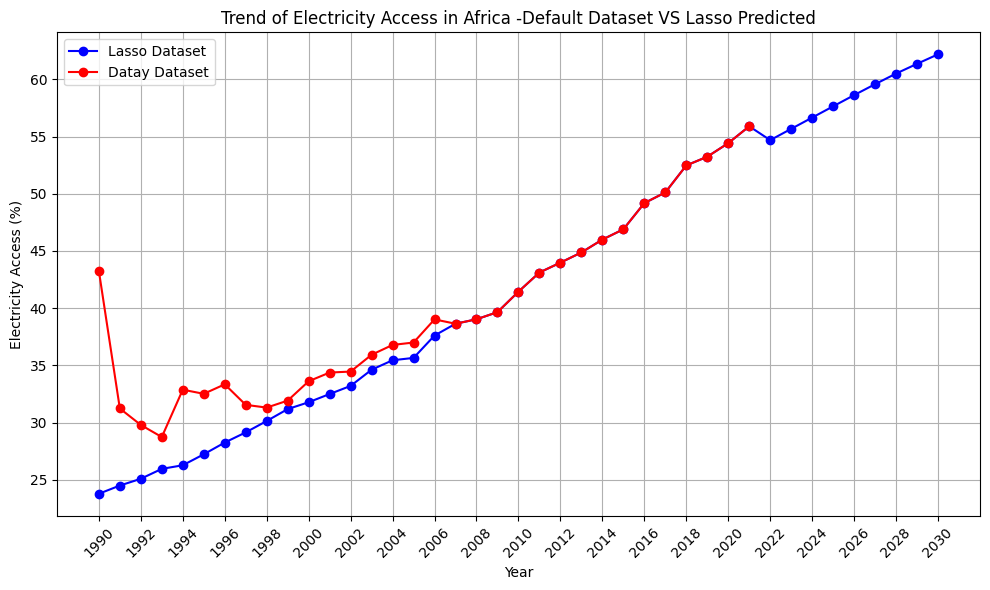

In [ ]:
# Assuming you have the DataFrames lass and datay already defined

# Calculate the mean electricity access column-wise for both DataFrames
mean_electricity_access_lass = lass.iloc[:, 1:].mean(axis=0)
mean_electricity_access_datay = datay.iloc[:, 3:].mean(axis=0)

# Create DataFrames with the mean values and add a column for years
africa_electricity_access_lass = pd.DataFrame(mean_electricity_access_lass, columns=['Electricity Access'])
africa_electricity_access_lass['Year'] = africa_electricity_access_lass.index.astype(int)

africa_electricity_access_datay = pd.DataFrame(mean_electricity_access_datay, columns=['Electricity Access'])
africa_electricity_access_datay['Year'] = africa_electricity_access_datay.index.astype(int)

# Set the 'Year' column as the index for both DataFrames
africa_electricity_access_lass.set_index('Year', inplace=True)
africa_electricity_access_datay.set_index('Year', inplace=True)

# Plot the trends on the same graph with different colors
plt.figure(figsize=(10, 6))
plt.plot(africa_electricity_access_lass.index, africa_electricity_access_lass['Electricity Access'], marker='o', linestyle='-', color='blue', label='Lasso Dataset')
plt.plot(africa_electricity_access_datay.index, africa_electricity_access_datay['Electricity Access'], marker='o', linestyle='-', color='red', label='Datay Dataset')
plt.title('Trend of Electricity Access in Africa -Default Dataset VS Lasso Predicted')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')
plt.grid(True)
plt.xticks(range(1990, 2032, 2), rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


### Ridge Dataset 4 Africa projection

In [ ]:
ridge = pd.read_csv("/content/Ridge_BackFill & Predictions.csv")

In [ ]:
ridge.head(2)

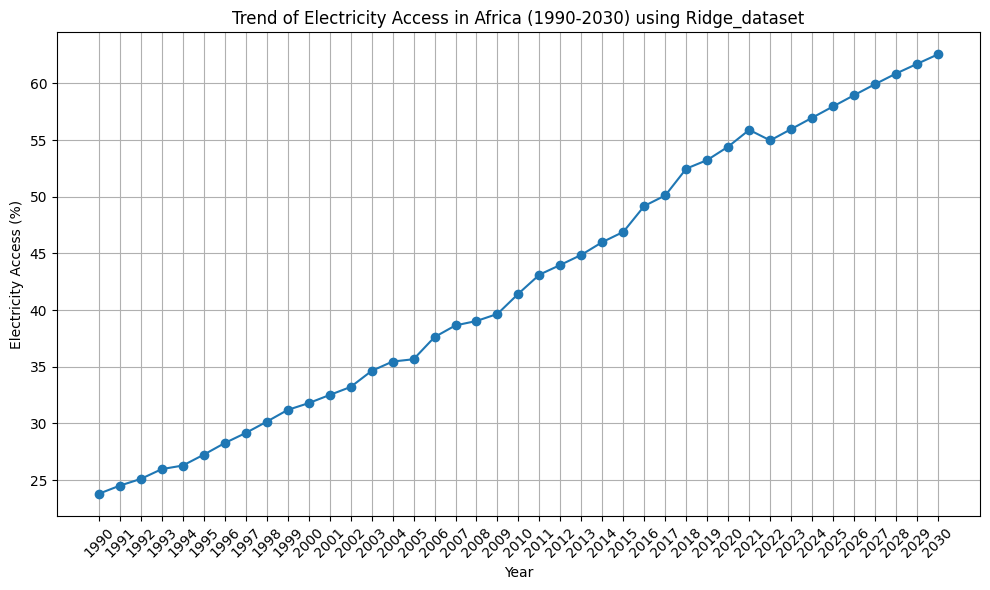

In [ ]:
# Calculate the mean column-wise
mean_electricity_access_ridge = ridge.iloc[:, 1:].mean(axis=0)

# Create a new DataFrame with the mean values
africa_electricity_access_ridge = pd.DataFrame(mean_electricity_access_ridge, columns=['Electricity Access'])

# Add a column for years
africa_electricity_access_ridge['Year'] = africa_electricity_access_ridge.index.astype(int)

# Set the 'Year' column as the index
africa_electricity_access_ridge.set_index('Year', inplace=True)

# Plot the trend
plt.figure(figsize=(10, 6))
plt.plot(africa_electricity_access_ridge.index, africa_electricity_access_ridge['Electricity Access'], marker='o', linestyle='-')

plt.title('Trend of Electricity Access in Africa (1990-2030) using Ridge_dataset')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')
plt.grid(True)
plt.xticks(africa_electricity_access_ridge.index, rotation=45)
plt.tight_layout()
plt.show()




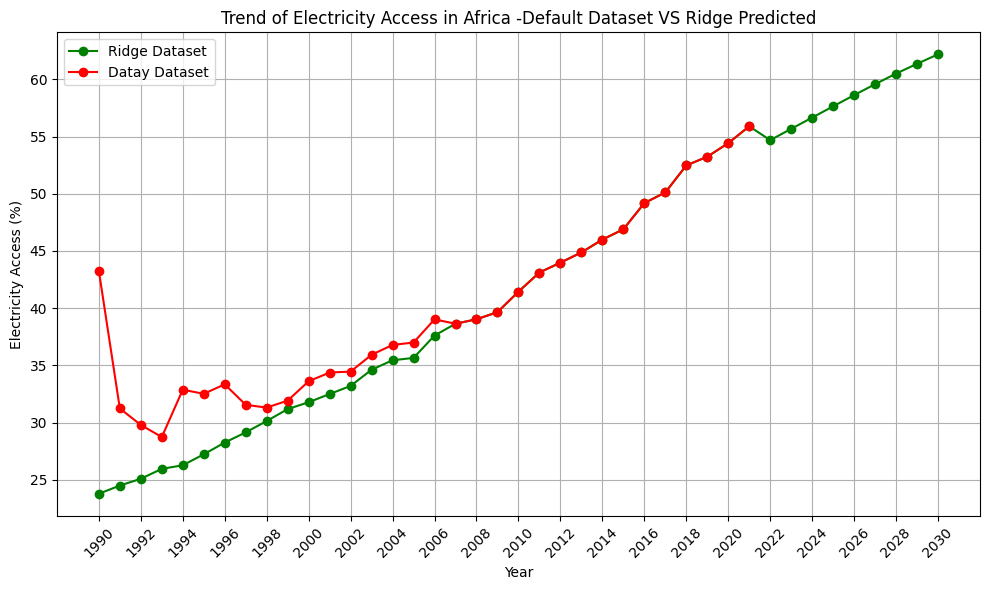

In [ ]:
# Assuming you have the DataFrames Ridge and datay already defined

# Calculate the mean electricity access column-wise for both DataFrames
mean_electricity_access_lass = lass.iloc[:, 1:].mean(axis=0)
mean_electricity_access_datay = datay.iloc[:, 3:].mean(axis=0)

# Create DataFrames with the mean values and add a column for years
africa_electricity_access_lass = pd.DataFrame(mean_electricity_access_lass, columns=['Electricity Access'])
africa_electricity_access_lass['Year'] = africa_electricity_access_lass.index.astype(int)

africa_electricity_access_datay = pd.DataFrame(mean_electricity_access_datay, columns=['Electricity Access'])
africa_electricity_access_datay['Year'] = africa_electricity_access_datay.index.astype(int)

# Set the 'Year' column as the index for both DataFrames
africa_electricity_access_lass.set_index('Year', inplace=True)
africa_electricity_access_datay.set_index('Year', inplace=True)

# Plot the trends on the same graph with different colors
plt.figure(figsize=(10, 6))
plt.plot(africa_electricity_access_lass.index, africa_electricity_access_lass['Electricity Access'], marker='o', linestyle='-', color='green', label='Ridge Dataset')
plt.plot(africa_electricity_access_datay.index, africa_electricity_access_datay['Electricity Access'], marker='o', linestyle='-', color='red', label='Datay Dataset')
plt.title('Trend of Electricity Access in Africa -Default Dataset VS Ridge Predicted')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')
plt.grid(True)
plt.xticks(range(1990, 2032, 2), rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


### Linear Dataset 4 Africa Projection

In [ ]:
linear = pd.read_csv("/content/LinearRegression_BackFill & Predictions.csv")

In [ ]:
# Preview Head
linear.head(2)

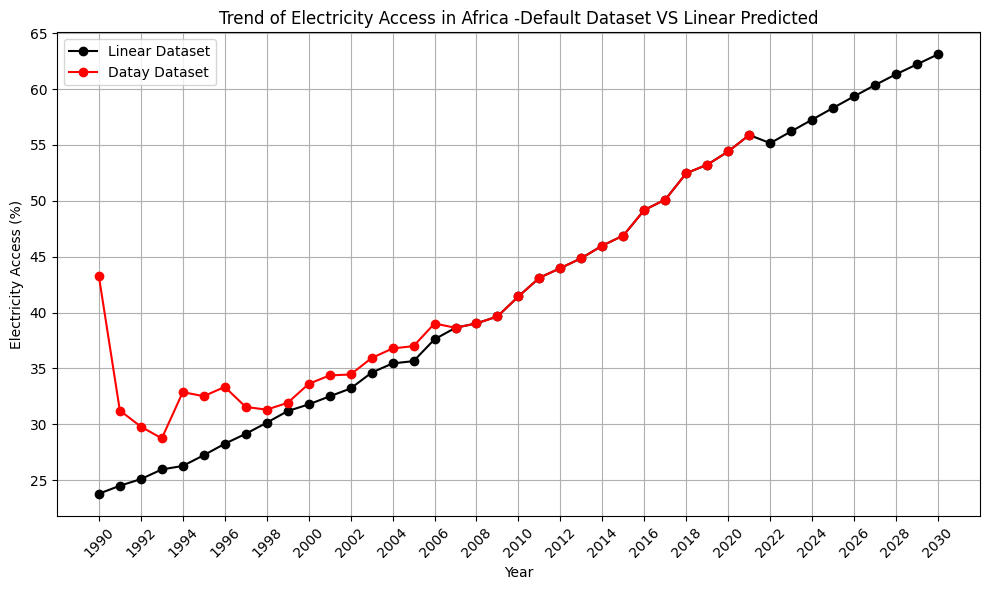

In [ ]:
# Assuming you have the DataFrames linear and datay already defined

# Calculate the mean electricity access column-wise for both DataFrames
mean_electricity_access_linear = linear.iloc[:, 1:].mean(axis=0)
mean_electricity_access_datay = datay.iloc[:, 3:].mean(axis=0)

# Create DataFrames with the mean values and add a column for years
africa_electricity_access_linear = pd.DataFrame(mean_electricity_access_linear, columns=['Electricity Access'])
africa_electricity_access_linear['Year'] = africa_electricity_access_linear.index.astype(int)

africa_electricity_access_datay = pd.DataFrame(mean_electricity_access_datay, columns=['Electricity Access'])
africa_electricity_access_datay['Year'] = africa_electricity_access_datay.index.astype(int)

# Set the 'Year' column as the index for both DataFrames
africa_electricity_access_linear.set_index('Year', inplace=True)
africa_electricity_access_datay.set_index('Year', inplace=True)

# Plot the trends on the same graph with different colors
plt.figure(figsize=(10, 6))
plt.plot(africa_electricity_access_linear.index, africa_electricity_access_linear['Electricity Access'], marker='o', linestyle='-', color='black', label='Linear Dataset')
plt.plot(africa_electricity_access_datay.index, africa_electricity_access_datay['Electricity Access'], marker='o', linestyle='-', color='red', label='Datay Dataset')
plt.title('Trend of Electricity Access in Africa -Default Dataset VS Linear Predicted')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')
plt.grid(True)
plt.xticks(range(1990, 2032, 2), rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


### Lass_Ridge_Linear Hybrid 4 Africa

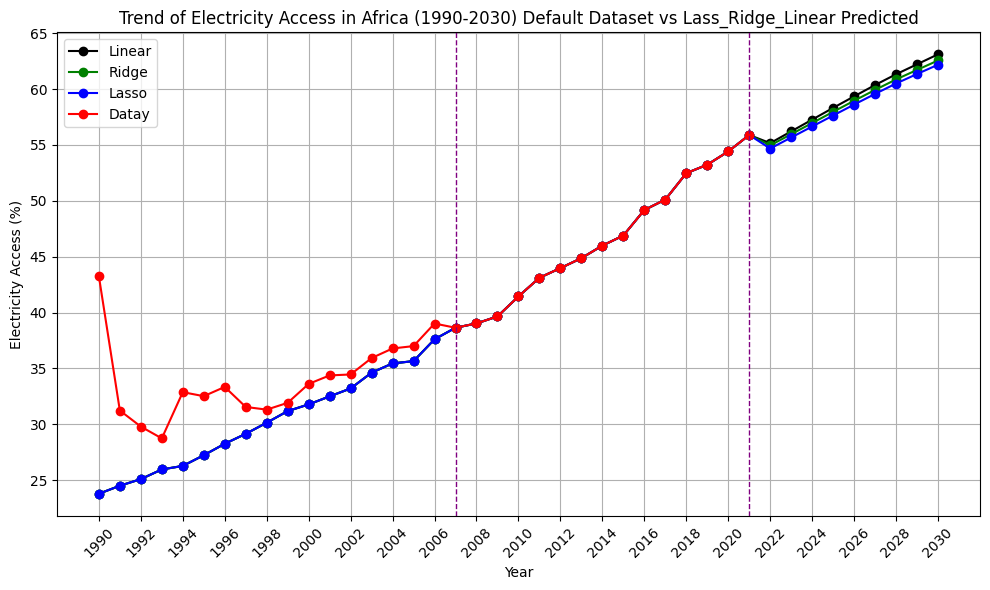

In [ ]:
# Assuming you have the DataFrames for all four datasets defined:
# africa_electricity_access_datay, africa_electricity_access_lass,
# africa_electricity_access_ridge, and africa_electricity_access_linear

# Plot the trends of electricity access for all four datasets on the same graph
plt.figure(figsize=(10, 6))

# Plot Linear dataset
plt.plot(africa_electricity_access_linear.index, africa_electricity_access_linear['Electricity Access'], marker='o', linestyle='-', color='black', label='Linear')

# Plot Ridge dataset
plt.plot(africa_electricity_access_ridge.index, africa_electricity_access_ridge['Electricity Access'], marker='o', linestyle='-', color='green', label='Ridge')

# Plot Lasso dataset
plt.plot(africa_electricity_access_lass.index, africa_electricity_access_lass['Electricity Access'], marker='o', linestyle='-', color='blue', label='Lasso')

# Plot Datay dataset
plt.plot(africa_electricity_access_datay.index, africa_electricity_access_datay['Electricity Access'], marker='o', linestyle='-', color='red', label='Datay')

# Add vertical lines at years 2007 and 2021
plt.axvline(x=2007, color='purple', linestyle='--', linewidth=1)
plt.axvline(x=2021, color='purple', linestyle='--', linewidth=1)


# Customize the plot
plt.title('Trend of Electricity Access in Africa (1990-2030) Default Dataset vs Lass_Ridge_Linear Predicted')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')
plt.grid(True)
plt.xticks(range(1990, 2032, 2), rotation=45)
plt.legend()
plt.tight_layout()

# Show the plot
plt.show()


# Metadata_Lass_Ridge_Linear

## Metadata_Lass

In [ ]:
#Recall metadata
metadata.head(2)

,Country Code,Region,IncomeGroup
Country Name,,,
Africa Western and Central,AFW,Africa Western and Central,Others
Angola,AGO,Sub-Saharan Africa,Lower middle income


In [ ]:
# Drop country code
metadata = metadata.drop('Country Code', axis=1)

In [ ]:
metadata.head(2)

,Region,IncomeGroup
Country Name,,
Africa Western and Central,Africa Western and Central,Others
Angola,Sub-Saharan Africa,Lower middle income


In [ ]:
lass.head(2)

,Country Name,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Africa Western and Central,27.44,28.26,29.07,31.58,32.61,33.61,32.63,32.46,33.46,...,54.22,53.38,54.19,54.99,55.8,56.61,57.41,58.22,59.02,59.83
1,Angola,12.45,13.59,14.72,15.86,16.99,18.13,19.26,20.40,21.54,...,48.22,48.71,49.84,50.97,52.1,53.22,54.35,55.48,56.61,57.74


In [ ]:
# Set index to default
metadata.reset_index(inplace=True)


In [ ]:
metadata.head(2)

,Country Name,Region,IncomeGroup
0,Africa Western and Central,Africa Western and Central,Others
1,Angola,Sub-Saharan Africa,Lower middle income


Meta_lass Merging

In [ ]:
# Merging df Metada and lass
meta_lass = pd.merge(metadata, lass, on='Country Name')

In [ ]:
meta_lass.head(2)

,Country Name,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Africa Western and Central,Africa Western and Central,Others,27.44,28.26,29.07,31.58,32.61,33.61,32.63,...,54.22,53.38,54.19,54.99,55.8,56.61,57.41,58.22,59.02,59.83
1,Angola,Sub-Saharan Africa,Lower middle income,12.45,13.59,14.72,15.86,16.99,18.13,19.26,...,48.22,48.71,49.84,50.97,52.1,53.22,54.35,55.48,56.61,57.74


In [ ]:
# Set meta_lass index to "Country Name"
meta_lass.set_index('Country Name', inplace=True)


In [ ]:
meta_lass.head(2)

,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,1997,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
Country Name,,,,,,,,,,,,,,,,,,,,,
Africa Western and Central,Africa Western and Central,Others,27.44,28.26,29.07,31.58,32.61,33.61,32.63,32.46,...,54.22,53.38,54.19,54.99,55.8,56.61,57.41,58.22,59.02,59.83
Angola,Sub-Saharan Africa,Lower middle income,12.45,13.59,14.72,15.86,16.99,18.13,19.26,20.40,...,48.22,48.71,49.84,50.97,52.1,53.22,54.35,55.48,56.61,57.74


In [ ]:
# Save Meta_lass to CSV
meta_lass.to_csv('meta_lass.csv')

## Metadata_Ridge

In [ ]:
# Recall Ridge
ridge.head(2)

,Country Name,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Africa Western and Central,27.44,28.26,29.07,31.58,32.61,33.61,32.63,32.46,33.46,...,54.22,53.47,54.28,55.09,55.91,56.72,57.53,58.35,59.16,59.97
1,Angola,12.45,13.59,14.72,15.86,16.99,18.13,19.26,20.40,21.54,...,48.22,48.80,49.93,51.07,52.20,53.34,54.47,55.61,56.74,57.88


In [ ]:
#Recall Metadata
metadata.head(2)

,Country Name,Region,IncomeGroup
0,Africa Western and Central,Africa Western and Central,Others
1,Angola,Sub-Saharan Africa,Lower middle income


Merging Metadata & Ridge Dataset

In [ ]:
meta_ridge = pd.merge(metadata, ridge, on='Country Name')

In [ ]:
# Preview Meta_ridge
meta_ridge.head(2)

,Country Name,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Africa Western and Central,Africa Western and Central,Others,27.44,28.26,29.07,31.58,32.61,33.61,32.63,...,54.22,53.47,54.28,55.09,55.91,56.72,57.53,58.35,59.16,59.97
1,Angola,Sub-Saharan Africa,Lower middle income,12.45,13.59,14.72,15.86,16.99,18.13,19.26,...,48.22,48.80,49.93,51.07,52.20,53.34,54.47,55.61,56.74,57.88


In [ ]:
# Set "Country Name" to index on meta_ridge
meta_ridge.set_index('Country Name', inplace=True)

In [ ]:
meta_ridge.head(2)

,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,1997,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
Country Name,,,,,,,,,,,,,,,,,,,,,
Africa Western and Central,Africa Western and Central,Others,27.44,28.26,29.07,31.58,32.61,33.61,32.63,32.46,...,54.22,53.47,54.28,55.09,55.91,56.72,57.53,58.35,59.16,59.97
Angola,Sub-Saharan Africa,Lower middle income,12.45,13.59,14.72,15.86,16.99,18.13,19.26,20.40,...,48.22,48.80,49.93,51.07,52.20,53.34,54.47,55.61,56.74,57.88


In [ ]:
# Save Meta_ridge to csv
meta_ridge.to_csv('meta_ridge.csv')

## Metadata_Linear

In [ ]:
# Preview Linear
linear.head(2)

,Country Name,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Africa Western and Central,27.44,28.26,29.07,31.58,32.61,33.61,32.63,32.46,33.46,...,54.22,53.47,54.28,55.10,55.91,56.72,57.54,58.35,59.16,59.98
1,Angola,12.45,13.59,14.72,15.86,16.99,18.13,19.26,20.40,21.54,...,48.22,48.80,49.93,51.07,52.21,53.34,54.48,55.61,56.75,57.88


In [ ]:
#Preview meatdata
metadata.head(2)

,Country Name,Region,IncomeGroup
0,Africa Western and Central,Africa Western and Central,Others
1,Angola,Sub-Saharan Africa,Lower middle income


Merging Metadat & Linear dataset

In [ ]:
meta_linear = pd.merge(metadata, linear, on='Country Name')

In [ ]:
#Preview meta_linear

meta_linear.head(2)

,Country Name,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Africa Western and Central,Africa Western and Central,Others,27.44,28.26,29.07,31.58,32.61,33.61,32.63,...,54.22,53.47,54.28,55.10,55.91,56.72,57.54,58.35,59.16,59.98
1,Angola,Sub-Saharan Africa,Lower middle income,12.45,13.59,14.72,15.86,16.99,18.13,19.26,...,48.22,48.80,49.93,51.07,52.21,53.34,54.48,55.61,56.75,57.88


In [ ]:
# Set "Country Name" as index
meta_linear.set_index('Country Name', inplace=True)

In [ ]:
#Preview head
meta_linear.head(2)

,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,1997,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
Country Name,,,,,,,,,,,,,,,,,,,,,
Africa Western and Central,Africa Western and Central,Others,27.44,28.26,29.07,31.58,32.61,33.61,32.63,32.46,...,54.22,53.47,54.28,55.10,55.91,56.72,57.54,58.35,59.16,59.98
Angola,Sub-Saharan Africa,Lower middle income,12.45,13.59,14.72,15.86,16.99,18.13,19.26,20.40,...,48.22,48.80,49.93,51.07,52.21,53.34,54.48,55.61,56.75,57.88


In [ ]:
meta_linear.shape

(55, 43)

In [ ]:
# Save as CSV
meta_linear.to_csv('meta_linear.csv')

## Metadata_Lass_Ridge_Linear Fusion

In [ ]:
# Recall Datahead

lass.head(2)

In [ ]:
linear.head(2)

In [ ]:
ridge.head(2)

In [ ]:
#Dropping Country Name
las = lass.drop('Country Name', axis=1)
rig = ridge.drop('Country Name', axis=1)
lin = linear.drop('Country Name', axis=1)

In [ ]:

# Assuming meta_lass, meta_ridge, and meta_linear are your datasets
# For example, if they are numpy arrays:
# meta_lass = np.random.rand(55, 41)
# meta_ridge = np.random.rand(55, 41)
# meta_linear = np.random.rand(55, 41)

# If they are pandas DataFrames:
# meta_lass = pd.DataFrame(np.random.rand(55, 41))
# meta_ridge = pd.DataFrame(np.random.rand(55, 41))
# meta_linear = pd.DataFrame(np.random.rand(55, 41))

# Calculate the average
las_rig_lin = (las + rig + lin) / 3

# If the original datasets are pandas DataFrames, meta_combined will also be a DataFrame
# If the original datasets are numpy arrays, meta_combined will be a numpy array

# To ensure the resulting dataset has the same shape and type as the original ones:
if isinstance(las, pd.DataFrame):
    las_rig_lin = pd.DataFrame(las_rig_lin, columns= las.columns, index=las.index)
else:
    las_rig_lin = np.array(las_rig_lin)

print(round(las_rig_lin, 2).shape)  # Should print (55, 41)


(55, 41)


In [ ]:
#Preview Datahead
las_rig_lin.head(2)

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,27.44,28.26,29.07,31.58,32.61,33.61,32.63,32.46,33.46,34.81,...,54.22,53.44,54.25,55.060000,55.873333,56.683333,57.493333,58.306667,59.113333,59.926667
1,12.45,13.59,14.72,15.86,16.99,18.13,19.26,20.40,21.54,22.67,...,48.22,48.77,49.90,51.036667,52.170000,53.300000,54.433333,55.566667,56.700000,57.833333


In [ ]:
# Round all values to 2 dp

# Round all numerical values to 2 decimal places
las_rig_lin.iloc[:, :] = las_rig_lin.iloc[:, :].round(2)



In [ ]:
las_rig_lin.head(2)

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,27.44,28.26,29.07,31.58,32.61,33.61,32.63,32.46,33.46,34.81,...,54.22,53.44,54.25,55.06,55.87,56.68,57.49,58.31,59.11,59.93
1,12.45,13.59,14.72,15.86,16.99,18.13,19.26,20.40,21.54,22.67,...,48.22,48.77,49.90,51.04,52.17,53.30,54.43,55.57,56.70,57.83


In [ ]:
# Add metadata to las_rig_lin
predicted_data = pd.concat([metadata, las_rig_lin], axis=1)

In [ ]:
# Preview Head
predicted_data.head()


,Country Name,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Africa Western and Central,Africa Western and Central,Others,27.44,28.26,29.07,31.58,32.61,33.61,32.63,...,54.22,53.44,54.25,55.06,55.87,56.68,57.49,58.31,59.11,59.93
1,Angola,Sub-Saharan Africa,Lower middle income,12.45,13.59,14.72,15.86,16.99,18.13,19.26,...,48.22,48.77,49.90,51.04,52.17,53.30,54.43,55.57,56.70,57.83
2,Burundi,Sub-Saharan Africa,Low income,0.00,0.00,0.00,0.00,0.19,0.55,0.91,...,10.23,10.19,10.55,10.90,11.25,11.60,11.95,12.30,12.65,13.00
3,Benin,Sub-Saharan Africa,Lower middle income,11.63,12.61,13.59,14.56,15.54,16.51,14.50,...,41.97,42.83,43.80,44.78,45.75,46.72,47.70,48.67,49.64,50.62
4,Burkina Faso,Sub-Saharan Africa,Low income,4.30,4.77,5.24,6.10,6.13,6.63,7.12,...,18.95,19.28,19.75,20.22,20.68,21.15,21.61,22.08,22.55,23.01


In [ ]:
# Save Predicted data to csv
predicted_data.to_csv('predicted_dataset_mean_lasso_ridge_linear.csv')

## Mean Year by Year

In [ ]:
predicted_data = pd.read_csv("/content/predicted_dataset_mean_lasso_ridge_linear.csv")

In [ ]:
#preview head
predicted_data.head(2)

,Unnamed: 0,Country Name,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,0,Africa Western and Central,Africa Western and Central,Others,27.44,28.26,29.07,31.58,32.61,33.61,...,54.22,53.44,54.25,55.06,55.87,56.68,57.49,58.31,59.11,59.93
1,1,Angola,Sub-Saharan Africa,Lower middle income,12.45,13.59,14.72,15.86,16.99,18.13,...,48.22,48.77,49.90,51.04,52.17,53.30,54.43,55.57,56.70,57.83


In [ ]:
#Drop column
predicted_data = predicted_data.drop('Unnamed: 0', axis=1)

In [ ]:
predicted_data.head(2)

,Country Name,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Africa Western and Central,Africa Western and Central,Others,27.44,28.26,29.07,31.58,32.61,33.61,32.63,...,54.22,53.44,54.25,55.06,55.87,56.68,57.49,58.31,59.11,59.93
1,Angola,Sub-Saharan Africa,Lower middle income,12.45,13.59,14.72,15.86,16.99,18.13,19.26,...,48.22,48.77,49.90,51.04,52.17,53.30,54.43,55.57,56.70,57.83


### Income_Group

In [ ]:
# Groupby income group and drop column, Country Name", "Region"
income_Group = predicted_data.drop(['Country Name', 'Region'], axis=1)


In [ ]:
income_Group.head(2)

,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Others,27.44,28.26,29.07,31.58,32.61,33.61,32.63,32.46,33.46,...,54.22,53.44,54.25,55.06,55.87,56.68,57.49,58.31,59.11,59.93
1,Lower middle income,12.45,13.59,14.72,15.86,16.99,18.13,19.26,20.40,21.54,...,48.22,48.77,49.90,51.04,52.17,53.30,54.43,55.57,56.70,57.83


In [ ]:
income_Group_ymean =  income_Group.groupby('IncomeGroup').mean().round(2)

In [ ]:
income_Group_ymean.head(2)

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
IncomeGroup,,,,,,,,,,,,,,,,,,,,,
High income,91.82,92.08,92.33,92.59,90.00,92.17,92.55,92.00,93.30,93.67,...,100.00,99.91,100.00,100.0,100.0,100.00,100.00,100.00,100.00,100.00
Low income,3.41,3.71,4.17,4.46,4.85,5.62,6.25,6.88,7.66,8.33,...,34.62,33.51,34.61,35.7,36.8,37.89,38.99,40.08,41.18,42.27


In [ ]:
# Save to CSV
income_Group_ymean.to_csv('income_Group_ymean_predicted(1990-2030).csv')

### Region

In [ ]:
# Groupby Region
region_ = predicted_data.drop(['Country Name', 'IncomeGroup'], axis=1)

In [ ]:
region_.head(2)

,Region,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Africa Western and Central,27.44,28.26,29.07,31.58,32.61,33.61,32.63,32.46,33.46,...,54.22,53.44,54.25,55.06,55.87,56.68,57.49,58.31,59.11,59.93
1,Sub-Saharan Africa,12.45,13.59,14.72,15.86,16.99,18.13,19.26,20.40,21.54,...,48.22,48.77,49.90,51.04,52.17,53.30,54.43,55.57,56.70,57.83


In [ ]:
region_ymean = region_.groupby('Region').mean().round(2)

In [ ]:
region_ymean.head(2)

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
Region,,,,,,,,,,,,,,,,,,,,,
Africa Western and Central,27.44,28.26,29.07,31.58,32.61,33.61,32.63,32.46,33.46,34.81,...,54.22,53.44,54.25,55.06,55.87,56.68,57.49,58.31,59.11,59.93
Middle East & North Africa,82.94,83.28,81.20,82.89,82.19,82.19,84.84,84.52,85.08,85.50,...,89.22,87.76,87.58,87.41,87.24,87.06,86.88,86.70,86.52,86.34


In [ ]:
#Save to CSV
region_ymean.to_csv('region_ymean_predicted(1990-2030).csv')

## Prediction by Country

In [ ]:
predicted_data.head(2)

,Country Name,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Africa Western and Central,Africa Western and Central,Others,27.44,28.26,29.07,31.58,32.61,33.61,32.63,...,54.22,53.44,54.25,55.06,55.87,56.68,57.49,58.31,59.11,59.93
1,Angola,Sub-Saharan Africa,Lower middle income,12.45,13.59,14.72,15.86,16.99,18.13,19.26,...,48.22,48.77,49.90,51.04,52.17,53.30,54.43,55.57,56.70,57.83


### Nigeria

In [ ]:
# Assuming your Dataset is "predicted_data"
# Filter the DataFrame to include only Nigeria
nija = predicted_data[predicted_data["Country Name"] == 'Nigeria']

In [ ]:
nija.head(2)

,Country Name,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
36,Nigeria,Sub-Saharan Africa,Lower middle income,27.3,35.23,36.1,36.96,37.83,38.69,39.55,...,59.5,60.62,61.43,62.24,63.05,63.86,64.67,65.48,66.28,67.09


In [ ]:
# Drop columns
nija = nija.drop(['Country Name', 'Region', 'IncomeGroup'], axis=1)

In [ ]:
nija.head(2)

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
36,27.3,35.23,36.1,36.96,37.83,38.69,39.55,40.4,41.25,44.9,...,59.5,60.62,61.43,62.24,63.05,63.86,64.67,65.48,66.28,67.09


In [ ]:
nija.columns

Index(['1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998',
       '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007',
       '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016',
       '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024', '2025',
       '2026', '2027', '2028', '2029', '2030'],
      dtype='object')

In [ ]:
# Plint values in each Column
for col in nija.columns:
    print(f"{col}: {nija[col].unique()}")

1990: [27.3]
1991: [35.23]
1992: [36.1]
1993: [36.96]
1994: [37.83]
1995: [38.69]
1996: [39.55]
1997: [40.4]
1998: [41.25]
1999: [44.9]
2000: [43.18]
2001: [43.91]
2002: [44.63]
2003: [52.2]
2004: [46.08]
2005: [46.82]
2006: [47.58]
2007: [50.13]
2008: [50.3]
2009: [49.97]
2010: [48.]
2011: [55.9]
2012: [53.02]
2013: [55.6]
2014: [54.15]
2015: [52.5]
2016: [59.3]
2017: [54.4]
2018: [56.5]
2019: [55.4]
2020: [55.4]
2021: [59.5]
2022: [60.62]
2023: [61.43]
2024: [62.24]
2025: [63.05]
2026: [63.86]
2027: [64.67]
2028: [65.48]
2029: [66.28]
2030: [67.09]


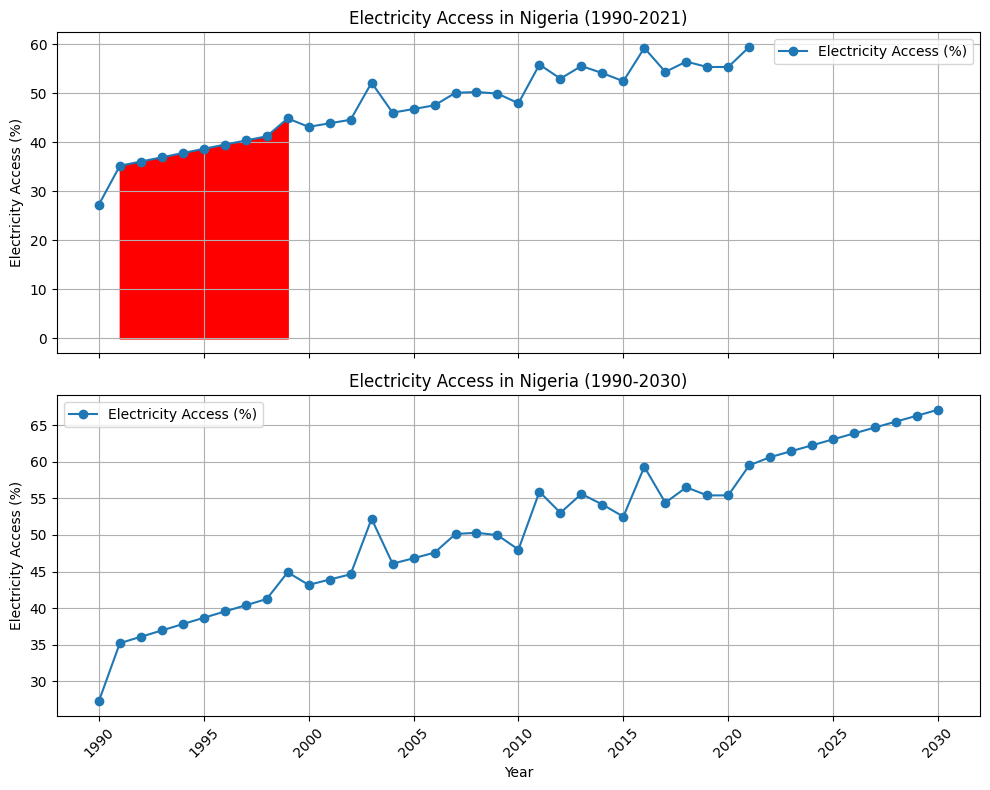

In [ ]:
# Provided data for Nigeria's electricity access from 1990 to 2030
data = {
    'Year': list(range(1990, 2031)),
    'Electricity Access (%)': [
        27.3, 35.23, 36.1, 36.96, 37.83, 38.69, 39.55, 40.4, 41.25, 44.9,
        43.18, 43.91, 44.63, 52.2, 46.08, 46.82, 47.58, 50.13, 50.3, 49.97,
        48.0, 55.9, 53.02, 55.6, 54.15, 52.5, 59.3, 54.4, 56.5, 55.4, 55.4,
        59.5, 60.62, 61.43, 62.24, 63.05, 63.86, 64.67, 65.48, 66.28, 67.09
    ]
}

# Data
years = list(range(1990, 2022))
nigeria = [27.30, 35.23, 36.10, 36.96, 37.83, 38.69, 39.55, 40.40, 41.25,
           44.90, 43.18, 43.91, 44.63, 52.20, 46.08, 46.82, 47.58, 50.13,
           50.30, 49.97, 48.00, 55.90, 53.02, 55.60, 54.15, 52.50, 59.30,
           54.40, 56.50, 55.40, 55.40, 59.50]

# Create subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Plot the data for 1990-2021 on the first subplot
ax1.plot(years, nigeria, marker='o', linestyle='-', label='Electricity Access (%)')
ax1.fill_between(years[shade_start:shade_end+1], nigeria[shade_start:shade_end+1], color='r')
ax1.set_title('Electricity Access in Nigeria (1990-2021)')
ax1.set_ylabel('Electricity Access (%)')
ax1.legend()
ax1.grid(True)

# Plot the data for 1990-2030 on the second subplot
ax2.plot(data['Year'], data['Electricity Access (%)'], marker='o', linestyle='-', label='Electricity Access (%)')
ax2.set_title('Electricity Access in Nigeria (1990-2030)')
ax2.set_xlabel('Year')
ax2.set_ylabel('Electricity Access (%)')
ax2.legend()
ax2.grid(True)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Training set evaluation:
Mean Absolute Error (MAE): 1.21
Mean Squared Error (MSE): 4.01
Root Mean Squared Error (RMSE): 2.00
R-squared (R²): 0.96

Test set evaluation:
Mean Absolute Error (MAE): 1.55
Mean Squared Error (MSE): 7.36
Root Mean Squared Error (RMSE): 2.71
R-squared (R²): 0.91


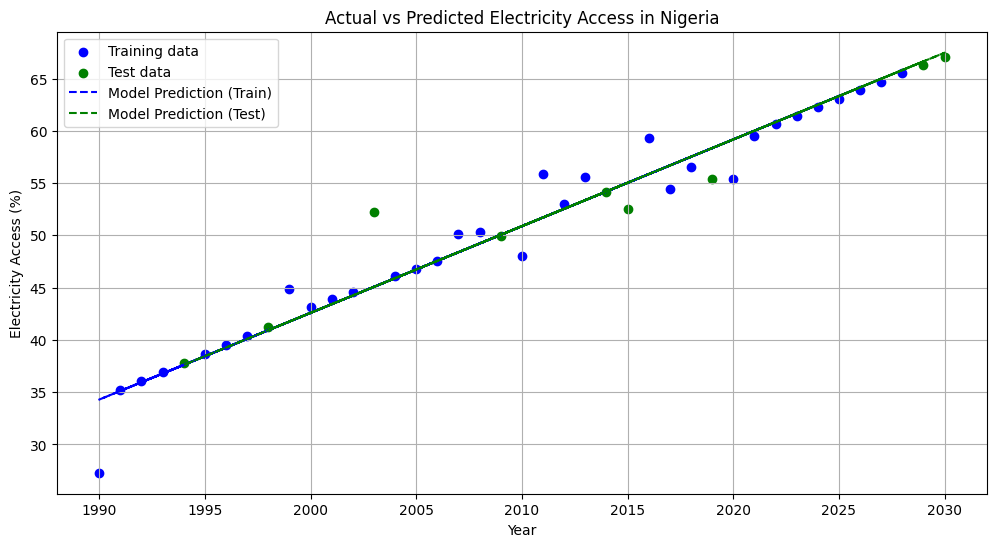

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Provided data for Nigeria's electricity access from 1990 to 2030
data = {
    'Year': list(range(1990, 2031)),
    'Electricity Access (%)': [
        27.3, 35.23, 36.1, 36.96, 37.83, 38.69, 39.55, 40.4, 41.25, 44.9,
        43.18, 43.91, 44.63, 52.2, 46.08, 46.82, 47.58, 50.13, 50.3, 49.97,
        48.0, 55.9, 53.02, 55.6, 54.15, 52.5, 59.3, 54.4, 56.5, 55.4, 55.4,
        59.5, 60.62, 61.43, 62.24, 63.05, 63.86, 64.67, 65.48, 66.28, 67.09
    ]
}

# Create DataFrame
nigeria_data = pd.DataFrame(data)

# Split the data into training and test sets
X = nigeria_data[['Year']].values
y = nigeria_data['Electricity Access (%)'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Calculate evaluation metrics for training set
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

# Calculate evaluation metrics for test set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

# Print evaluation metrics
print("Training set evaluation:")
print(f"Mean Absolute Error (MAE): {train_mae:.2f}")
print(f"Mean Squared Error (MSE): {train_mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {train_rmse:.2f}")
print(f"R-squared (R²): {train_r2:.2f}")

print("\nTest set evaluation:")
print(f"Mean Absolute Error (MAE): {test_mae:.2f}")
print(f"Mean Squared Error (MSE): {test_mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {test_rmse:.2f}")
print(f"R-squared (R²): {test_r2:.2f}")

# Plot actual vs predicted values
plt.figure(figsize=(12, 6))
plt.scatter(X_train, y_train, color='blue', label='Training data')
plt.scatter(X_test, y_test, color='green', label='Test data')
plt.plot(X_train, y_train_pred, color='blue', linestyle='--', label='Model Prediction (Train)')
plt.plot(X_test, y_test_pred, color='green', linestyle='--', label='Model Prediction (Test)')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')
plt.title('Actual vs Predicted Electricity Access in Nigeria')
plt.legend()
plt.grid(True)
plt.show()


### Nigeria Regression

              Year  Electricity Access (%)
count    41.000000               41.000000
mean   2010.000000               50.912195
std      11.979149                9.947721
min    1990.000000               27.300000
25%    2000.000000               43.910000
50%    2010.000000               52.200000
75%    2020.000000               59.300000
max    2030.000000               67.090000
Overall Growth from 1990 to 2030: 145.75%
    Year  Yearly Growth Rate (%)
0   1990                     NaN
1   1991               29.047619
2   1992                2.469486
3   1993                2.382271
4   1994                2.353896
5   1995                2.273328
6   1996                2.222797
7   1997                2.149178
8   1998                2.103960
9   1999                8.848485
10  2000               -3.830735
11  2001                1.690597
12  2002                1.639718
13  2003               16.961685
14  2004              -11.724138
15  2005                1.605903
16  2006  

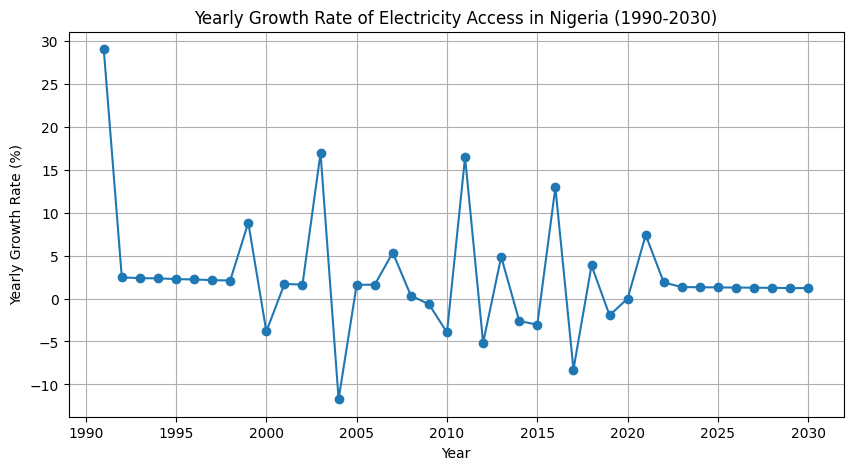

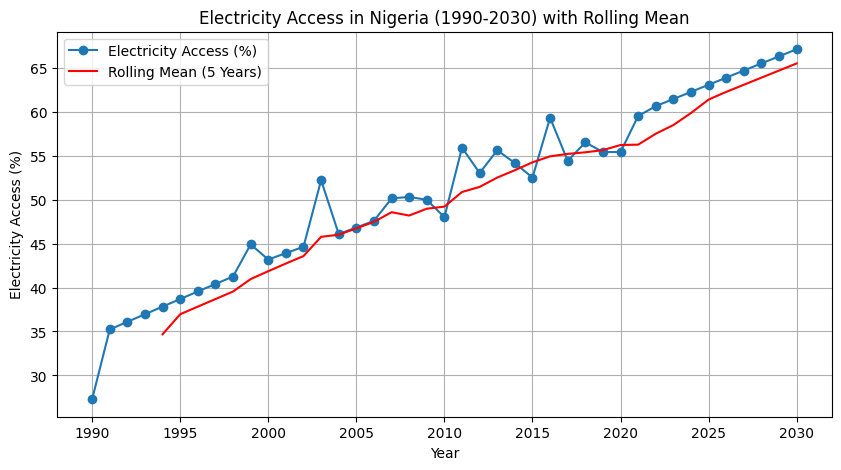

Training set evaluation:
Mean Absolute Error (MAE): 1.21
Mean Squared Error (MSE): 4.01
Root Mean Squared Error (RMSE): 2.00
R-squared (R²): 0.96

Test set evaluation:
Mean Absolute Error (MAE): 1.55
Mean Squared Error (MSE): 7.36
Root Mean Squared Error (RMSE): 2.71
R-squared (R²): 0.91


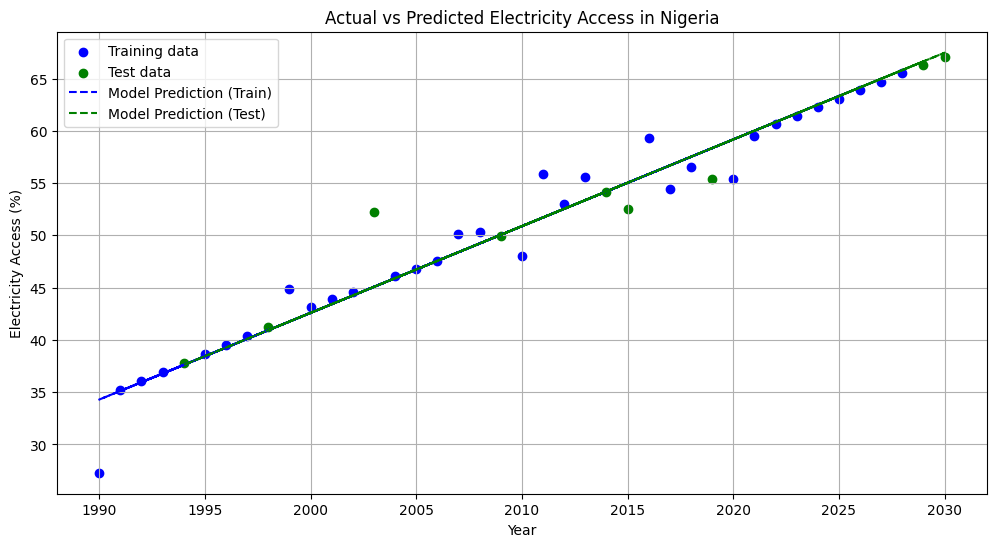

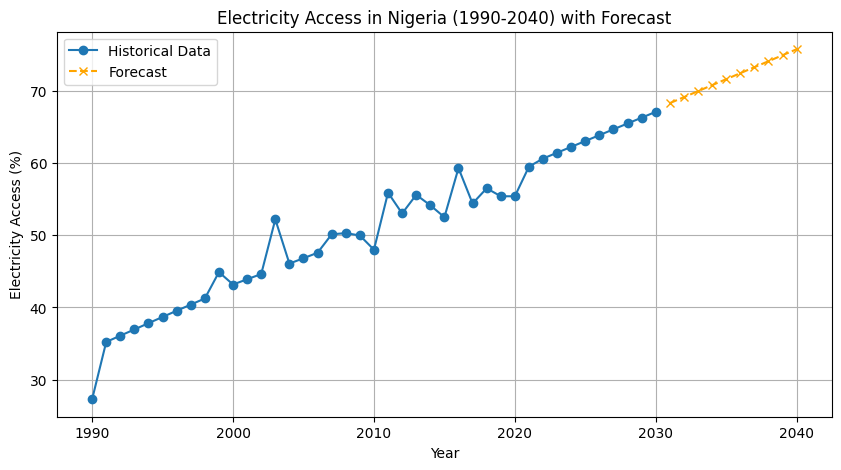

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Provided data for Nigeria's electricity access from 1990 to 2030
data = {
    'Year': list(range(1990, 2031)),
    'Electricity Access (%)': [
        27.3, 35.23, 36.1, 36.96, 37.83, 38.69, 39.55, 40.4, 41.25, 44.9,
        43.18, 43.91, 44.63, 52.2, 46.08, 46.82, 47.58, 50.13, 50.3, 49.97,
        48.0, 55.9, 53.02, 55.6, 54.15, 52.5, 59.3, 54.4, 56.5, 55.4, 55.4,
        59.5, 60.62, 61.43, 62.24, 63.05, 63.86, 64.67, 65.48, 66.28, 67.09
    ]
}

# Create DataFrame
nigeria_data = pd.DataFrame(data)

# Descriptive statistics
print(nigeria_data.describe())

# Calculate overall growth
overall_growth = ((nigeria_data['Electricity Access (%)'].iloc[-1] - nigeria_data['Electricity Access (%)'].iloc[0]) / nigeria_data['Electricity Access (%)'].iloc[0]) * 100
print(f'Overall Growth from 1990 to 2030: {overall_growth:.2f}%')

# Yearly growth rate
nigeria_data['Yearly Growth Rate (%)'] = nigeria_data['Electricity Access (%)'].pct_change() * 100
print(nigeria_data[['Year', 'Yearly Growth Rate (%)']])

# Plot yearly growth rate
plt.figure(figsize=(10, 5))
plt.plot(nigeria_data['Year'], nigeria_data['Yearly Growth Rate (%)'], marker='o', linestyle='-')
plt.title('Yearly Growth Rate of Electricity Access in Nigeria (1990-2030)')
plt.xlabel('Year')
plt.ylabel('Yearly Growth Rate (%)')
plt.grid(True)
plt.show()

# Rolling mean
nigeria_data['Rolling Mean (5 Years)'] = nigeria_data['Electricity Access (%)'].rolling(window=5).mean()

# Plot rolling mean
plt.figure(figsize=(10, 5))
plt.plot(nigeria_data['Year'], nigeria_data['Electricity Access (%)'], marker='o', label='Electricity Access (%)')
plt.plot(nigeria_data['Year'], nigeria_data['Rolling Mean (5 Years)'], color='red', label='Rolling Mean (5 Years)')
plt.title('Electricity Access in Nigeria (1990-2030) with Rolling Mean')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')
plt.legend()
plt.grid(True)
plt.show()

# Split the data into training and test sets
X = nigeria_data[['Year']].values
y = nigeria_data['Electricity Access (%)'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Calculate evaluation metrics for training set
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

# Calculate evaluation metrics for test set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

# Print evaluation metrics
print("Training set evaluation:")
print(f"Mean Absolute Error (MAE): {train_mae:.2f}")
print(f"Mean Squared Error (MSE): {train_mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {train_rmse:.2f}")
print(f"R-squared (R²): {train_r2:.2f}")

print("\nTest set evaluation:")
print(f"Mean Absolute Error (MAE): {test_mae:.2f}")
print(f"Mean Squared Error (MSE): {test_mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {test_rmse:.2f}")
print(f"R-squared (R²): {test_r2:.2f}")

# Plot actual vs predicted values
plt.figure(figsize=(12, 6))
plt.scatter(X_train, y_train, color='blue', label='Training data')
plt.scatter(X_test, y_test, color='green', label='Test data')
plt.plot(X_train, y_train_pred, color='blue', linestyle='--', label='Model Prediction (Train)')
plt.plot(X_test, y_test_pred, color='green', linestyle='--', label='Model Prediction (Test)')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')
plt.title('Actual vs Predicted Electricity Access in Nigeria')
plt.legend()
plt.grid(True)
plt.show()

# Forecast for the next 10 years
future_years = np.array(list(range(2031, 2041))).reshape(-1, 1)
forecast = model.predict(future_years)

# Plot forecast
plt.figure(figsize=(10, 5))
plt.plot(nigeria_data['Year'], nigeria_data['Electricity Access (%)'], marker='o', label='Historical Data')
plt.plot(range(2031, 2041), forecast, marker='x', linestyle='--', color='orange', label='Forecast')
plt.title('Electricity Access in Nigeria (1990-2040) with Forecast')
plt.xlabel('Year')
plt.ylabel('Electricity Access (%)')
plt.legend()
plt.grid(True)
plt.show()


### Libya

In [ ]:
# Assuming your Dataset is "predicted_data"
# Filter the DataFrame to include only Libya
libya_data = predicted_data[predicted_data["Country Name"] == 'Libya']

In [ ]:
libya_data.head(2)

,Country Name,Region,IncomeGroup,1990,1991,1992,1993,1994,1995,1996,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
25,Libya,Middle East & North Africa,Upper middle income,100.0,100.0,100.0,100.0,100.0,100.0,100.0,...,70.21,64.7,63.3,61.9,60.5,59.1,57.7,56.3,54.9,53.5


In [ ]:
#drop columns
libya_data = libya_data.drop(['Country Name', 'Region', 'IncomeGroup'], axis=1)

In [ ]:
libya_data.head(2)

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
25,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,99.43,...,70.21,64.7,63.3,61.9,60.5,59.1,57.7,56.3,54.9,53.5


In [ ]:
libya_data.columns# Plint values in each Column

Index(['1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998',
       '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007',
       '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016',
       '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024', '2025',
       '2026', '2027', '2028', '2029', '2030'],
      dtype='object')

In [ ]:
# Plint values in each Column
for col in nija.columns:
    print(f"{col}: {libya_data[col].unique()}")

1990: [100.]
1991: [100.]
1992: [100.]
1993: [100.]
1994: [100.]
1995: [100.]
1996: [100.]
1997: [100.]
1998: [100.]
1999: [99.43]
2000: [99.8]
2001: [96.95]
2002: [95.23]
2003: [93.52]
2004: [91.81]
2005: [90.11]
2006: [88.43]
2007: [86.78]
2008: [85.14]
2009: [83.51]
2010: [81.9]
2011: [80.29]
2012: [78.68]
2013: [77.07]
2014: [75.45]
2015: [73.83]
2016: [72.21]
2017: [70.58]
2018: [67.]
2019: [68.47]
2020: [69.37]
2021: [70.21]
2022: [64.7]
2023: [63.3]
2024: [61.9]
2025: [60.5]
2026: [59.1]
2027: [57.7]
2028: [56.3]
2029: [54.9]
2030: [53.5]


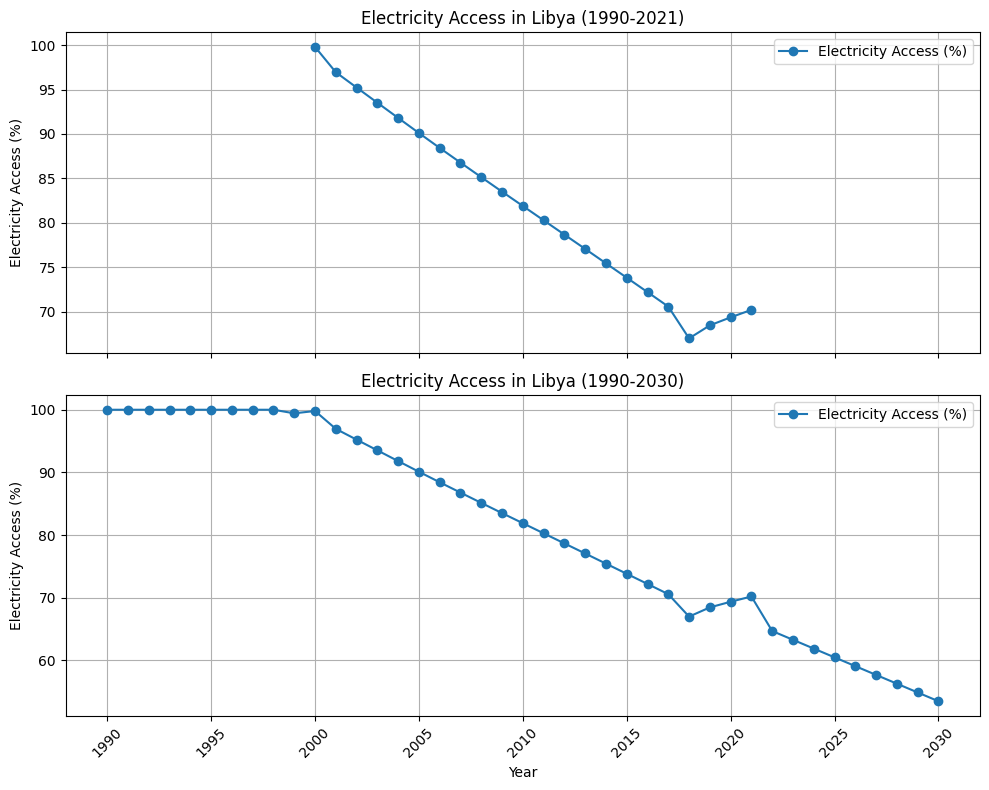

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Provided data for Libya's electricity access from 1990 to 2030
libya_data = {
    'Year': list(range(1990, 2031)),
    'Electricity Access (%)': [
        100., 100., 100., 100., 100., 100., 100., 100., 100., 99.43,
        99.8, 96.95, 95.23, 93.52, 91.81, 90.11, 88.43, 86.78, 85.14, 83.51,
        81.9, 80.29, 78.68, 77.07, 75.45, 73.83, 72.21, 70.58, 67., 68.47,
        69.37, 70.21, 64.7, 63.3, 61.9, 60.5, 59.1, 57.7, 56.3, 54.9, 53.5
    ]
}

# Data for Libya
years = list(range(1990, 2022))
libyan_data = {
    1990: [None], 1991: [None], 1992: [None], 1993: [None], 1994: [None], 1995: [None], 1996: [None],
    1997: [None], 1998: [None], 1999: [None], 2000: [99.8], 2001: [96.95], 2002: [95.23], 2003: [93.52],
    2004: [91.81], 2005: [90.11], 2006: [88.43], 2007: [86.78], 2008: [85.14], 2009: [83.51], 2010: [81.9],
    2011: [80.29], 2012: [78.68], 2013: [77.07], 2014: [75.45], 2015: [73.83], 2016: [72.21], 2017: [70.58],
    2018: [67.], 2019: [68.47], 2020: [69.37], 2021: [70.21]
}

# Create subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Plot the data for 1990-2021 on the first subplot
ax1.plot(years, libyan_data.values(), marker='o', linestyle='-', label='Electricity Access (%)')
ax1.set_title('Electricity Access in Libya (1990-2021)')
ax1.set_ylabel('Electricity Access (%)')
ax1.legend()
ax1.grid(True)

# Plot the data for 1990-2030 on the second subplot
ax2.plot(libya_data['Year'], libya_data['Electricity Access (%)'], marker='o', linestyle='-', label='Electricity Access (%)')
ax2.set_title('Electricity Access in Libya (1990-2030)')
ax2.set_xlabel('Year')
ax2.set_ylabel('Electricity Access (%)')
ax2.legend()
ax2.grid(True)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# XXXXXXX

## Distribution By IncomeGroup

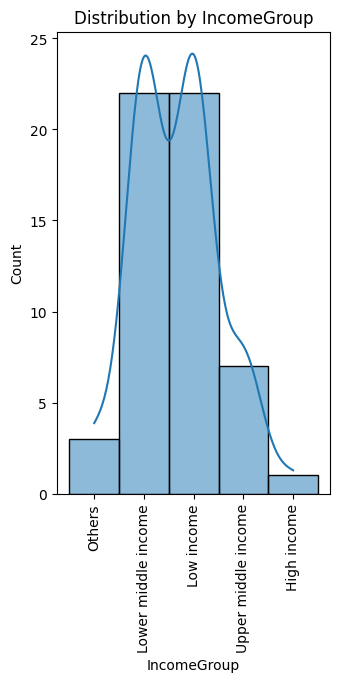

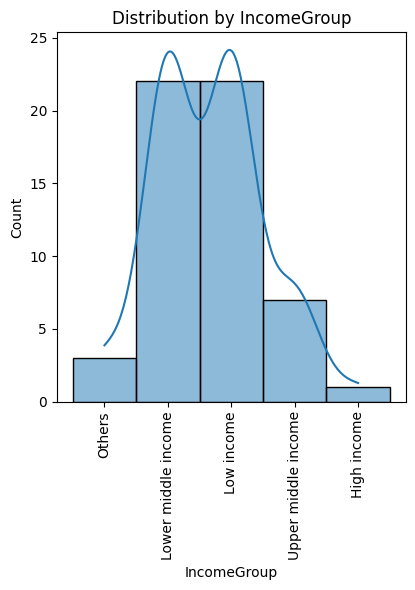

In [ ]:
# Step 2: Visualization of Distributions
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
sns.histplot(data=predicted_data["IncomeGroup"], kde=True)
plt.title("Distribution by IncomeGroup")
plt.xticks(rotation=90)

# Step 2: Visualization of Distributions
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 2)
sns.histplot(data=datay["IncomeGroup"], kde=True)
plt.title("Distribution by IncomeGroup")
plt.xticks(rotation=90)

plt.tight_layout()

## Distribution By Region

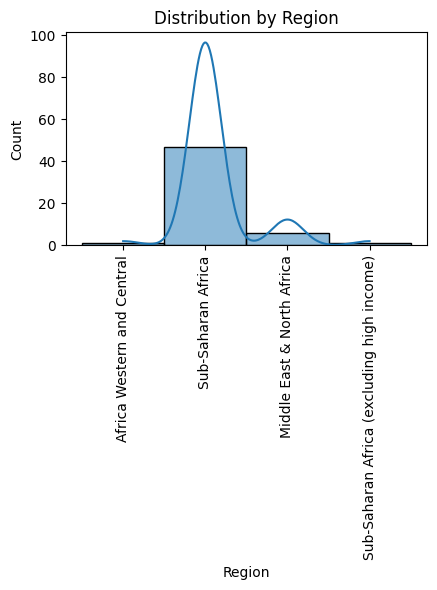

In [ ]:
# Step 2: Visualization of Distributions
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
sns.histplot(data=predicted_data["Region"], kde=True)
plt.title('Distribution by Region')
plt.xticks(rotation=90)



plt.tight_layout()

# Objectives

## Objective 1

Analyze historical trends in electricity access across African countries relative to region and income.

### Prepare & Clean Dataset

In [ ]:
# Ensure the dataset columns are correct and clean
predicted_data.columns = predicted_data.columns.str.strip()
predicted_data['Region'] = predicted_data['Region'].str.strip()
predicted_data['IncomeGroup'] = predicted_data['IncomeGroup'].str.strip()

# Convert years to integers for easier manipulation
year_columns = [str(year) for year in range(1990, 2031)]
predicted_data[year_columns] = predicted_data[year_columns].apply(pd.to_numeric, errors='coerce')


### Aggregate Data by IncomeGroup

In [ ]:
# Aggregate by income group
income_data = predicted_data.groupby('IncomeGroup')[year_columns].mean()

# Display the aggregated data
print(income_data)


                          1990       1991       1992       1993       1994  \
IncomeGroup                                                                  
High income          91.820000  92.080000  92.330000  92.590000  90.000000   
Low income            3.411364   3.708636   4.169545   4.461364   4.851818   
Lower middle income  29.717273  30.684091  31.511364  32.965909  33.076818   
Others               21.150000  22.040000  22.926667  24.376667  25.333333   
Upper middle income  60.621429  61.854286  62.047143  62.705714  63.557143   

                          1995       1996       1997       1998       1999  \
IncomeGroup                                                                  
High income          92.170000  92.550000  92.000000  93.300000  93.670000   
Low income            5.618182   6.250000   6.879545   7.665000   8.333182   
Lower middle income  34.248636  35.953636  36.863636  38.462727  39.720455   
Others               26.280000  29.800000  29.663333  30.136667

### IncomeGroup Visual

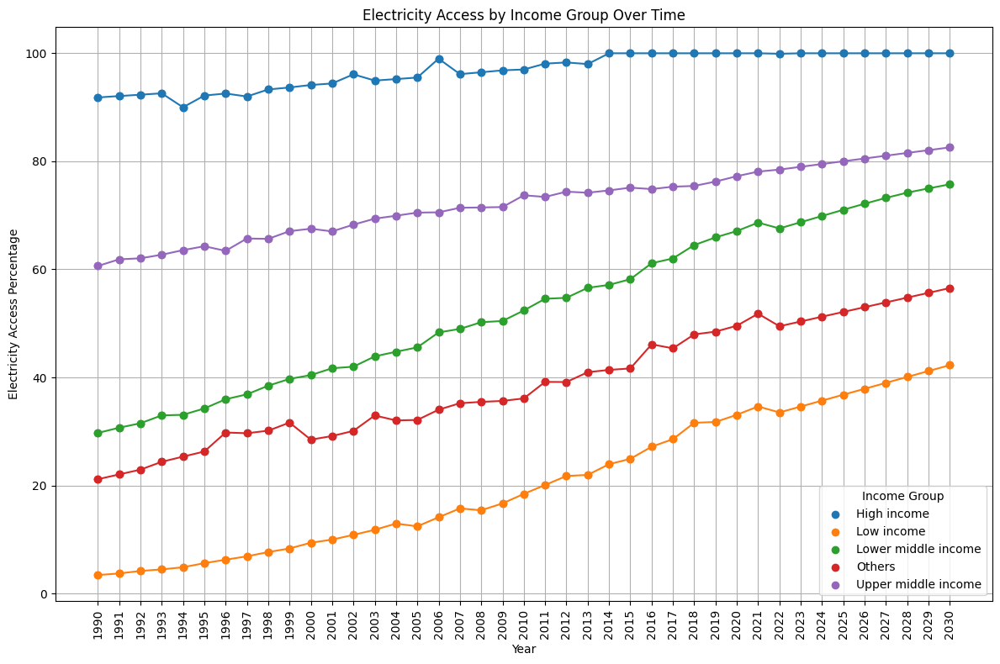

In [ ]:
# Convert years to integers for easier manipulation
year_columns = [str(year) for year in range(1990, 2031)]
predicted_data[year_columns] = predicted_data[year_columns].apply(pd.to_numeric, errors='coerce')

# Prepare the data for plotting
income_data = predicted_data.groupby('IncomeGroup')[year_columns].mean().T

# Plot the grouped scatter plot
plt.figure(figsize=(12, 8))
for income_group in income_data.columns:
    plt.scatter(income_data.index, income_data[income_group], label=income_group)

    # Connect the points with a line
    plt.plot(income_data.index, income_data[income_group], linestyle='-', marker='o')

plt.title('Electricity Access by Income Group Over Time')
plt.xlabel('Year')
plt.xticks(rotation=90)
plt.ylabel('Electricity Access Percentage')
plt.legend(title='Income Group')
plt.grid(True)
plt.tight_layout()
plt.show()


### Aggregate Data by Region

In [ ]:
# Aggregate by Region
region_data = predicted_data.groupby('Region')[year_columns].mean()

# Display the aggregated data
print(region_data)

                                                 1990       1991       1992  \
Region                                                                        
Africa Western and Central                  27.440000  28.260000  29.070000   
Middle East & North Africa                  82.938333  83.278333  81.195000   
Sub-Saharan Africa                          16.284681  17.041915  17.964468   
Sub-Saharan Africa (excluding high income)  18.000000  18.920000  19.850000   

                                                 1993       1994       1995  \
Region                                                                        
Africa Western and Central                  31.580000  32.610000  33.610000   
Middle East & North Africa                  82.886667  82.193333  82.191667   
Sub-Saharan Africa                          18.689149  19.103617  20.184255   
Sub-Saharan Africa (excluding high income)  20.770000  21.690000  22.610000   

                                                 1

### Region Visual

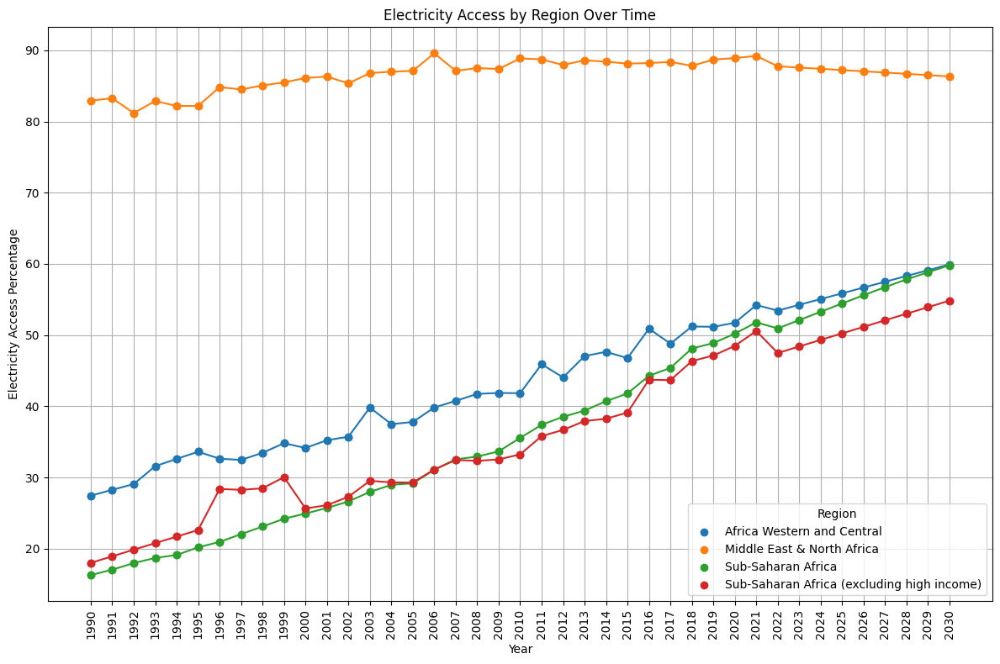

In [ ]:
# Convert years to integers for easier manipulation
year_columns = [str(year) for year in range(1990, 2031)]
predicted_data[year_columns] = predicted_data[year_columns].apply(pd.to_numeric, errors='coerce')

# Prepare the data for plotting
region_data = predicted_data.groupby('Region')[year_columns].mean().T

# Plot the grouped scatter plot
plt.figure(figsize=(12, 8))
for region_group in region_data.columns:
    plt.scatter(region_data.index, region_data[region_group], label=region_group)

    # Connect the points with a line
    plt.plot(region_data.index, region_data[region_group], linestyle='-', marker='o')

plt.title('Electricity Access by Region Over Time')
plt.xlabel('Year')
plt.xticks(rotation=90)
plt.ylabel('Electricity Access Percentage')
plt.legend(title='Region')
plt.grid(True)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



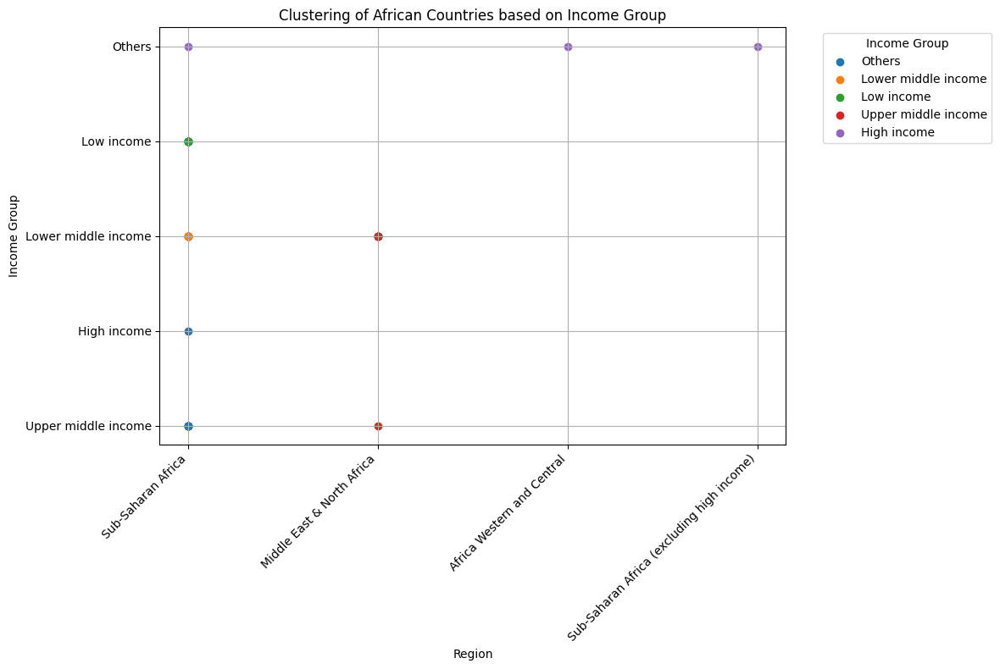

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Ensure the dataset columns are correct and clean
predicted_data.columns = predicted_data.columns.str.strip()

# Select the relevant columns for clustering (IncomeGroup and Region)
clustering_columns = ['IncomeGroup', 'Region']
cluster_data = predicted_data[clustering_columns]

# One-hot encode categorical variables
cluster_data_encoded = pd.get_dummies(cluster_data)

# Initialize the KMeans model with desired number of clusters
num_clusters = 5  # You can adjust this number based on your analysis
kmeans = KMeans(n_clusters=num_clusters, random_state=42)

# Fit the KMeans model to the data
kmeans.fit(cluster_data_encoded)

# Get the cluster labels for each data point
cluster_labels = kmeans.labels_

# Add cluster labels to the original dataset
predicted_data['Cluster'] = cluster_labels

# Define a mapping between cluster label and income group and region
cluster_info = {}
for cluster_label in range(num_clusters):
    cluster_data = predicted_data[predicted_data['Cluster'] == cluster_label]
    income_groups = cluster_data['IncomeGroup'].unique()
    regions = cluster_data['Region'].unique()
    cluster_info[cluster_label] = {'IncomeGroup': income_groups[0], 'Region': regions[0]}

# Define unique income groups
unique_income_groups = predicted_data['IncomeGroup'].unique()

# Visualize the clusters
plt.figure(figsize=(12, 8))
for cluster_label in range(num_clusters):
    cluster_data = predicted_data[predicted_data['Cluster'] == cluster_label]
    income_group_label = cluster_info[cluster_label]['IncomeGroup']
    plt.scatter(cluster_data['Region'], cluster_data['IncomeGroup'], label=f'Cluster {cluster_label}, {income_group_label}')

plt.title('Clustering of African Countries based on Income Group')
plt.xlabel('Region')
plt.ylabel('Income Group')
plt.grid(True)
plt.xticks(rotation=45, ha='right')
# Adjust legend parameters for better readability
legend_location = 'upper left'
legend_bbox = (1.05, 1)
plt.legend(title='Income Group', labels=unique_income_groups, bbox_to_anchor=legend_bbox, loc=legend_location)
plt.tight_layout()
plt.show()


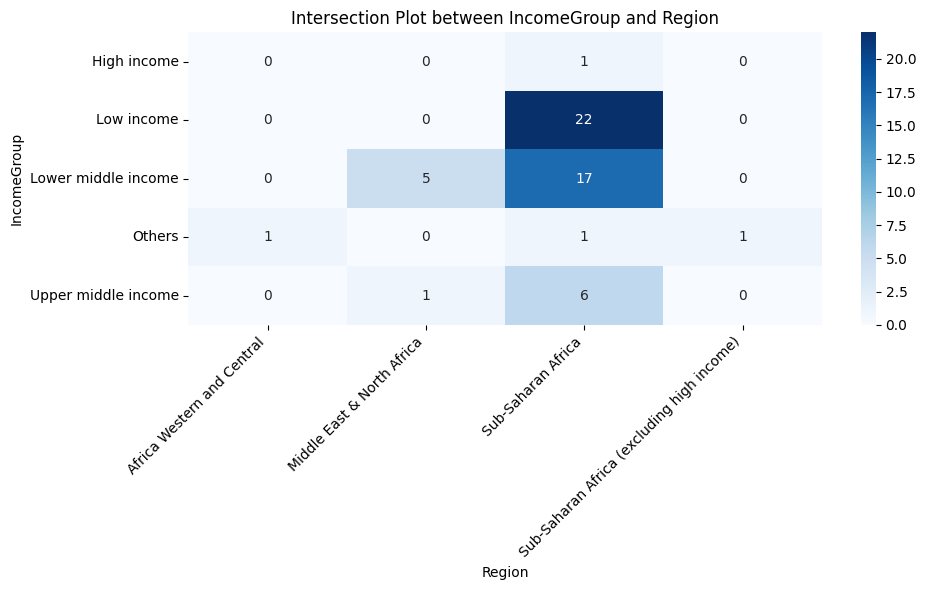

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure the dataset columns are correct and clean
predicted_data.columns = predicted_data.columns.str.strip()

# Create a pivot table to count occurrences of each combination of 'IncomeGroup' and 'Region'
pivot_table = predicted_data.pivot_table(index='IncomeGroup', columns='Region', aggfunc='size', fill_value=0)

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap='Blues', fmt='g')
plt.title('Intersection Plot between IncomeGroup and Region')
plt.xlabel('Region')
plt.ylabel('IncomeGroup')
plt.yticks(rotation=0)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


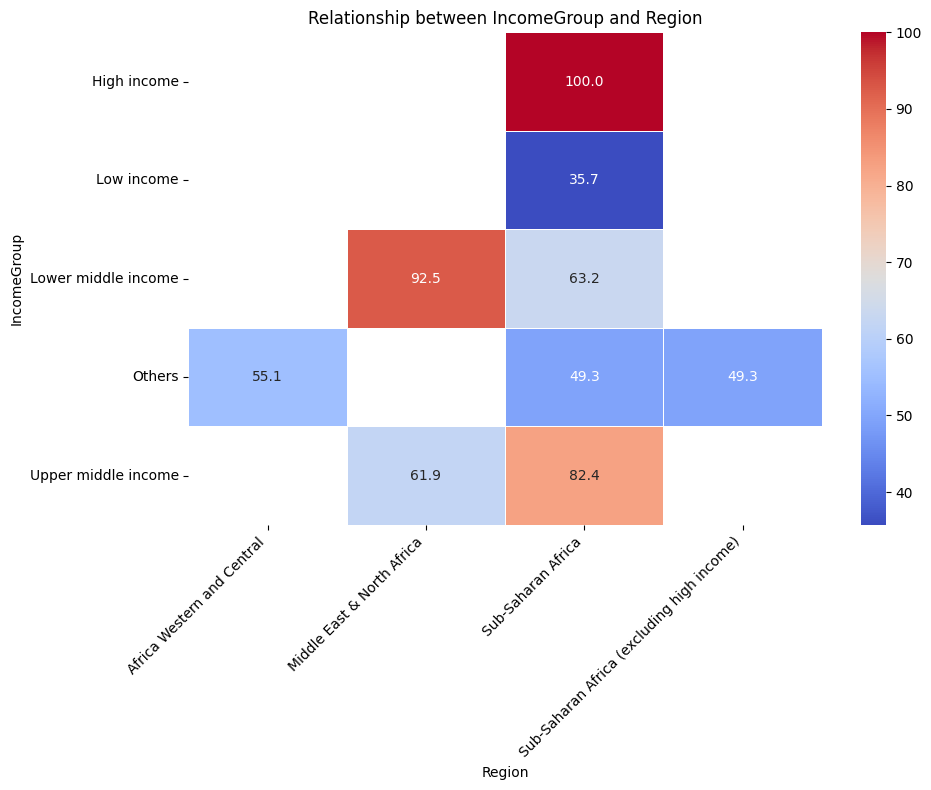

In [ ]:
# Ensure the dataset columns are correct and clean
predicted_data.columns = predicted_data.columns.str.strip()

# Pivot the data to calculate the average electricity access percentage for each combination of IncomeGroup and Region
pivot_table = predicted_data.pivot_table(index='IncomeGroup', columns='Region', values='2024', aggfunc='mean')

# Plot the heatmap with a different color scheme (coolwarm)
plt.figure(figsize=(10, 8))
sns.heatmap(pivot_table, cmap='coolwarm', annot=True, fmt='.1f', linewidths=.5)
plt.title('Relationship between IncomeGroup and Region')
plt.xlabel('Region')
plt.ylabel('IncomeGroup')
plt.yticks(rotation=0)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


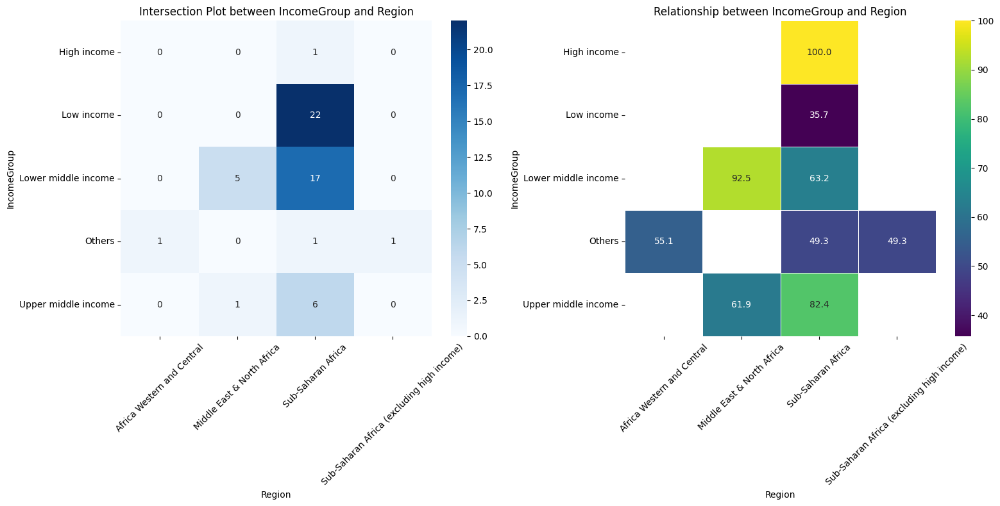

In [ ]:
# Create a pivot table to count occurrences of each combination of 'IncomeGroup' and 'Region'
pivot_table_count = predicted_data.pivot_table(index='IncomeGroup', columns='Region', aggfunc='size', fill_value=0)

# Pivot the data to calculate the average electricity access percentage for each combination of IncomeGroup and Region
pivot_table_avg = predicted_data.pivot_table(index='IncomeGroup', columns='Region', values='2024', aggfunc='mean')

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot the count heatmap
sns.heatmap(pivot_table_count, ax=axes[0], cmap='Blues', annot=True, fmt='g')
axes[0].set_title('Intersection Plot between IncomeGroup and Region')
axes[0].set_xlabel('Region')
axes[0].set_ylabel('IncomeGroup')
axes[0].tick_params(axis='y', rotation=0)
axes[0].tick_params(axis='x', rotation=45)

# Plot the percentage heatmap
sns.heatmap(pivot_table_avg, ax=axes[1], cmap='viridis', annot=True, fmt='.1f', linewidths=.5)
axes[1].set_title('Relationship between IncomeGroup and Region')
axes[1].set_xlabel('Region')
axes[1].set_ylabel('IncomeGroup')
axes[1].tick_params(axis='y', rotation=0)
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


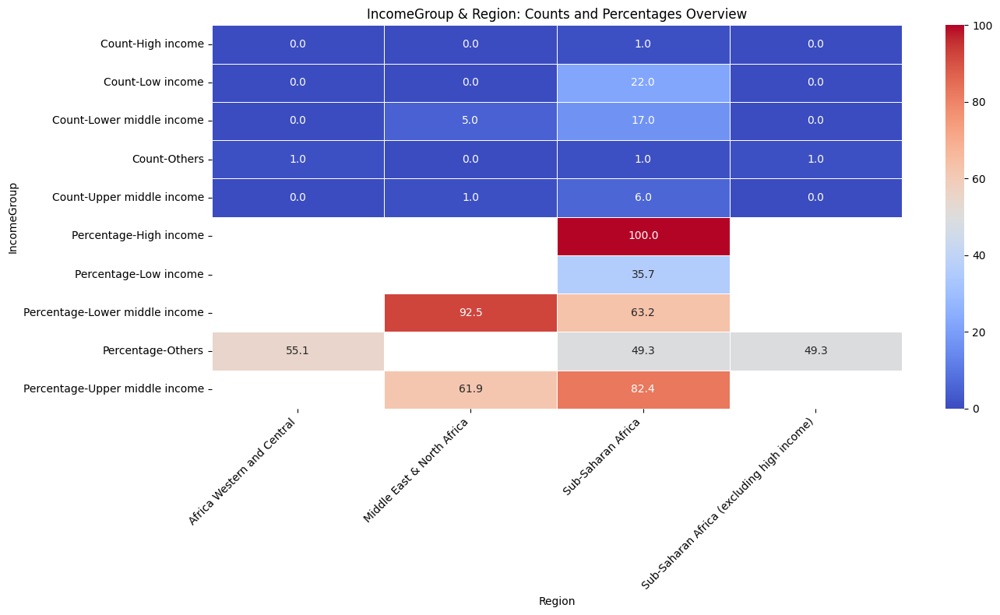

In [ ]:

# Create a pivot table to count occurrences of each combination of 'IncomeGroup' and 'Region'
pivot_table_count = predicted_data.pivot_table(index='IncomeGroup', columns='Region', aggfunc='size', fill_value=0)

# Pivot the data to calculate the average electricity access percentage for each combination of IncomeGroup and Region
pivot_table_avg = predicted_data.pivot_table(index='IncomeGroup', columns='Region', values='2024', aggfunc='mean')

# Combine the pivot tables vertically
combined_pivot_table = pd.concat([pivot_table_count, pivot_table_avg], keys=['Count', 'Percentage'])

# Plot the combined heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(combined_pivot_table, cmap='coolwarm', annot=True, fmt='.1f', linewidths=.5)
plt.title('IncomeGroup & Region: Counts and Percentages Overview')
plt.xlabel('Region')
plt.ylabel('IncomeGroup')
plt.yticks(rotation=0)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


## Objective 2

Identify similarities, differences, and patterns in electricity access among African countries

In [ ]:
"""
Analyze historical trends in electricity access across African countries relative to region and income.
•
Identify similarities, differences, and patterns in electricity access among African countries.
•
Develop predictive models to forecast future electricity access levels based on regional and income data.
•
Provide valuable analysis to inform targeted interventions for understanding electricity access in Africa.

### Cluster 1

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



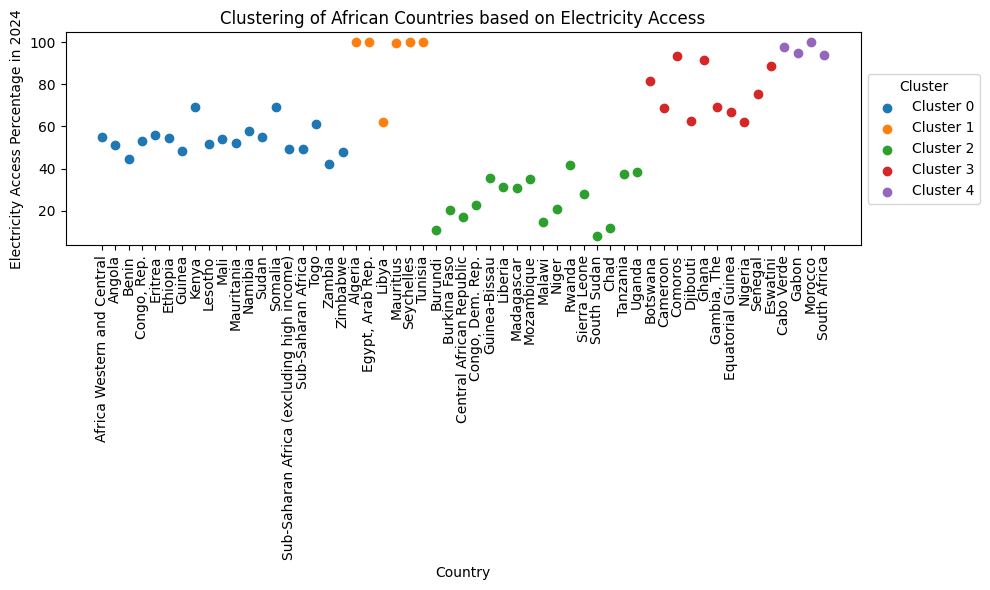

In [ ]:
# Filter the dataset to include only African countries
african_countries = predicted_data[predicted_data['Region'].str.contains('Africa')]

# Select relevant columns for clustering (e.g., electricity access percentages from 1990 to 2030)
electricity_data = african_countries.loc[:, '1990':'2030']

# Initialize KMeans model with desired number of clusters
num_clusters = 5  # You can adjust this number based on analysis
kmeans = KMeans(n_clusters=num_clusters, random_state=42)

# Fit KMeans model to the electricity data
kmeans.fit(electricity_data)

# Get cluster labels for each African country
cluster_labels = kmeans.labels_

# Add cluster labels to the dataset
african_countries['Cluster'] = cluster_labels

# Visualize the clusters
plt.figure(figsize=(10, 6))
for cluster_label in range(num_clusters):
    cluster_data = african_countries[african_countries['Cluster'] == cluster_label]
    plt.scatter(cluster_data['Country Name'], cluster_data['2024'], label=f'Cluster {cluster_label}')

plt.title('Clustering of African Countries based on Electricity Access')
plt.xlabel('Country')
plt.ylabel('Electricity Access Percentage in 2024')
plt.xticks(rotation=90)
plt.legend(title='Cluster', loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

### Region Cluster

<ipython-input-386-f634a75c6e3b>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



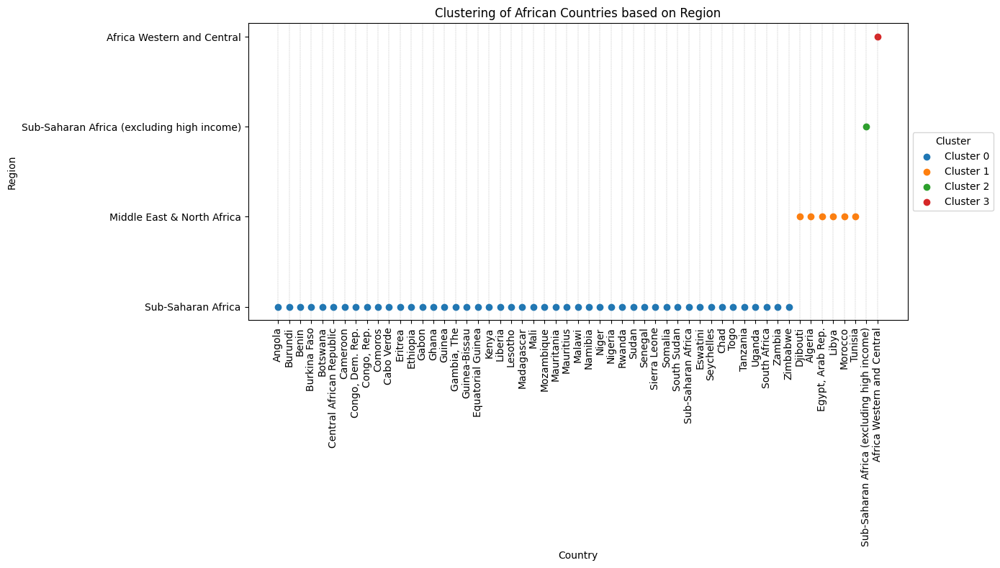

In [ ]:
# Filter the dataset to include only African countries
african_countries = predicted_data[predicted_data['Region'].str.contains('Africa')]

# Select relevant columns for clustering (e.g., Region)
region_data = african_countries[['Country Name', 'Region']]

# Map unique regions to numerical labels
region_mapping = {
    'Africa Western and Central': 0,
    'Sub-Saharan Africa': 1,
    'Middle East & North Africa': 2,
    'Sub-Saharan Africa (excluding high income)': 3
}
region_data['Region'] = region_data['Region'].map(region_mapping)

# Initialize KMeans model with desired number of clusters
num_clusters = 4  # You can adjust this number based on analysis
kmeans = KMeans(n_clusters=num_clusters, random_state=42)

# Fit KMeans model to the region data
kmeans.fit(region_data[['Region']])

# Get cluster labels for each African country
cluster_labels = kmeans.labels_

# Add cluster labels to the dataset
african_countries['Cluster'] = cluster_labels

# Visualize the clusters
plt.figure(figsize=(14, 8))
for cluster_label in range(num_clusters):
    cluster_data = african_countries[african_countries['Cluster'] == cluster_label]
    plt.scatter(cluster_data['Country Name'], cluster_data['Region'], label=f'Cluster {cluster_label}')

plt.title('Clustering of African Countries based on Region')
plt.xlabel('Country')
plt.ylabel('Region')
plt.xticks(rotation=90)
plt.legend(title='Cluster', loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.grid(axis='x', color='gray', linestyle='--', linewidth=0.2)  # Customizing vertical gridlines
#plt.grid(axis='y', color='blue', linestyle='-.', linewidth=0.5)  # Customizing horizontal gridlines

plt.show()


### IncomeGroup Cluster

<ipython-input-387-379915cca6e0>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



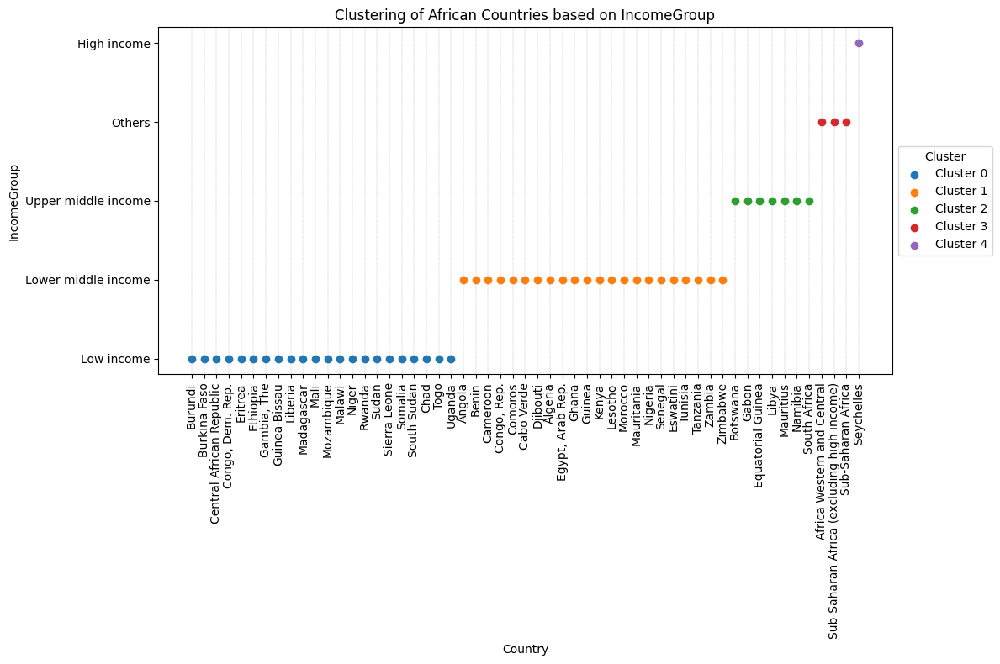

In [ ]:


# Filter the dataset to include only African countries
african_countries = predicted_data[predicted_data['Region'].str.contains('Africa')]

# Select relevant columns for clustering (e.g., IncomeGroup)
income_group_data = african_countries[['Country Name', 'IncomeGroup']]

# Map unique income groups to numerical labels
income_group_mapping = {
    'Others': 0,
    'Lower middle income': 1,
    'Low income': 2,
    'Upper middle income': 3,
    'High income': 4
}
income_group_data['IncomeGroup'] = income_group_data['IncomeGroup'].map(income_group_mapping)

# Initialize KMeans model with desired number of clusters
num_clusters = 5  # You can adjust this number based on analysis
kmeans = KMeans(n_clusters=num_clusters, random_state=42)

# Fit KMeans model to the income group data
kmeans.fit(income_group_data[['IncomeGroup']])

# Get cluster labels for each African country
cluster_labels = kmeans.labels_

# Add cluster labels to the dataset
african_countries['Cluster'] = cluster_labels

# Visualize the clusters
plt.figure(figsize=(12, 8))
for cluster_label in range(num_clusters):
    cluster_data = african_countries[african_countries['Cluster'] == cluster_label]
    plt.scatter(cluster_data['Country Name'], cluster_data['IncomeGroup'], label=f'Cluster {cluster_label}')

plt.title('Clustering of African Countries based on IncomeGroup')
plt.xlabel('Country')
plt.ylabel('IncomeGroup')
plt.xticks(rotation=90)
plt.legend(title='Cluster', loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.grid(axis='x', color='gray', linestyle='--', linewidth=0.2)  # Customizing vertical gridlines
#plt.grid(axis='y', color='blue', linestyle='-.', linewidth=0.5)  # Customizing horizontal gridlines

plt.show()


### IncomeGroup_Region Cluster

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



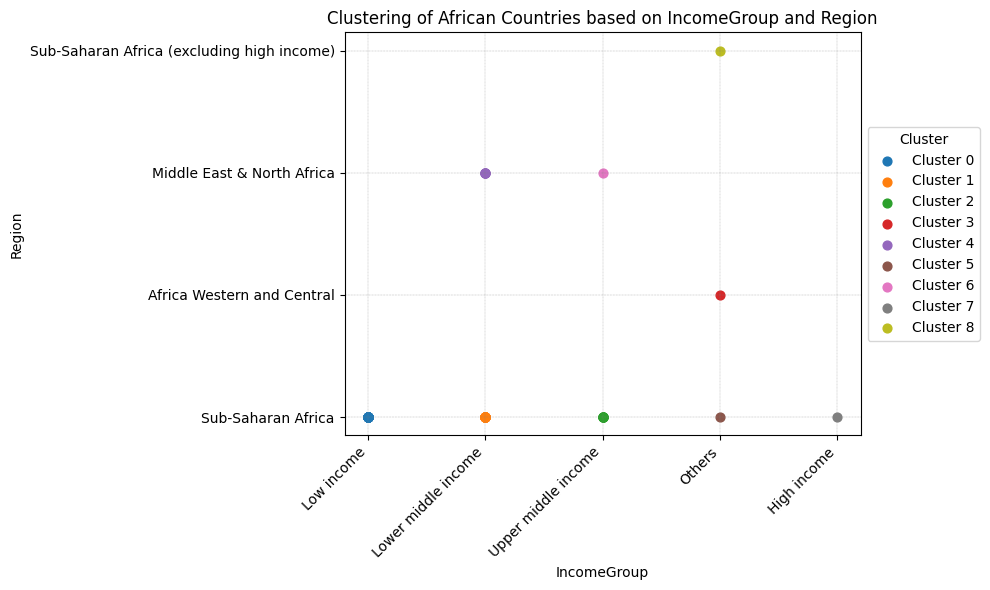

In [ ]:
# Filter the dataset to include only African countries
african_countries = predicted_data[predicted_data['Region'].str.contains('Africa')]

# Select relevant columns for clustering (e.g., IncomeGroup and Region)
clustering_columns = ['IncomeGroup', 'Region']
cluster_data = african_countries[clustering_columns]

# One-hot encode categorical variables
cluster_data_encoded = pd.get_dummies(cluster_data)

# Initialize KMeans model with desired number of clusters
num_clusters = 9  # You can adjust this number based on analysis
kmeans = KMeans(n_clusters=num_clusters, random_state=42)

# Fit KMeans model to the encoded cluster data
kmeans.fit(cluster_data_encoded)

# Get cluster labels for each African country
cluster_labels = kmeans.labels_

# Add cluster labels to the dataset
african_countries['Cluster'] = cluster_labels

# Visualize the clusters
plt.figure(figsize=(10, 6))
for cluster_label in range(num_clusters):
    cluster_data = african_countries[african_countries['Cluster'] == cluster_label]
    plt.scatter(cluster_data['IncomeGroup'], cluster_data['Region'],s= 40,  label=f'Cluster {cluster_label}')


plt.title('Clustering of African Countries based on IncomeGroup and Region')
plt.xlabel('IncomeGroup')
plt.ylabel('Region')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Cluster', loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
# Grid line size
plt.grid(axis='x', color='gray', linestyle='--', linewidth=0.2)  # Customizing vertical gridlines
plt.grid(axis='y', color='gray', linestyle='-.', linewidth=0.2)  # Customizing horizontal gridlines

plt.show()


### IncomeGroup_Region Cluster Data

In [ ]:
# Filter the dataset to include only African countries
african_countries = predicted_data[predicted_data['Region'].str.contains('Africa')]

# Select relevant columns for clustering (e.g., IncomeGroup and Region)
clustering_columns = ['IncomeGroup', 'Region']
cluster_data = african_countries[clustering_columns]

# One-hot encode categorical variables
cluster_data_encoded = pd.get_dummies(cluster_data)

# Initialize KMeans model with desired number of clusters
num_clusters = 9  # You can adjust this number based on analysis
kmeans = KMeans(n_clusters=num_clusters, random_state=42)

# Fit KMeans model to the encoded cluster data
kmeans.fit(cluster_data_encoded)

# Get cluster labels for each African country
cluster_labels = kmeans.labels_

# Add cluster labels to the dataset
african_countries['Cluster'] = cluster_labels

# Define a mapping between cluster labels and representations
cluster_representation_mapping = {
    0: 'Low-Income (Sub-Saharan Africa)',
    1: 'Lower Middle-Income (Sub-Saharan Africa)',
    2: 'Upper Middle-Income (Sub-Saharan Africa)',
    3: 'Others (Africa Western and Central)',
    4: 'Lower Middle-Income (Middle East & North Africa)',
    5: 'Others (Sub-Saharan Africa)',
    6: 'Upper Middle-Income (Middle East & North Africa)',
    7: 'High-Income (Sub-Saharan Africa)',
    8: 'Others (Sub-Saharan Africa excluding high income)'
}

# Initialize an empty list to store dictionaries for each cluster
cluster_data_list = []

# Iterate over each cluster
for cluster_label, cluster_representation in cluster_representation_mapping.items():
    # Filter data for the current cluster
    cluster_data = african_countries[african_countries['Cluster'] == cluster_label]
    # Extract the countries in the cluster and convert to CSV
    countries_csv = ', '.join(cluster_data['Country Name'].tolist())
    # Calculate the count of countries in the cluster
    count = len(cluster_data)
    # Create a dictionary for the cluster
    cluster_dict = {'Cluster': cluster_label, 'Representation': cluster_representation, 'Countries': countries_csv, 'Count': count}
    # Append the dictionary to the list
    cluster_data_list.append(cluster_dict)

# Create a DataFrame from the list of dictionaries
cluster_countries_df = pd.DataFrame(cluster_data_list)

# Display the DataFrame
print(cluster_countries_df)


   Cluster                                     Representation  \
0        0                    Low-Income (Sub-Saharan Africa)   
1        1           Lower Middle-Income (Sub-Saharan Africa)   
2        2           Upper Middle-Income (Sub-Saharan Africa)   
3        3                Others (Africa Western and Central)   
4        4   Lower Middle-Income (Middle East & North Africa)   
5        5                        Others (Sub-Saharan Africa)   
6        6   Upper Middle-Income (Middle East & North Africa)   
7        7                   High-Income (Sub-Saharan Africa)   
8        8  Others (Sub-Saharan Africa excluding high income)   

                                           Countries  Count  
0  Burundi, Burkina Faso, Central African Republi...     22  
1  Angola, Benin, Cameroon, Congo, Rep., Comoros,...     17  
2  Botswana, Gabon, Equatorial Guinea, Mauritius,...      6  
3                         Africa Western and Central      1  
4  Djibouti, Algeria, Egypt, Arab Rep.,

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [ ]:
# Save to CSV
cluster_countries_df.to_csv('cluster_countries_IncomeGroup_Region.csv', index=False)

In [ ]:
income_region_cluster = pd.read_csv('cluster_countries_IncomeGroup_Region.csv')


### Income_Region Cluster Data Analysis

In [ ]:
income_region_cluster.head()

,Cluster,Representation,Countries,Count
0,0,Low-Income (Sub-Saharan Africa),"Burundi, Burkina Faso, Central African Republi...",22
1,1,Lower Middle-Income (Sub-Saharan Africa),"Angola, Benin, Cameroon, Congo, Rep., Comoros,...",17
2,2,Upper Middle-Income (Sub-Saharan Africa),"Botswana, Gabon, Equatorial Guinea, Mauritius,...",6
3,3,Others (Africa Western and Central),Africa Western and Central,1
4,4,Lower Middle-Income (Middle East & North Africa),"Djibouti, Algeria, Egypt, Arab Rep., Morocco, ...",5


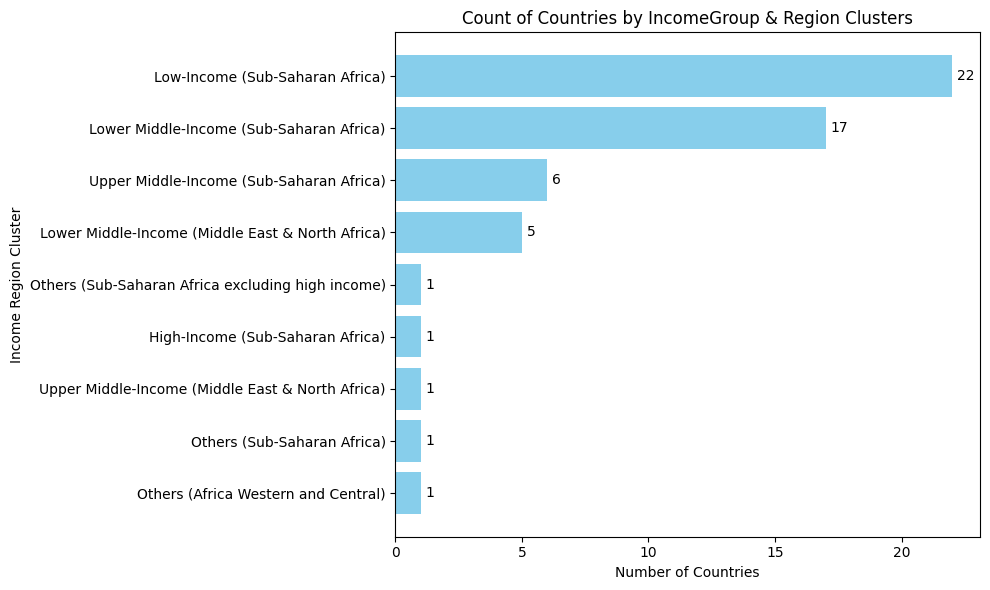

In [ ]:
# Ensure the 'income_region_cluster' DataFrame is sorted by 'Count'
income_region_cluster.sort_values(by='Count', ascending=True, inplace=True)

# Plotting the data
plt.figure(figsize=(10, 6))
bars = plt.barh(income_region_cluster['Representation'], income_region_cluster['Count'], color='skyblue')
plt.xlabel('Number of Countries')
plt.ylabel('Income Region Cluster')
plt.title('Count of Countries by IncomeGroup & Region Clusters')

# Displaying the count values on the bars
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.2, bar.get_y() + bar.get_height() / 2, f'{int(width)}', va='center')

# Display the plot
plt.tight_layout()
plt.show()


#### Electriciy Access Column Creation

In [ ]:
# List of years to drop
years_to_drop = [str(year) for year in range(1990, 2007)]

# Drop specified columns including 'Region' and 'IncomeGroup'
predicted_sliced = predicted_data.drop(columns=["Region", "IncomeGroup"] + years_to_drop)

# Display the first few rows of the sliced DataFrame
predicted_sliced.head()


,Country Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Africa Western and Central,40.76,41.74,41.87,41.84,45.91,44.05,47.05,47.65,46.76,...,54.22,53.44,54.25,55.06,55.87,56.68,57.49,58.31,59.11,59.93
1,Angola,37.50,38.49,33.85,34.98,34.60,37.26,38.40,32.00,42.00,...,48.22,48.77,49.90,51.04,52.17,53.30,54.43,55.57,56.70,57.83
2,Burundi,4.65,4.80,5.39,5.30,6.16,6.50,6.90,7.00,7.89,...,10.23,10.19,10.55,10.90,11.25,11.60,11.95,12.30,12.65,13.00
3,Benin,28.01,28.99,29.99,34.20,36.90,38.40,34.65,34.10,29.62,...,41.97,42.83,43.80,44.78,45.75,46.72,47.70,48.67,49.64,50.62
4,Burkina Faso,12.05,12.52,12.63,13.10,14.78,15.07,15.39,19.20,16.15,...,18.95,19.28,19.75,20.22,20.68,21.15,21.61,22.08,22.55,23.01


In [ ]:
#Create another column called "MEA" ( Mean Electricity Access) which would take the mean of values of all countries and round it to 2dp

predicted_sliced['MEA'] = round(predicted_sliced.loc[:, '2007':].mean(axis=1), 2)


In [ ]:
predicted_sliced.head()

,Country Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,...,2022,2023,2024,2025,2026,2027,2028,2029,2030,MEA
0,Africa Western and Central,40.76,41.74,41.87,41.84,45.91,44.05,47.05,47.65,46.76,...,53.44,54.25,55.06,55.87,56.68,57.49,58.31,59.11,59.93,50.66
1,Angola,37.50,38.49,33.85,34.98,34.60,37.26,38.40,32.00,42.00,...,48.77,49.90,51.04,52.17,53.30,54.43,55.57,56.70,57.83,44.98
2,Burundi,4.65,4.80,5.39,5.30,6.16,6.50,6.90,7.00,7.89,...,10.19,10.55,10.90,11.25,11.60,11.95,12.30,12.65,13.00,8.98
3,Benin,28.01,28.99,29.99,34.20,36.90,38.40,34.65,34.10,29.62,...,42.83,43.80,44.78,45.75,46.72,47.70,48.67,49.64,50.62,39.54
4,Burkina Faso,12.05,12.52,12.63,13.10,14.78,15.07,15.39,19.20,16.15,...,19.28,19.75,20.22,20.68,21.15,21.61,22.08,22.55,23.01,17.68


In [ ]:
# Create a new DF with columns Country Name and MEA
country_mea = predicted_sliced[['Country Name', 'MEA']]

# Display the first few rows of the new DataFrame
country_mea.head()


,Country Name,MEA
0,Africa Western and Central,50.66
1,Angola,44.98
2,Burundi,8.98
3,Benin,39.54
4,Burkina Faso,17.68


In [ ]:
#Recall income_region_cluster
income_region_cluster.sort_index(inplace=True)

In [ ]:
income_region_cluster.head()

,Cluster,Representation,Countries,Count
0,0,Low-Income (Sub-Saharan Africa),"Burundi, Burkina Faso, Central African Republi...",22
1,1,Lower Middle-Income (Sub-Saharan Africa),"Angola, Benin, Cameroon, Congo, Rep., Comoros,...",17
2,2,Upper Middle-Income (Sub-Saharan Africa),"Botswana, Gabon, Equatorial Guinea, Mauritius,...",6
3,3,Others (Africa Western and Central),Africa Western and Central,1
4,4,Lower Middle-Income (Middle East & North Africa),"Djibouti, Algeria, Egypt, Arab Rep., Morocco, ...",5


In [ ]:
# Initialize an empty dictionary to store MEA values for each country
mea_values = {}

# Iterate over each row in the DataFrame
for index, row in country_mea.iterrows():
    # Get the country name and MEA value
    country_name = row['Country Name']
    mea = row['MEA']

    # Assign the MEA value to the country name in the dictionary
    mea_values[country_name] = mea

# Print the dictionary where each country is assigned its MEA value
print(mea_values)


{'Africa Western and Central': 50.66, 'Angola': 44.98, 'Burundi': 8.98, 'Benin': 39.54, 'Burkina Faso': 17.68, 'Botswana': 69.2, 'Central African Republic': 14.25, 'Cameroon': 62.45, 'Congo, Dem. Rep.': 18.99, 'Congo, Rep.': 47.57, 'Comoros': 81.51, 'Cabo Verde': 89.74, 'Djibouti': 61.12, 'Algeria': 99.49, 'Egypt, Arab Rep.': 99.78, 'Eritrea': 49.61, 'Ethiopia': 43.34, 'Gabon': 90.69, 'Ghana': 80.67, 'Guinea': 40.28, 'Gambia, The': 60.22, 'Guinea-Bissau': 26.34, 'Equatorial Guinea': 66.49, 'Kenya': 55.96, 'Liberia': 21.45, 'Libya': 69.68, 'Lesotho': 39.74, 'Morocco': 96.99, 'Madagascar': 26.22, 'Mali': 43.82, 'Mozambique': 28.42, 'Mauritania': 44.82, 'Mauritius': 99.54, 'Malawi': 12.37, 'Namibia': 52.75, 'Niger': 17.88, 'Nigeria': 57.7, 'Rwanda': 32.23, 'Sudan': 49.23, 'Senegal': 66.64, 'Sierra Leone': 22.78, 'Somalia': 56.21, 'Sub-Saharan Africa (excluding high income)': 44.11, 'South Sudan': 5.97, 'Sub-Saharan Africa': 44.11, 'Eswatini': 72.9, 'Seychelles': 99.2, 'Chad': 10.05, 'Togo

In [ ]:
sections = [income_region_cluster["Countries"].iloc[i] for i in range(9)]
a, b, c, d, e, f, g, h, i = sections


In [ ]:
# Iterate over each section and its corresponding MEA values
for section, mea_values_section in zip(sections, mea_values_sections):
    print("Section:", section)
    print("MEA values:", mea_values_section)
    print()


Section: Burundi, Burkina Faso, Central African Republic, Congo, Dem. Rep., Eritrea, Ethiopia, Gambia, The, Guinea-Bissau, Liberia, Madagascar, Mali, Mozambique, Malawi, Niger, Rwanda, Sudan, Sierra Leone, Somalia, South Sudan, Chad, Togo, Uganda
MEA values: [8.98, 17.68, 14.25, None, None, 49.61, 43.34, None, None, 26.34, 21.45, 26.22, 43.82, 28.42, 12.37, 17.88, 32.23, 49.23, 22.78, 56.21, 5.97, 10.05, 51.09, 30.73]

Section: Angola, Benin, Cameroon, Congo, Rep., Comoros, Cabo Verde, Ghana, Guinea, Kenya, Lesotho, Mauritania, Nigeria, Senegal, Eswatini, Tanzania, Zambia, Zimbabwe
MEA values: [44.98, 39.54, 62.45, None, None, 81.51, 89.74, 80.67, 40.28, 55.96, 39.74, 44.82, 57.7, 66.64, 72.9, 30.27, 37.03, 44.35]

Section: Botswana, Gabon, Equatorial Guinea, Mauritius, Namibia, South Africa
MEA values: [69.2, 90.69, 66.49, 99.54, 52.75, 88.81]

Section: Africa Western and Central
MEA values: [50.66]

Section: Djibouti, Algeria, Egypt, Arab Rep., Morocco, Tunisia
MEA values: [61.12, 99

In [ ]:
# Assuming sections and mea_values_sections are defined as in the previous response
sections = [
    "Low-Income (Sub-Saharan Africa)",
    "Lower Middle-Income (Sub-Saharan Africa)",
    "Upper Middle-Income (Sub-Saharan Africa)",
    "Others (Africa Western and Central)",
    "Lower Middle-Income (Middle East & North Africa)",
    "Others (Sub-Saharan Africa)",
    "Upper Middle-Income (Middle East & North Africa)",
    "High-Income (Sub-Saharan Africa)",
    "Others (Sub-Saharan Africa excluding high income)"
]

# The MEA values sections extracted from the previous step
mea_values_sections = [
    [8.98, 17.68, 14.25, None, None, 49.61, 43.34, None, None, 26.34, 21.45, 26.22, 43.82, 28.42, 12.37, 17.88, 32.23, 49.23, 22.78, 56.21, 5.97, 10.05, 51.09, 30.73],
    [44.98, 39.54, 62.45, None, None, 81.51, 89.74, 80.67, 40.28, 55.96, 39.74, 44.82, 57.7, 66.64, 72.9, 30.27, 37.03, 44.35],
    [69.2, 90.69, 66.49, 99.54, 52.75, 88.81],
    [50.66],
    [61.12, 99.49, None, None, 96.99, 99.82],
    [44.11],
    [69.68],
    [99.2],
    [44.11]
]

# Calculate the mean for each section, ignoring None or NaN values
mean_values = []
for mea_values_section in mea_values_sections:
    # Filter out None values
    filtered_values = [value for value in mea_values_section if value is not None]
    # Calculate the mean
    mean_value = np.mean(filtered_values)
    mean_values.append(mean_value)

# Create a new DataFrame with the section names and their computed mean MEA values
mean_df = pd.DataFrame({
    "Section": sections,
    "Mean_EA": mean_values
})

# Drop the 'Section' column
mean_df = mean_df.drop(columns=["Section"])

# Round the 'Mean_EA' column to 2 decimal places
mean_df["Mean_EA"] = mean_df["Mean_EA"].round(2)

print(mean_df)


   Mean_EA
0    28.43
1    55.54
2    77.91
3    50.66
4    89.35
5    44.11
6    69.68
7    99.20
8    44.11


In [ ]:
# Concatenate income_region_cluster and mean_df
income_region_cluster_with_mean = pd.concat([income_region_cluster, mean_df], axis=1)

# Display the updated DataFrame
income_region_cluster_with_mean

,Cluster,Representation,Countries,Count,Mean_EA
0,0,Low-Income (Sub-Saharan Africa),"Burundi, Burkina Faso, Central African Republi...",22,28.43
1,1,Lower Middle-Income (Sub-Saharan Africa),"Angola, Benin, Cameroon, Congo, Rep., Comoros,...",17,55.54
2,2,Upper Middle-Income (Sub-Saharan Africa),"Botswana, Gabon, Equatorial Guinea, Mauritius,...",6,77.91
3,3,Others (Africa Western and Central),Africa Western and Central,1,50.66
4,4,Lower Middle-Income (Middle East & North Africa),"Djibouti, Algeria, Egypt, Arab Rep., Morocco, ...",5,89.35
5,5,Others (Sub-Saharan Africa),Sub-Saharan Africa,1,44.11
6,6,Upper Middle-Income (Middle East & North Africa),Libya,1,69.68
7,7,High-Income (Sub-Saharan Africa),Seychelles,1,99.20
8,8,Others (Sub-Saharan Africa excluding high income),Sub-Saharan Africa (excluding high income),1,44.11


In [ ]:
# Save as CSV
income_region_cluster_with_mean.to_csv('income_region_cluster_with_mean.csv', index=False)


#####Quick Path

In [ ]:
"""
# Initialize an empty dictionary to store MEA values for each country
mea_values = {}

# Iterate over each row in the DataFrame to populate the dictionary
for index, row in country_mea.iterrows():
    country_name = row['Country Name']
    mea = row['MEA']
    mea_values[country_name] = mea

# Extract sections from 'income_region_cluster'
sections = [income_region_cluster["Countries"].iloc[i] for i in range(len(income_region_cluster))]

# Extract MEA values for each section
mea_values_sections = []
for section in sections:
    countries = section.split(', ')
    mea_values_section = [mea_values.get(country) for country in countries]
    mea_values_sections.append(mea_values_section)

# Calculate the mean for each section, ignoring None or NaN values
mean_values = []
for mea_values_section in mea_values_sections:
    filtered_values = [value for value in mea_values_section if value is not None]
    mean_value = np.mean(filtered_values)
    mean_values.append(mean_value)

# Create a new DataFrame with the section names and their computed mean MEA values
mean_df = pd.DataFrame({
    "Representation": income_region_cluster['Representation'],
    "Mean_EA": mean_values
})

# Round the 'Mean_EA' column to 2 decimal places
mean_df["Mean_EA"] = mean_df["Mean_EA"].round(2)

# Drop the 'Representation' column from mean_df
mean_df = mean_df.drop(columns=["Representation"])

# Concatenate income_region_cluster and mean_df
income_region_cluster_with_mean = pd.concat([income_region_cluster, mean_df], axis=1)

# Display the updated DataFrame
print(income_region_cluster_with_mean)


   Cluster                                     Representation  \
0        0                    Low-Income (Sub-Saharan Africa)   
1        1           Lower Middle-Income (Sub-Saharan Africa)   
2        2           Upper Middle-Income (Sub-Saharan Africa)   
3        3                Others (Africa Western and Central)   
4        4   Lower Middle-Income (Middle East & North Africa)   
5        5                        Others (Sub-Saharan Africa)   
6        6   Upper Middle-Income (Middle East & North Africa)   
7        7                   High-Income (Sub-Saharan Africa)   
8        8  Others (Sub-Saharan Africa excluding high income)   

                                           Countries  Count  Mean_EA  
0  Burundi, Burkina Faso, Central African Republi...     22    28.43  
1  Angola, Benin, Cameroon, Congo, Rep., Comoros,...     17    55.54  
2  Botswana, Gabon, Equatorial Guinea, Mauritius,...      6    77.91  
3                         Africa Western and Central      1    50

# income_region_cluster_with_meanEA

In [ ]:
income_region_cluster_with_mean = pd.read_csv("/content/income_region_cluster_with_mean.csv")

In [ ]:
# Preview Dataset
income_region_cluster_with_mean

,Cluster,Representation,Countries,Count,Mean_EA
0,0,Low-Income (Sub-Saharan Africa),"Burundi, Burkina Faso, Central African Republi...",22,28.43
1,1,Lower Middle-Income (Sub-Saharan Africa),"Angola, Benin, Cameroon, Congo, Rep., Comoros,...",17,55.54
2,2,Upper Middle-Income (Sub-Saharan Africa),"Botswana, Gabon, Equatorial Guinea, Mauritius,...",6,77.91
3,3,Others (Africa Western and Central),Africa Western and Central,1,50.66
4,4,Lower Middle-Income (Middle East & North Africa),"Djibouti, Algeria, Egypt, Arab Rep., Morocco, ...",5,89.35
5,5,Others (Sub-Saharan Africa),Sub-Saharan Africa,1,44.11
6,6,Upper Middle-Income (Middle East & North Africa),Libya,1,69.68
7,7,High-Income (Sub-Saharan Africa),Seychelles,1,99.20
8,8,Others (Sub-Saharan Africa excluding high income),Sub-Saharan Africa (excluding high income),1,44.11


Shape

In [ ]:
income_region_cluster_with_mean.shape

(9, 5)

Info

In [ ]:
income_region_cluster_with_mean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Cluster         9 non-null      int64  
 1   Representation  9 non-null      object 
 2   Countries       9 non-null      object 
 3   Count           9 non-null      int64  
 4   Mean_EA         9 non-null      float64
dtypes: float64(1), int64(2), object(2)
memory usage: 488.0+ bytes


De-Stats

In [ ]:
summary_stats = income_region_cluster_with_mean.describe()
summary_stats

,Cluster,Count,Mean_EA
count,9.000000,9.000000,9.000000
mean,4.000000,6.111111,62.110000
std,2.738613,7.928500,23.402031
min,0.000000,1.000000,28.430000
25%,2.000000,1.000000,44.110000
50%,4.000000,1.000000,55.540000
75%,6.000000,6.000000,77.910000
max,8.000000,22.000000,99.200000


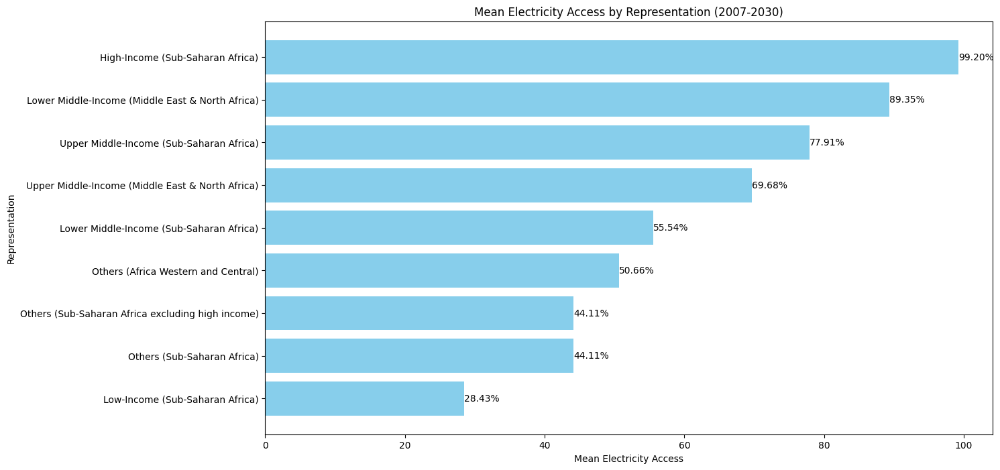

In [ ]:
# Sorting the DataFrame by 'Mean_EA' in ascending order
income_region_cluster_with_mean_sorted = income_region_cluster_with_mean.sort_values(by='Mean_EA')

# Plotting the Mean_EA for each Representation
plt.figure(figsize=(14, 8))
bars = plt.barh(income_region_cluster_with_mean_sorted['Representation'], income_region_cluster_with_mean_sorted['Mean_EA'], color='skyblue')
plt.xlabel('Mean Electricity Access')
plt.ylabel('Representation')
plt.title('Mean Electricity Access by Representation (2007-2030)')

# Adding the percentage values on the bars
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2,
             f'{bar.get_width():.2f}%',
             va='center', ha='left', fontsize=10)

plt.show()

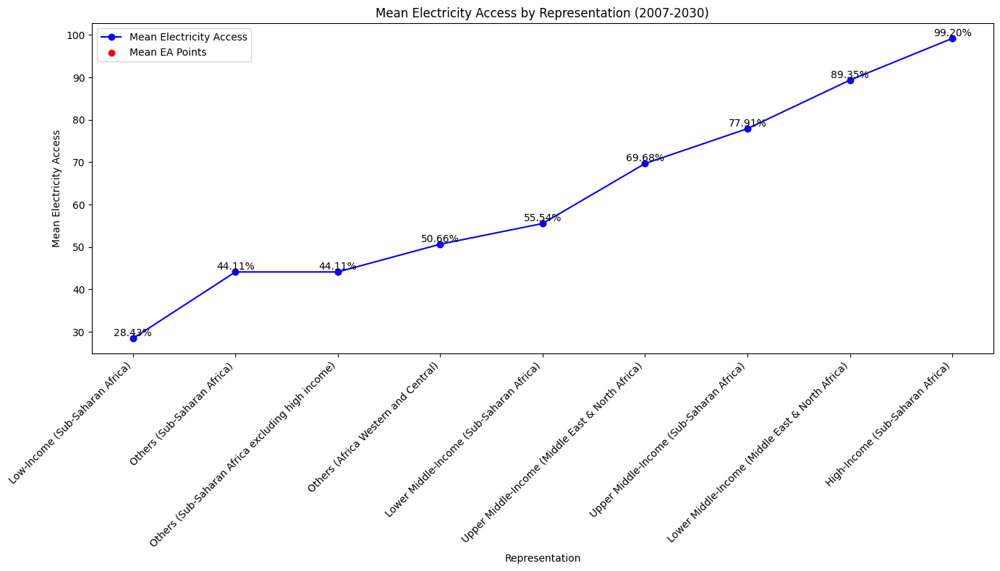

In [ ]:


# Sorting the DataFrame by 'Mean_EA' in ascending order
income_region_cluster_with_mean = income_region_cluster_with_mean.sort_values(by='Mean_EA')

# Extracting sorted values
representations = income_region_cluster_with_mean['Representation']
mean_ea = income_region_cluster_with_mean['Mean_EA']

# Plotting the Mean_EA for each Representation as a line and scatter plot
plt.figure(figsize=(14, 8))

# Line plot
plt.plot(representations, mean_ea, marker='o', linestyle='-', color='b', label='Mean Electricity Access')

# Scatter plot
plt.scatter(representations, mean_ea, color='r', label='Mean EA Points')

# Adding labels and title
plt.xlabel('Representation')
plt.ylabel('Mean Electricity Access')
plt.title('Mean Electricity Access by Representation (2007-2030)')
plt.xticks(rotation=45, ha='right')
plt.legend()

# Adding the percentage values on the points
for i, ea in enumerate(mean_ea):
    plt.text(i, ea, f'{ea:.2f}%', ha='center', va='bottom')

plt.tight_layout()
plt.show()
